<a href="https://colab.research.google.com/github/pattyhumemills/pattyhumemills.github.io/blob/master/Using%20FBProphet%20to%20Predict%20Real%20Estate%20prices.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>



```
# Import packages, Zillow data to analyze and forecast real estate prices.
```



In [ ]:
#!pip install fbprophet
#!pip install geopandas
#!pip install arcgis
#!apt-get install -qq libgdal-dev libproj-dev
#!pip install --no-binary shapely shapely --force
#!pip install cartopy
#!pip install PTable
#!pip install plotly

In [ ]:
!apt-get -qq install python-cartopy python3-cartopy
import cartopy

Selecting previously unselected package python-pkg-resources.
(Reading database ... 144487 files and directories currently installed.)
Preparing to unpack .../0-python-pkg-resources_39.0.1-2_all.deb ...
Unpacking python-pkg-resources (39.0.1-2) ...
Selecting previously unselected package python-pyshp.
Preparing to unpack .../1-python-pyshp_1.2.12+ds-1_all.deb ...
Unpacking python-pyshp (1.2.12+ds-1) ...
Selecting previously unselected package python-shapely.
Preparing to unpack .../2-python-shapely_1.6.4-1_amd64.deb ...
Unpacking python-shapely (1.6.4-1) ...
Selecting previously unselected package python-six.
Preparing to unpack .../3-python-six_1.11.0-2_all.deb ...
Unpacking python-six (1.11.0-2) ...
Selecting previously unselected package python-cartopy:amd64.
Preparing to unpack .../4-python-cartopy_0.14.2+dfsg1-2build3_amd64.deb ...
Unpacking python-cartopy:amd64 (0.14.2+dfsg1-2build3) ...
Selecting previously unselected package python3-pkg-resources.
Preparing to unpack .../5-pyth

In [ ]:
import timeit
import pandas as pd
from fbprophet import Prophet
import numpy as np
import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')
from google.colab import files
import datetime as dt
import io
import time as time
from tqdm import tqdm
from multiprocessing import Pool, cpu_count
import matplotlib.dates as mdates
import matplotlib.ticker as mtick
import seaborn as sns
from prettytable import PrettyTable
from pandas.plotting import table
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.io.shapereader as shpreader
import matplotlib.dates as mdates
import time as time
from tqdm import tqdm
from multiprocessing import Pool, cpu_count
from fbprophet.diagnostics import cross_validation
from fbprophet.plot import plot_cross_validation_metric
from fbprophet.diagnostics import performance_metrics
from datetime import datetime
from fbprophet.plot import plot_plotly

#Obtain

In [ ]:
#This works but using my mounted google drive works FASTER
#uploaded = files.upload()
#zillow_DF = pd.read_csv(io.BytesIO(uploaded['Zip_Zhvi_SingleFamilyResidence.csv']))

Saving Zip_Zhvi_SingleFamilyResidence.csv to Zip_Zhvi_SingleFamilyResidence (2).csv


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
copied_path = '/content/drive/My Drive/Lab 6/Zip_Zhvi_SingleFamilyResidence.csv' 
zillow_DF = pd.read_csv(copied_path)

In [ ]:
zillow_DF.head()

,RegionID,SizeRank,RegionName,RegionType,StateName,State,City,Metro,CountyName,1996-01-31,1996-02-29,1996-03-31,1996-04-30,1996-05-31,1996-06-30,1996-07-31,1996-08-31,1996-09-30,1996-10-31,1996-11-30,1996-12-31,1997-01-31,1997-02-28,1997-03-31,1997-04-30,1997-05-31,1997-06-30,1997-07-31,1997-08-31,1997-09-30,1997-10-31,1997-11-30,1997-12-31,1998-01-31,1998-02-28,1998-03-31,1998-04-30,1998-05-31,1998-06-30,1998-07-31,...,2016-12-31,2017-01-31,2017-02-28,2017-03-31,2017-04-30,2017-05-31,2017-06-30,2017-07-31,2017-08-31,2017-09-30,2017-10-31,2017-11-30,2017-12-31,2018-01-31,2018-02-28,2018-03-31,2018-04-30,2018-05-31,2018-06-30,2018-07-31,2018-08-31,2018-09-30,2018-10-31,2018-11-30,2018-12-31,2019-01-31,2019-02-28,2019-03-31,2019-04-30,2019-05-31,2019-06-30,2019-07-31,2019-08-31,2019-09-30,2019-10-31,2019-11-30,2019-12-31,2020-01-31,2020-02-29,2020-03-31
0,61639,0,10025,Zip,NY,NY,New York,New York-Newark-Jersey City,New York County,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1524562.0,1525605.0,1525955.0,1528604.0,1527843.0,1530509.0,1525013.0,1531236.0,1532307.0,1543260.0,1534946.0,1527048.0,1508495.0,1498638.0,1494872.0,1487969.0,1480591.0,1471324.0,1462476.0,1456223.0,1448110.0,1446622.0,1451579.0,1452858.0,1453112.0,1439554.0,1426900.0,1416568.0,1415022.0,1414474.0,1413747.0,1405862.0,1402547.0,1390420.0,1381621.0,1375725.0,1374714.0,1381453.0,1385737.0,1389268.0
1,84654,1,60657,Zip,IL,IL,Chicago,Chicago-Naperville-Elgin,Cook County,364892.0,364162.0,363605.0,362963.0,361660.0,361342.0,360662.0,361804.0,363561.0,366592.0,370077.0,372842.0,376806.0,380122.0,384081.0,385663.0,389062.0,389359.0,390182.0,388087.0,385729.0,381688.0,377848.0,376493.0,374914.0,375094.0,375012.0,378067.0,380789.0,386605.0,392801.0,...,958178.0,956528.0,951529.0,955244.0,958096.0,959882.0,958726.0,956879.0,958371.0,961171.0,960878.0,957985.0,958428.0,964051.0,969547.0,968807.0,968566.0,969572.0,972936.0,973010.0,972447.0,972684.0,975094.0,978629.0,981362.0,979667.0,976810.0,975419.0,975366.0,975741.0,974693.0,975616.0,975734.0,975251.0,974238.0,973104.0,971908.0,972038.0,973671.0,975642.0
2,61637,2,10023,Zip,NY,NY,New York,New York-Newark-Jersey City,New York County,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1669910.0,1661199.0,1639318.0,1622378.0,1613382.0,1611625.0,1609075.0,1611388.0,1615755.0,1619823.0,1609176.0,1597282.0,1581756.0,1572273.0,1573601.0,1578799.0,1585506.0,1587796.0,1591265.0,1596660.0,1598258.0,1596017.0,1595032.0,1592948.0,1590038.0,1576594.0,1562766.0,1552128.0,1545711.0,1540137.0,1528603.0,1514894.0,1502233.0,1492429.0,1486122.0,1480426.0,1476509.0,1478980.0,1479301.0,1474994.0
3,91982,3,77494,Zip,TX,TX,Katy,Houston-The Woodlands-Sugar Land,Harris County,200475.0,200723.0,200526.0,199337.0,198200.0,197534.0,198298.0,197986.0,197333.0,196543.0,197444.0,199129.0,201687.0,202931.0,204207.0,206413.0,208870.0,210582.0,210250.0,212394.0,214904.0,217109.0,216177.0,214468.0,211736.0,210126.0,208420.0,207481.0,206443.0,206033.0,205925.0,...,331031.0,330770.0,331485.0,332276.0,332365.0,331319.0,331016.0,331256.0,331356.0,331165.0,331177.0,331223.0,332171.0,333159.0,333470.0,333247.0,333699.0,334667.0,335386.0,335194.0,335478.0,335777.0,336150.0,336558.0,336390.0,336776.0,336806.0,336869.0,336217.0,335679.0,335536.0,335878.0,335940.0,336092.0,336119.0,336083.0,336154.0,335860.0,336037.0,336483.0
4,84616,4,60614,Zip,IL,IL,Chicago,Chicago-Naperville-Elgin,Cook County,546663.0,546231.0,545451.0,545391.0,543066.0,543084.0,542380.0,545254.0,548142.0,552660.0,557791.0,562238.0,566446.0,569659.0,573409.0,575403.0,581567.0,584316.0,587753.0,585957.0,583932.0,580996.0,578241.0,578355.0,580711.0,585527.0,591659.0,597955.0,604759.0,611702.0,620591.0,...,1173759.0,1175981.0,1174668.0,1182530.0,1188431.0,1192806.0,1193344.0,1191314.0,1192626.0,1196983.0,1199400.0,1199387.0,1202485.0,120

In [ ]:
### Get unemployment data. Use smaller unemployment for Dec 2019 to get a list of which places to get a better view of the prophet analysis.
unemployment = pd.read_csv('/content/drive/My Drive/Lab 6/laucnty19.csv')
unemployment_cleaned = unemployment.drop([0,1,2,3,4])
unemployment_cleaned.columns = ['LAUS_code','State_FIPS','County_FIPS','County_Name','Year','Remove1','Labor_Force','Employed',"Unemployed",'Unemployment_Rate']
unemployment_cleaned = unemployment_cleaned.drop('Remove1',axis=1)
unemployment_cleaned.head()

,LAUS_code,State_FIPS,County_FIPS,County_Name,Year,Labor_Force,Employed,Unemployed,Unemployment_Rate
5,CN0100100000000,01,001,"Autauga County, AL",2019,"26,172","25,458",714,2.7
6,CN0100300000000,01,003,"Baldwin County, AL",2019,"97,328","94,675","2,653",2.7
7,CN0100500000000,01,005,"Barbour County, AL",2019,"8,537","8,213",324,3.8
8,CN0100700000000,01,007,"Bibb County, AL",2019,"8,685","8,419",266,3.1
9,CN0100900000000,01,009,"Blount County, AL",2019,"25,331","24,655",676,2.7


In [ ]:
# Crime Rate Statistics Link below has four sheets
# https://query.data.world/s/5w4kelgbxtf6yjdyvermemfkv4q3zy
crime_by_metro = pd.read_excel('https://query.data.world/s/5w4kelgbxtf6yjdyvermemfkv4q3zy',sheet_name='Metros Alphabetical')
crime_by_metro.columns = ["Metro",'Crime_rate_note',"Population",'Violent_Crime','Murder_NonNegManslaughter','Rape','Robbery','Aggravated_Assault','Property_Crime','Burglary','Larceny','MotorVehicleTheft']
crime_by_metro['Metro'] = crime_by_metro.Metro.str.replace(",\s[A-Z][A-Z]\s[A-Z].[A-Z].[A-Z].", "").str.strip()
crime_by_metro['Metro'] = crime_by_metro.Metro.str.replace("[0-9]", "").str.strip()
crime_by_metro['Metro'] = crime_by_metro.Metro.str.replace(",\s[A-Z][A-Z]-[A-Z][A-Z]\s[A-Z].[A-Z].[A-Z].,", "").str.strip()
crime_by_metro['Metro'] = crime_by_metro.Metro.str.replace(",\s[A-Z][A-Z]-[A-Z][A-Z]\s[A-Z].[A-Z].[A-Z].", "").str.strip()
crime_by_metro['Metro'] = crime_by_metro.Metro.str.replace(",\s[A-Z][A-Z]-[A-Z][A-Z]-[A-Z][A-Z]\s[A-Z].[A-Z].[A-Z].", "").str.strip()
crime_by_metro['Metro'] = crime_by_metro.Metro.str.replace(",\s[A-Z][A-Z]-[A-Z][A-Z]-[A-Z][A-Z]\s[A-Z].[A-Z].", "").str.strip()
crime_by_metro['Metro'] = crime_by_metro.Metro.str.replace(",\s[A-Z][A-Z]-[A-Z][A-Z]\s[A-Z].[A-Z].", "").str.strip()
crime_by_metro['Metro'] = crime_by_metro.Metro.str.replace(",\s[A-Z][A-Z]-[A-Z][A-Z]-[A-Z][A-Z]-[A-Z][A-Z]\s[A-Z].[A-Z].", "").str.strip()
crime_by_metro['Metro'] = crime_by_metro.Metro.str.replace(",\s[A-Z][A-Z]-[A-Z][A-Z]-[A-Z][A-Z]-[A-Z][A-Z]\s[A-Z].[A-Z].[A-Z].", "").str.strip()
crime_by_metro['Metro'] = crime_by_metro.Metro.str.replace(",\s[A-Z][A-Z]\s[A-Z].[A-Z].", "").str.strip()
crime_by_metro.head(15)

,Metro,Crime_rate_note,Population,Violent_Crime,Murder_NonNegManslaughter,Rape,Robbery,Aggravated_Assault,Property_Crime,Burglary,Larceny,MotorVehicleTheft
0,Abilene,"Rate per 100,000 inhabitants",169885,361.4,6.5,46.5,80.6,227.8,2903.1,649.9,2077.9,175.4
1,Akron,"Rate per 100,000 inhabitants",703561,253.1,6,48.9,77.3,121,2564.5,563.3,1857.3,144.0
2,Albany,"Rate per 100,000 inhabitants",152566,734.8,11.8,28.2,159.9,534.9,3770.8,949.8,2676.9,144.2
3,Albany,"Rate per 100,000 inhabitants",122030,113.9,0,27.9,27.0,59,2690.3,378.6,2101.1,210.6
4,Albany-Schenectady-Troy,"Rate per 100,000 inhabitants",878166,289.7,2,38.9,68.7,180,2009.5,281.5,1646.0,82.0
5,Albuquerque,"Rate per 100,000 inhabitants",907140,901,8.3,57.3,238.7,596.7,5288.7,951.1,3319.6,1018.0
6,Alexandria,"Rate per 100,000 inhabitants",154032,923.2,7.8,50.0,116.9,748.5,4697.7,1271.2,3111.7,314.9
7,Allentown-Bethlehem-Easton,"Rate per 100,000 inhabitants",831770,NaN,2.6,19.4,58.3,NaN,NaN,264.7,NaN,89.1
8,Altoona,"Rate per 100,000 inhabitants",124942,212.9,0.8,32.0,36.8,143.3,1359,190.5,1124.5,44.0
9,Amarillo,"Rate per 100,000 inhabitants",263223,592.7,5.3,71.4,102.2,413.7,3932.8,761.3,2781.3,390.2


#Scrub

In [ ]:
zillow_DF1 = zillow_DF.drop(columns = ['RegionID','RegionType','StateName','State','City','Metro','CountyName','SizeRank'])
# convert zip code (aka RegionName) to col names
zillow_DF1 = zillow_DF1.set_index('RegionName')
# transpose time series matrices
zillow_long_DF1 = zillow_DF1.T
# convert indices to date time
zillow_long_DF1.index = pd.to_datetime(zillow_long_DF1.index)
zillow_long_DF1.head()

RegionName,10025,60657,10023,77494,60614,77449,10002,77084,79936,60640,11226,10467,78660,94109,926,10016,37013,32162,60647,11201,11235,11375,90250,78130,37211,10029,10009,77573,60618,77584,10011,20002,10128,28269,78613,77433,78572,30349,79912,75052,...,8541,2714,1615,52204,56210,2912,32511,25305,32072,55144,21405,63875,86343,20052,75599,501,1063,3575,20635,22807,2203,93282,40404,89155,84322,95229,73019,95721,77399,38959,4420,4109,7703,742,803,802,820,822,831,851
1996-01-31,NaN,364892.0,NaN,200475.0,546663.0,97521.0,NaN,97381.0,82374.0,254388.0,219465.0,239931.0,144867.0,616693.0,NaN,NaN,110296.0,109755.0,170128.0,510476.0,230762.0,293530.0,170408.0,NaN,110050.0,NaN,NaN,NaN,220733.0,138183.0,NaN,144172.0,NaN,130817.0,166847.0,161268.0,NaN,94712.0,124293.0,97847.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,418753.0,NaN,71548.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,193704.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1996-02-29,NaN,364162.0,NaN,200723.0,546231.0,97513.0,NaN,97405.0,82330.0,252774.0,218301.0,239200.0,144705.0,621942.0,NaN,NaN,110744.0,110669.0,170608.0,511157.0,230155.0,291813.0,170715.0,NaN,110378.0,NaN,NaN,NaN,220549.0,138336.0,NaN,142533.0,NaN,130876.0,166368.0,161478.0,NaN,95222.0,124084.0,97855.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,70249.0,420003.0,NaN,70971.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,193456.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1996-03-31,NaN,363605.0,NaN,200526.0,545451.0,97471.0,NaN,97330.0,82300.0,251468.0,217211.0,238902.0,144605.0,625642.0,NaN,NaN,111127.0,110830.0,171100.0,511756.0,230408.0,290892.0,171065.0,NaN,110717.0,NaN,NaN,NaN,220433.0,138904.0,NaN,141625.0,NaN,131044.0,165657.0,161583.0,NaN,95625.0,123981.0,97920.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,69615.0,419014.0,NaN,70884.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,193455.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1996-04-30,NaN,362963.0,NaN,199337.0,545391.0,97491.0,NaN,97323.0,82263.0,248948.0,215847.0,237644.0,144509.0,629519.0,NaN,NaN,111920.0,111554.0,171895.0,513792.0,231098.0,289045.0,171689.0,NaN,111428.0,NaN,NaN,NaN,220919.0,139582.0,NaN,139416.0,NaN,131543.0,164537.0,162037.0,NaN,96459.0,123801.0,98047.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,69249.0,419297.0,NaN,70868.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,193250.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1996-05-31,NaN,361660.0,NaN,198200.0,543066.0,97486.0,NaN,97280.0,82344.0,246695.0,215392.0,237158.0,144543.0,630085.0,NaN,NaN,112740.0,111591.0,171957.0,513345.0,232541.0,288202.0,172288.0,NaN,112133.0,NaN,NaN,NaN,220817.0,140240.0,NaN,138181.0,NaN,132201.0,163449.0,162341.0,NaN,97204.0,123879.0,98205.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,68326.0,417464.0,NaN,71459.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,193187.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Subset out the AR data for the metro areas of Hot Springs, Little Rock (et al.), Searcy, Fayetteville (et al.)
metro = ["Hot Springs","Little Rock-North Little Rock-Conway","Searcy","Fayetteville-Springdale-Rogers"]
AR_df = zillow_DF.loc[zillow_DF['Metro'].isin(metro)]
AR_df1 = AR_df.drop(columns = ['RegionID','RegionType','StateName','State','City','RegionName','CountyName','SizeRank'])
AR_df1 = AR_df1.groupby(['Metro']).mean()
#AR_df1
# transpose time series matrices
AR_long_DF1 = AR_df1.T
# convert indices to date time
AR_long_DF1 = AR_long_DF1.reset_index()
AR_long_DF1['index'] = pd.to_datetime(AR_long_DF1['index'])
AR_long_DF1.head()


Metro,index,Fayetteville-Springdale-Rogers,Hot Springs,Little Rock-North Little Rock-Conway,Searcy
0,1996-01-31,93923.137931,78546.8,84050.083333,56772.416667
1,1996-02-29,93050.700000,77961.6,84245.125000,56666.000000
2,1996-03-31,93128.100000,77987.0,84856.102041,56678.666667
3,1996-04-30,93273.733333,78008.4,85225.836735,56677.500000
4,1996-05-31,93489.100000,78266.4,85586.387755,56733.750000


In [ ]:
metroTX = ["Houston-The Woodlands-Sugar Land","Texarkana","College Station-Bryan","Austin-Round Rock","Dallas-Fort Worth-Arlington","San Antonio-New Braunfels"]
TX_df = zillow_DF.loc[zillow_DF['Metro'].isin(metroTX)]
TX_df1 = TX_df.drop(columns = ['RegionID','RegionType','StateName','State','City','RegionName','CountyName','SizeRank'])
TX_df1 = TX_df1.groupby(['Metro']).mean()
#TX_df1
# transpose time series matrices
TX_long_DF1 = TX_df1.T
# convert indices to date time
TX_long_DF1 = TX_long_DF1.reset_index()
TX_long_DF1['index'] = pd.to_datetime(TX_long_DF1['index'])
TX_long_DF1.head()
TX_long_DF1.columns

Index(['index', 'Austin-Round Rock', 'College Station-Bryan',
       'Dallas-Fort Worth-Arlington', 'Houston-The Woodlands-Sugar Land',
       'San Antonio-New Braunfels', 'Texarkana'],
      dtype='object', name='Metro')

In [ ]:
metroMA = ["Boston-Cambridge-Newton","Providence-Warwick","Worcester","Vineyard Haven"]
stateMA = ['MA']
MA_df = zillow_DF.loc[zillow_DF['State'].isin(stateMA)]
MA_df = MA_df.loc[MA_df['Metro'].isin(metroMA)]
MA_df1 = MA_df.drop(columns = ['RegionID','RegionType','StateName','State','City','RegionName','CountyName','SizeRank'])
MA_df1 = MA_df1.groupby(['Metro']).mean()
#MA_df1
# transpose time series matrices
MA_long_DF1 = MA_df1.T
# convert indices to date time
MA_long_DF1 = MA_long_DF1.reset_index()
MA_long_DF1['index'] = pd.to_datetime(MA_long_DF1['index'])
MA_long_DF1.head()

Metro,index,Boston-Cambridge-Newton,Providence-Warwick,Vineyard Haven,Worcester
0,1996-01-31,224454.601990,153601.677419,241889.6,137552.835616
1,1996-02-29,224670.282178,153245.387097,241479.6,137764.246575
2,1996-03-31,224779.603960,153222.064516,241179.0,137806.684932
3,1996-04-30,224994.589109,153004.290323,241024.8,138132.301370
4,1996-05-31,225381.216749,152725.290323,241541.4,138404.232877


In [ ]:
metroAZ = ["Phoenix-Mesa-Scottsdale","Tucson","Lake Havasu City-Kingman","Nogales"]
AZ_df = zillow_DF.loc[zillow_DF['Metro'].isin(metroAZ)]
AZ_df1 = AZ_df.drop(columns = ['RegionID','RegionType','StateName','State','City','RegionName','CountyName','SizeRank'])
AZ_df1 = AZ_df1.groupby(['Metro']).mean()
#AZ_df1
# transpose time series matrices
AZ_long_DF1 = AZ_df1.T
# convert indices to date time
AZ_long_DF1 = AZ_long_DF1.reset_index()
AZ_long_DF1['index'] = pd.to_datetime(AZ_long_DF1['index'])
AZ_long_DF1.head()


Metro,index,Lake Havasu City-Kingman,Nogales,Phoenix-Mesa-Scottsdale,Tucson
0,1996-01-31,99740.307692,93788.4,135404.775194,126274.684211
1,1996-02-29,99709.076923,93998.6,135706.705426,126616.210526
2,1996-03-31,99734.846154,94089.0,135378.169231,126983.815789
3,1996-04-30,99871.538462,94222.0,136136.615385,127613.289474
4,1996-05-31,100132.846154,94426.6,136914.461538,128176.131579


In [ ]:
unemployment_cleaned.dtypes
unemployment_cleaned['Labor_Force'] =unemployment_cleaned['Labor_Force'].str.replace(',', '')
unemployment_cleaned['Labor_Force'] = pd.to_numeric(unemployment_cleaned.Labor_Force)
unemployment_cleaned['Employed'] = unemployment_cleaned['Employed'].str.replace(',','')
unemployment_cleaned['Employed'] = pd.to_numeric(unemployment_cleaned.Employed)
unemployment_cleaned['Unemployed'] = unemployment_cleaned['Unemployed'].str.replace(',','')
unemployment_cleaned['Unemployed'] = pd.to_numeric(unemployment_cleaned.Unemployed)
unemployment_cleaned['Unemployment_Rate'] = unemployment_cleaned['Unemployment_Rate'].str.replace(',','')
unemployment_cleaned['Unemployment_Rate'] = pd.to_numeric(unemployment_cleaned.Unemployment_Rate.str.strip())
unemployment_sorted = unemployment_cleaned.sort_values(by='Unemployment_Rate')
unemployment_sorted.head(100)

,LAUS_code,State_FIPS,County_FIPS,County_Name,Year,Labor_Force,Employed,Unemployed,Unemployment_Rate
2677,CN4830100000000,48,301,"Loving County, TX",2019,542.0,538.0,4.0,0.7
2024,CN3806100000000,38,061,"Mountrail County, ND",2019,7312.0,7211.0,101.0,1.4
2005,CN3802300000000,38,023,"Divide County, ND",2019,1439.0,1419.0,20.0,1.4
2006,CN3802500000000,38,025,"Dunn County, ND",2019,3153.0,3102.0,51.0,1.6
280,CN0806100000000,08,061,"Kiowa County, CO",2019,965.0,950.0,15.0,1.6
...,...,...,...,...,...,...,...,...,...
2528,CN4800300000000,48,003,"Andrews County, TX",2019,9906.0,9685.0,221.0,2.2
63,CN0111700000000,01,117,"Shelby County, AL",2019,115939.0,113414.0,2525.0,2.2
863,CN1914100000000,19,141,"O'Brien County, IA",2019,8367.0,8186.0,181.0,2.2
866,CN1914700000000,19,147,"Palo Alto County, IA",2019,4855.0,4747.0,108.0,2.2


In [ ]:
unemployment_top1000 = unemployment_sorted.head(1000)
zillow_DF['County_State'] = zillow_DF[['CountyName', 'State']].apply(lambda x: ', '.join(x), axis=1)
zip_county = zillow_DF[['RegionName','County_State','Metro']].copy()
zip_county_unemployment = zip_county.set_index('County_State').join(unemployment_top1000.set_index('County_Name'))
zip_county_unemployment = zip_county_unemployment.dropna(subset=['Unemployment_Rate'])
zip_county_unemployment.tail()
zip_county_unemployment.shape

(8878, 10)

In [ ]:
crime_by_metro.dtypes
crime_by_metro['Population'] = crime_by_metro['Population'].astype(str).str.replace('\s', '')
crime_by_metro['Population'] = crime_by_metro['Population'].astype(str).str.replace('nan', '')
crime_by_metro['Population'] = pd.to_numeric(crime_by_metro['Population'])
crime_by_metro['Murder_NonNegManslaughter'] =crime_by_metro['Murder_NonNegManslaughter'].astype(str).str.replace('\s', '')
crime_by_metro['Murder_NonNegManslaughter'] = crime_by_metro['Murder_NonNegManslaughter'].astype(str).str.replace('nan', '')
crime_by_metro['Murder_NonNegManslaughter'] = pd.to_numeric(crime_by_metro['Murder_NonNegManslaughter'])
crime_by_metro['Aggravated_Assault'] =crime_by_metro['Aggravated_Assault'].astype(str).str.replace('\s', '')
crime_by_metro['Aggravated_Assault'] = crime_by_metro['Aggravated_Assault'].astype(str).str.replace('nan', '')
crime_by_metro['Aggravated_Assault'] = pd.to_numeric(crime_by_metro['Aggravated_Assault'])
crime_by_metro['Property_Crime'] =crime_by_metro['Property_Crime'].astype(str).str.replace('\s', '')
crime_by_metro['Property_Crime'] = crime_by_metro['Property_Crime'].astype(str).str.replace('nan', '')
crime_by_metro['Property_Crime'] = pd.to_numeric(crime_by_metro['Property_Crime'])
crime_by_metro['Violent_Crime'] =crime_by_metro['Violent_Crime'].astype(str).str.replace('\s', '')
crime_by_metro['Violent_Crime'] = crime_by_metro['Violent_Crime'].astype(str).str.replace('nan', '')
crime_by_metro['Violent_Crime'] = pd.to_numeric(crime_by_metro['Violent_Crime'])
crime_by_metro.dtypes
crime_by_metro['Violent_Crime_Totals'] = crime_by_metro.fillna(0)['Murder_NonNegManslaughter']+crime_by_metro.fillna(0)['Robbery']+crime_by_metro.fillna(0)['Rape']+crime_by_metro.fillna(0)['Aggravated_Assault']
crime_by_metro['Property_Crime_Totals'] = crime_by_metro.fillna(0)['Burglary']+crime_by_metro.fillna(0)['Larceny']+crime_by_metro.fillna(0)['MotorVehicleTheft']
crime_by_metro['Violent_Crime'] = crime_by_metro['Violent_Crime'].fillna(crime_by_metro['Violent_Crime_Totals'])
crime_by_metro['Property_Crime'] = crime_by_metro['Property_Crime'].fillna(crime_by_metro['Property_Crime_Totals'])
crime_by_metro.head(15)
crime_simplified = crime_by_metro[['Metro','Population','Violent_Crime_Totals','Property_Crime_Totals']].copy()
crime_simplified.head()

,Metro,Population,Violent_Crime_Totals,Property_Crime_Totals
0,Abilene,169885.0,361.4,2903.2
1,Akron,703561.0,253.2,2564.6
2,Albany,152566.0,734.8,3770.9
3,Albany,122030.0,113.9,2690.3
4,Albany-Schenectady-Troy,878166.0,289.6,2009.5


In [ ]:
zip_county_unemployment = zip_county_unemployment.reset_index()
crime_simplified =  crime_simplified.dropna(subset=['Metro'])
crime_simplified.tail()
zip_county_unemployment_crime = pd.merge(zip_county_unemployment,crime_simplified,on='Metro',how='left')
zip_county_unemployment_crime.tail(15)

,index,RegionName,Metro,LAUS_code,State_FIPS,County_FIPS,Year,Labor_Force,Employed,Unemployed,Unemployment_Rate,Population,Violent_Crime_Totals,Property_Crime_Totals
9254,"York County, VA",23693,Virginia Beach-Norfolk-Newport News,CN5119900000000,51,199,2019,32989.0,32110.0,879.0,2.7,1724733.0,352.1,2811.0
9255,"York County, VA",23692,Virginia Beach-Norfolk-Newport News,CN5119900000000,51,199,2019,32989.0,32110.0,879.0,2.7,1724733.0,352.1,2811.0
9256,"York County, VA",23696,Virginia Beach-Norfolk-Newport News,CN5119900000000,51,199,2019,32989.0,32110.0,879.0,2.7,1724733.0,352.1,2811.0
9257,"York County, VA",23690,Virginia Beach-Norfolk-Newport News,CN5119900000000,51,199,2019,32989.0,32110.0,879.0,2.7,1724733.0,352.1,2811.0
9258,"Young County, TX",76450,NaN,CN4850300000000,48,503,2019,8040.0,7802.0,238.0,3.0,NaN,NaN,NaN
9259,"Young County, TX",76374,NaN,CN4850300000000,48,503,2019,8040.0,7802.0,238.0,3.0,NaN,NaN,NaN
9260,"Young County, TX",76372,NaN,CN4850300000000,48,503,2019,8040.0,7802.0,238.0,3.0,NaN,NaN,NaN
9261,"Young County, TX",76460,NaN,CN4850300000000,48,503,2019,8040.0,7802.0,238.0,3.0,NaN,NaN,NaN
9262,"Yuma County, CO",80759,NaN,CN0812500000000,08,125,2019,6224.0,6126.0,98.0,1.6,NaN,NaN,NaN
9263,"Yuma County, CO",80758,NaN,CN0812500000000,08,125,2019,6224.0,6126.0,98.0,1.6,NaN,NaN,NaN


# Explore

Text(0, 0.5, 'Log of Home Values')

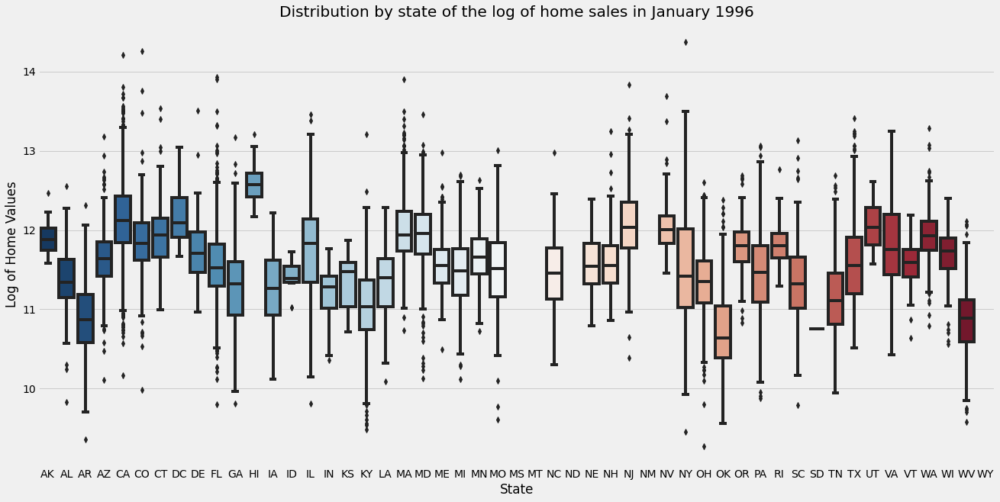

In [ ]:
states_alphaomega = zillow_DF[['State','RegionName','1996-01-31','2019-12-31']].copy()
states_alphaomega.head()
states_alphaomega['logJan1996'] = np.log(states_alphaomega['1996-01-31'])
states_alphaomega['logDec2019'] = np.log(states_alphaomega['2019-12-31'])
states_alphaomega=states_alphaomega.sort_values('State')
plt.figure(figsize=[20,10])
# MS does not have any listed values in Jan 1996
ax = sns.boxplot(x="State", y="logJan1996", data=states_alphaomega, palette = "RdBu_r")
ax.set_title('Distribution by state of the log of home sales in January 1996')
ax.set_ylabel('Log of Home Values')

Text(0, 0.5, 'Log of Home Values')

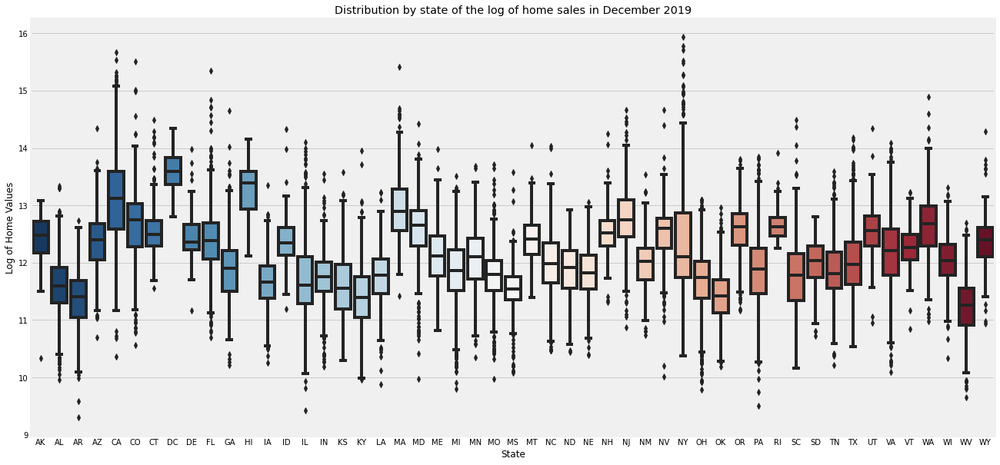

In [ ]:
plt.figure(figsize=[20,10])
ax = sns.boxplot(x="State", y="logDec2019", data=states_alphaomega, palette = "RdBu_r")
ax.set_title('Distribution by state of the log of home sales in December 2019')
ax.set_ylabel('Log of Home Values')

/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:679: RuntimeWarning:

invalid value encountered in log



Text(0, 0.5, 'Log Change in valuations over time')

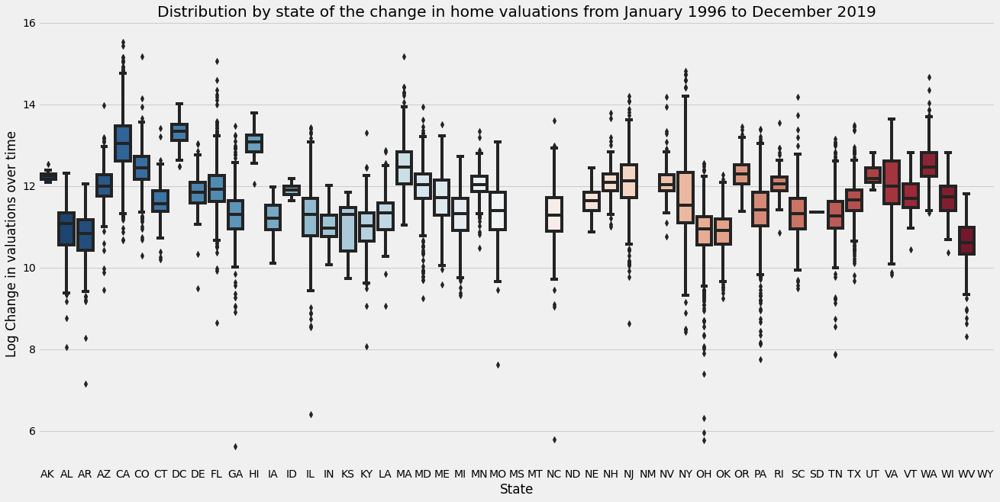

In [ ]:
states_alphaomega['ChangeOverTime'] = states_alphaomega['2019-12-31']-states_alphaomega['1996-01-31']
states_alphaomega['logChange'] = np.log(states_alphaomega['ChangeOverTime'])
plt.figure(figsize=[20,10])
ax = sns.boxplot(x="State", y="logChange", data=states_alphaomega, palette = "RdBu_r")
ax.set_title('Distribution by state of the change in home valuations from January 1996 to December 2019')
ax.set_ylabel('Log Change in valuations over time')

In [ ]:
state_average = pd.DataFrame()
state_average['Start'] = states_alphaomega.groupby('State')['1996-01-31'].mean()
state_average['End'] =states_alphaomega.groupby('State')['2019-12-31'].mean()
state_average['ChangeOverTime'] =state_average['End']-state_average['Start']
state_average = state_average.reset_index()
state_average.tail()
# United States of America Python Dictionary to translate States,
# Districts & Territories to Two-Letter codes and vice versa.
#
# https://gist.github.com/rogerallen/1583593
#
# Dedicated to the public domain.  To the extent possible under law,
# Roger Allen has waived all copyright and related or neighboring
# rights to this code.

us_state_abbrev = {
    'Alabama': 'AL',
    'Alaska': 'AK',
    'American Samoa': 'AS',
    'Arizona': 'AZ',
    'Arkansas': 'AR',
    'California': 'CA',
    'Colorado': 'CO',
    'Connecticut': 'CT',
    'Delaware': 'DE',
    'District of Columbia': 'DC',
    'Florida': 'FL',
    'Georgia': 'GA',
    'Guam': 'GU',
    'Hawaii': 'HI',
    'Idaho': 'ID',
    'Illinois': 'IL',
    'Indiana': 'IN',
    'Iowa': 'IA',
    'Kansas': 'KS',
    'Kentucky': 'KY',
    'Louisiana': 'LA',
    'Maine': 'ME',
    'Maryland': 'MD',
    'Massachusetts': 'MA',
    'Michigan': 'MI',
    'Minnesota': 'MN',
    'Mississippi': 'MS',
    'Missouri': 'MO',
    'Montana': 'MT',
    'Nebraska': 'NE',
    'Nevada': 'NV',
    'New Hampshire': 'NH',
    'New Jersey': 'NJ',
    'New Mexico': 'NM',
    'New York': 'NY',
    'North Carolina': 'NC',
    'North Dakota': 'ND',
    'Northern Mariana Islands':'MP',
    'Ohio': 'OH',
    'Oklahoma': 'OK',
    'Oregon': 'OR',
    'Pennsylvania': 'PA',
    'Puerto Rico': 'PR',
    'Rhode Island': 'RI',
    'South Carolina': 'SC',
    'South Dakota': 'SD',
    'Tennessee': 'TN',
    'Texas': 'TX',
    'Utah': 'UT',
    'Vermont': 'VT',
    'Virgin Islands': 'VI',
    'Virginia': 'VA',
    'Washington': 'WA',
    'West Virginia': 'WV',
    'Wisconsin': 'WI',
    'Wyoming': 'WY'
}

# thank you to @kinghelix and @trevormarburger for this idea
abbrev_us_state = dict(map(reversed, us_state_abbrev.items()))

# Simple test examples
if __name__ == '__main__':
    print("Wisconin --> WI?", us_state_abbrev['Wisconsin'] == 'WI')
    print("WI --> Wisconin?", abbrev_us_state['WI'] == 'Wisconsin')
    print("Number of entries (50 states, DC, 5 Territories) == 56? ", 56 == len(us_state_abbrev))
state_average['StateFull'] = state_average['State'].map(abbrev_us_state)
state_average.tail()

Wisconin --> WI? True
WI --> Wisconin? True
Number of entries (50 states, DC, 5 Territories) == 56?  True


,State,Start,End,ChangeOverTime,StateFull
46,VT,111995.090090,228754.841699,116759.751609,Vermont
47,WA,161057.288321,371799.055749,210741.767428,Washington
48,WI,126748.411290,185561.184941,58812.773650,Wisconsin
49,WV,59236.751880,85173.529503,25936.777623,West Virginia
50,WY,NaN,269190.337580,NaN,Wyoming


/usr/local/lib/python3.6/dist-packages/cartopy/io/__init__.py:260: DownloadWarning:

Downloading: https://naciscdn.org/naturalearth/110m/cultural/ne_110m_admin_1_states_provinces_lakes_shp.zip

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:15: DeprecationWarning:

The background_patch property is deprecated. Use GeoAxes.patch instead.

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:16: DeprecationWarning:

The outline_patch property is deprecated. Use GeoAxes.spines['geo'] or the default Axes properties instead.



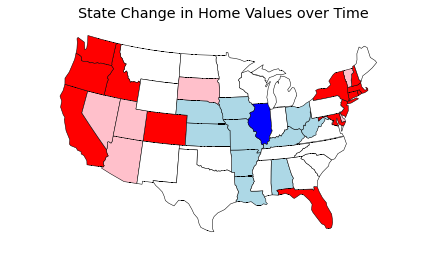

In [ ]:


fig = plt.figure()
ax = fig.add_axes([0, 0, 1, 1], projection=ccrs.LambertConformal())

ax.set_extent([-125, -66.5, 20, 50], ccrs.Geodetic())

shapename = 'admin_1_states_provinces_lakes_shp'
states_shp = shpreader.natural_earth(resolution='110m',
                                     category='cultural', name=shapename)

changeovertime = dict(zip(state_average.StateFull.values, state_average.ChangeOverTime.values))
 

ax.background_patch.set_visible(False)
ax.outline_patch.set_visible(False)

ax.set_title('State Change in Home Values over Time')

#for state in shpreader.Reader(states_shp).geometries():
for astate in shpreader.Reader(states_shp).records():

    ### You want to replace the following code with code that sets the
    ### facecolor as a gradient based on the change in values above
    #facecolor = [0.9375, 0.9375, 0.859375]

    edgecolor = 'black'

    try:
        # use the name of this state to get change over time
        state_change = changeovertime[ astate.attributes['name'] ]
    except:
        state_change = 0

    # simple scheme to assign color to each state
    if state_change < 25000:
        facecolor = "blue"
    elif state_change < 50000:
        facecolor = 'lightblue'
    elif state_change > 150000:
        facecolor = "red"
    elif state_change > 100000:
        facecolor = "pink"
    else:
        facecolor = "white"

    # `astate.geometry` is the polygon to plot
    ax.add_geometries([astate.geometry], ccrs.PlateCarree(),
                      facecolor=facecolor, edgecolor=edgecolor)

plt.show()

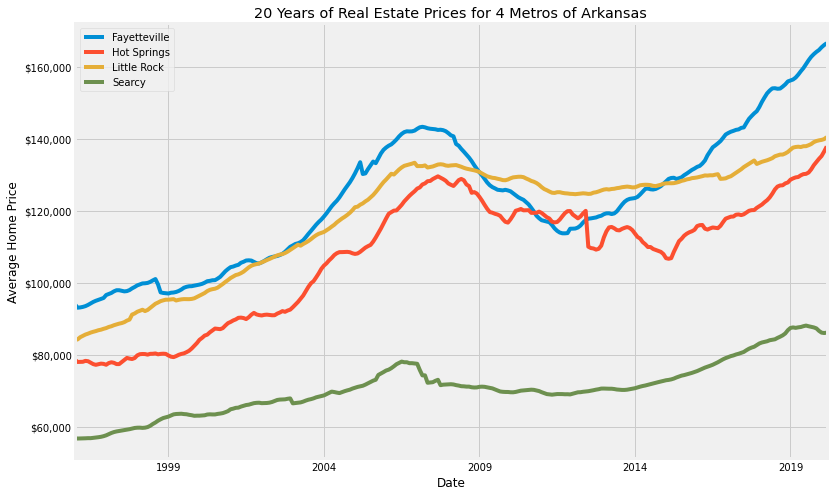

In [ ]:
### WORK ON THE FORMATTING! NEED TO FORMAT PRICES TO HAVE $ and THE DATE X-TICKS TO BE EVERY 2 YEARS!


AR_long_DF1.columns = ['Date','Fayetteville','Hot Springs','Little Rock','Searcy']
years = mdates.YearLocator()   # every year
months = mdates.MonthLocator()  # every month
years_fmt = mdates.DateFormatter('%Y')
ax = AR_long_DF1.set_index('Date').plot(figsize=(12, 8))
ax.set_ylabel('Average Home Price')
ax.set_xlabel('Date')
#datemin = np.datetime64(myarea_long_DF1['Date'][0], 'Y')
#datemax = np.datetime64(myarea_long_DF1['Date'][290], 'Y') + np.timedelta64(1, 'Y')
#ax.set_xlim(datemin, datemax)
fmt = '${x:,.0f}'
tick = mtick.StrMethodFormatter(fmt)
ax.set_title('20 Years of Real Estate Prices for 4 Metros of Arkansas')
#ax.format_xdata = mdates.DateFormatter('%Y-%m-%d')
ax.yaxis.set_major_formatter(tick)
#ax.xaxis.set_major_locator(years)
#ax.xaxis.set_major_formatter(years_fmt)
#ax.grid(True)
plt.show()

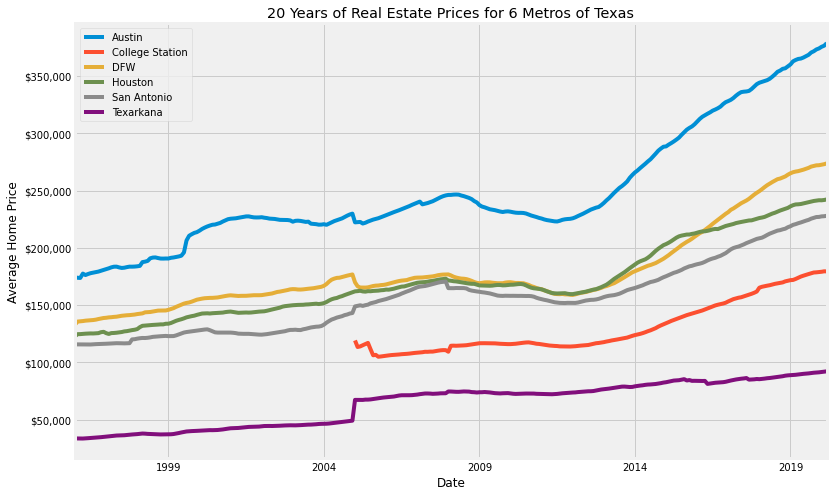

In [ ]:
TX_long_DF1.columns = ['Date','Austin','College Station','DFW','Houston','San Antonio','Texarkana']
years = mdates.YearLocator()   # every year
months = mdates.MonthLocator()  # every month
years_fmt = mdates.DateFormatter('%Y')
ax = TX_long_DF1.set_index('Date').plot(figsize=(12, 8))
ax.set_ylabel('Average Home Price')
ax.set_xlabel('Date')
#datemin = np.datetime64(myarea_long_DF1['Date'][0], 'Y')
#datemax = np.datetime64(myarea_long_DF1['Date'][290], 'Y') + np.timedelta64(1, 'Y')
#ax.set_xlim(datemin, datemax)
fmt = '${x:,.0f}'
tick = mtick.StrMethodFormatter(fmt)
ax.set_title('20 Years of Real Estate Prices for 6 Metros of Texas')
#ax.format_xdata = mdates.DateFormatter('%Y-%m-%d')
ax.yaxis.set_major_formatter(tick)
#ax.xaxis.set_major_locator(years)
#ax.xaxis.set_major_formatter(years_fmt)
#ax.grid(True)
plt.show()

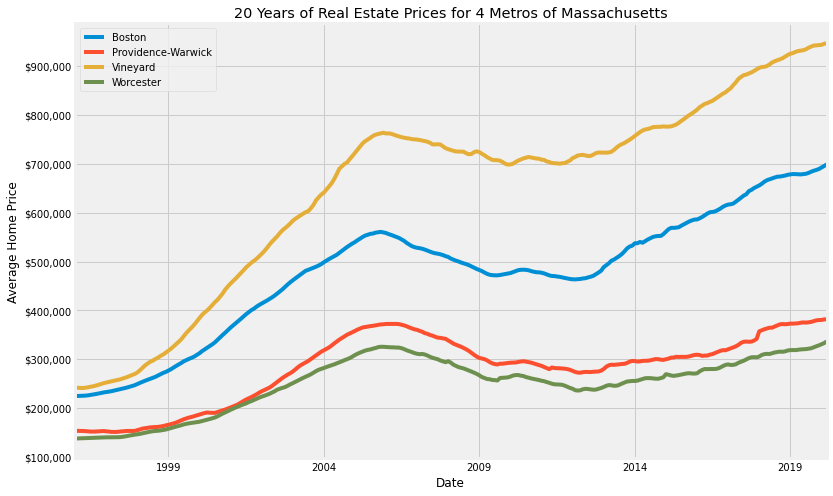

In [ ]:
MA_long_DF1.columns = ['Date','Boston','Providence-Warwick','Vineyard','Worcester']
years = mdates.YearLocator()   # every year
months = mdates.MonthLocator()  # every month
years_fmt = mdates.DateFormatter('%Y')
ax = MA_long_DF1.set_index('Date').plot(figsize=(12, 8))
ax.set_ylabel('Average Home Price')
ax.set_xlabel('Date')
#datemin = np.datetime64(myarea_long_DF1['Date'][0], 'Y')
#datemax = np.datetime64(myarea_long_DF1['Date'][290], 'Y') + np.timedelta64(1, 'Y')
#ax.set_xlim(datemin, datemax)
fmt = '${x:,.0f}'
tick = mtick.StrMethodFormatter(fmt)
ax.set_title('20 Years of Real Estate Prices for 4 Metros of Massachusetts')
#ax.format_xdata = mdates.DateFormatter('%Y-%m-%d')
ax.yaxis.set_major_formatter(tick)
#ax.xaxis.set_major_locator(years)
#ax.xaxis.set_major_formatter(years_fmt)
#ax.grid(True)
plt.show()

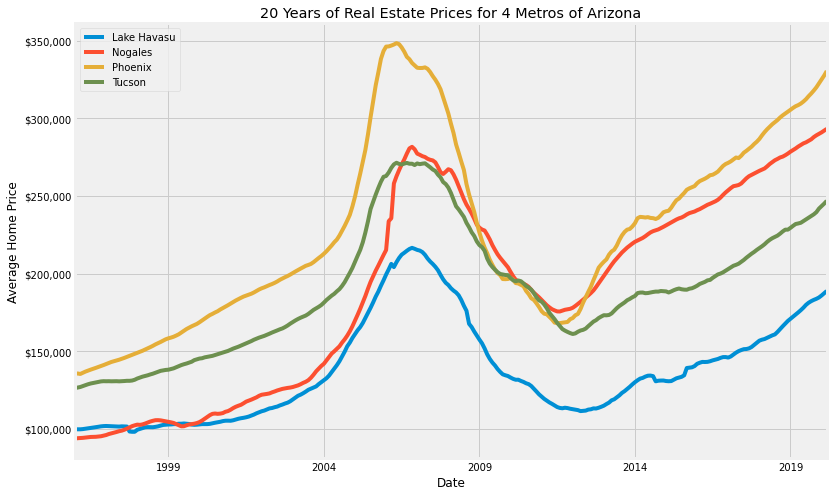

In [ ]:
AZ_long_DF1.columns = ['Date','Lake Havasu','Nogales','Phoenix','Tucson']
years = mdates.YearLocator()   # every year
months = mdates.MonthLocator()  # every month
years_fmt = mdates.DateFormatter('%Y')
ax = AZ_long_DF1.set_index('Date').plot(figsize=(12, 8))
ax.set_ylabel('Average Home Price')
ax.set_xlabel('Date')
#datemin = np.datetime64(myarea_long_DF1['Date'][0], 'Y')
#datemax = np.datetime64(myarea_long_DF1['Date'][290], 'Y') + np.timedelta64(1, 'Y')
#ax.set_xlim(datemin, datemax)
fmt = '${x:,.0f}'
tick = mtick.StrMethodFormatter(fmt)
ax.set_title('20 Years of Real Estate Prices for 4 Metros of Arizona')
#ax.format_xdata = mdates.DateFormatter('%Y-%m-%d')
ax.yaxis.set_major_formatter(tick)
#ax.xaxis.set_major_locator(years)
#ax.xaxis.set_major_formatter(years_fmt)
#ax.grid(True)
plt.show()

Text(0.5, 0, 'Unemployment Rate')

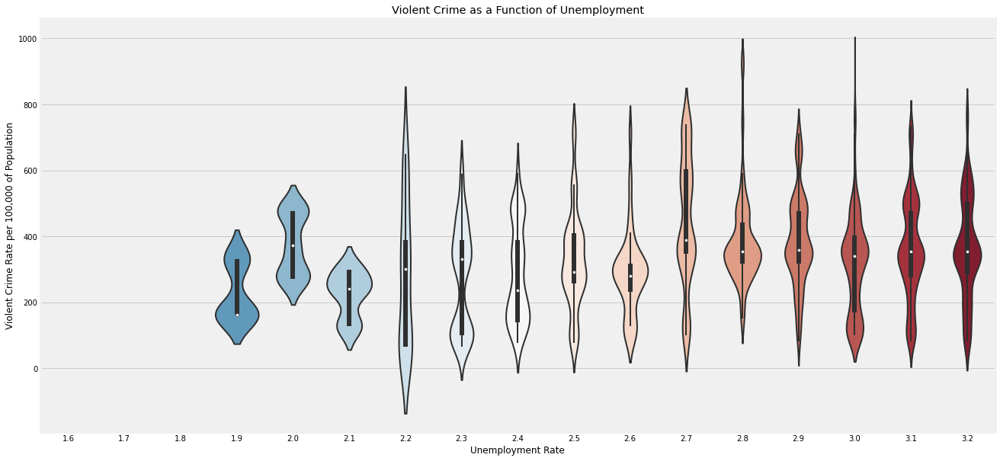

In [ ]:
plt.figure(figsize=[20,10])
ax = sns.violinplot(x=zip_county_unemployment_crime['Unemployment_Rate'],y=zip_county_unemployment_crime['Violent_Crime_Totals'],palette = 'RdBu_r',linewidth=2)
ax.set_title('Violent Crime as a Function of Unemployment')
ax.set_ylabel('Violent Crime Rate per 100,000 of Population')
ax.set_xlabel('Unemployment Rate')

Text(0.5, 0, 'Unemployment Rate')

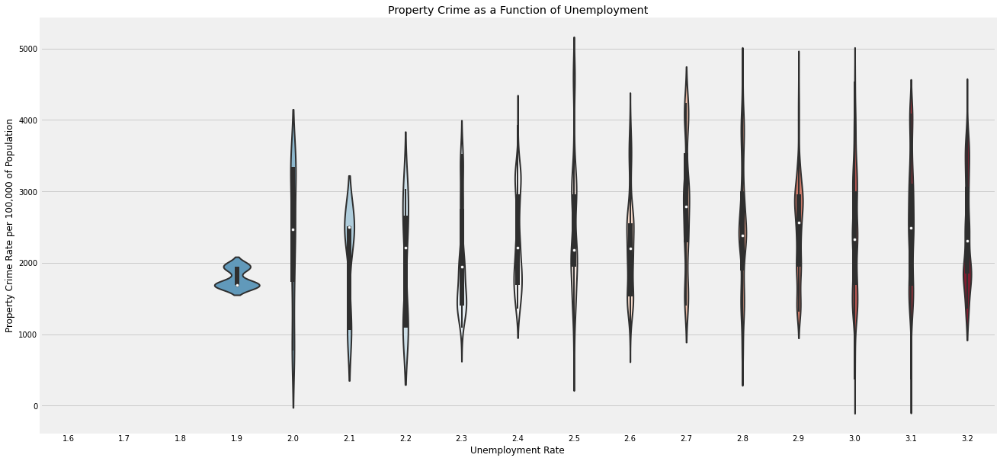

In [ ]:
plt.figure(figsize=[20,10])
ax = sns.violinplot(x=zip_county_unemployment_crime['Unemployment_Rate'],y=zip_county_unemployment_crime['Property_Crime_Totals'],palette = 'RdBu_r',linewidth=2)
ax.set_title('Property Crime as a Function of Unemployment')
ax.set_ylabel('Property Crime Rate per 100,000 of Population')
ax.set_xlabel('Unemployment Rate')

In [ ]:
states_alphaomega.head()
change_over_time = states_alphaomega[['State','RegionName','1996-01-31','2019-12-31','ChangeOverTime']].copy()
change_over_time.head()
zip_county_unemployment_crime.head()
zip_county_unemployment_crime_change = pd.merge(zip_county_unemployment_crime,change_over_time,on='RegionName',how='left')
zip_county_unemployment_crime_change.head()
sorted_stats = zip_county_unemployment_crime_change.sort_values(by = 'ChangeOverTime',ascending = False)
sorted_stats = sorted_stats[sorted_stats['ChangeOverTime'] < 200000]
sorted_stats =sorted_stats[sorted_stats['ChangeOverTime'] >50000 ]
sorted_stats =sorted_stats[sorted_stats['Unemployment_Rate'] <2.7 ]
sorted_stats =sorted_stats[sorted_stats['Property_Crime_Totals'] <3000 ]

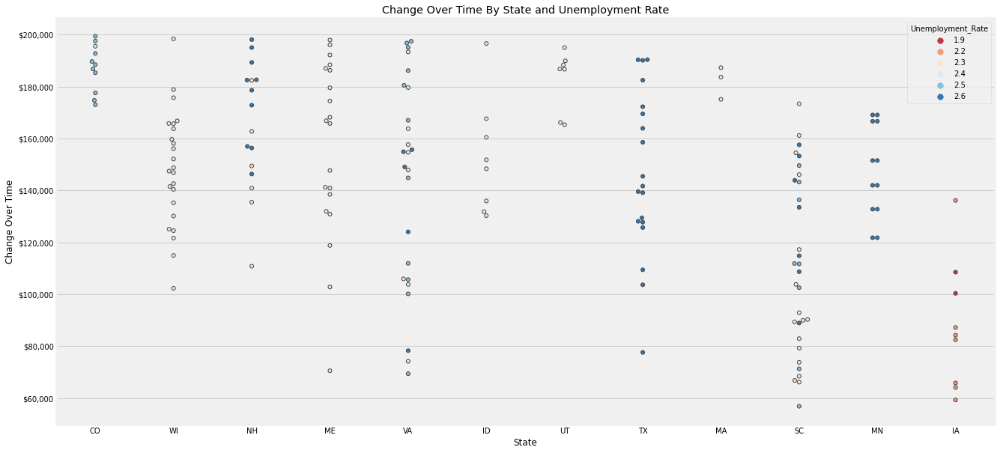

In [ ]:
plt.figure(figsize=[20,10])
ax = sns.swarmplot(x='State',y='ChangeOverTime',data=sorted_stats,hue='Unemployment_Rate',edgecolor="gray",linewidth = 1, palette='RdBu')
ax.set_title('Change Over Time By State and Unemployment Rate')
ax.set_ylabel('Change Over Time')
fmt = '${x:,.0f}'
tick = mtick.StrMethodFormatter(fmt)
ax.yaxis.set_major_formatter(tick)
plt.show(ax)

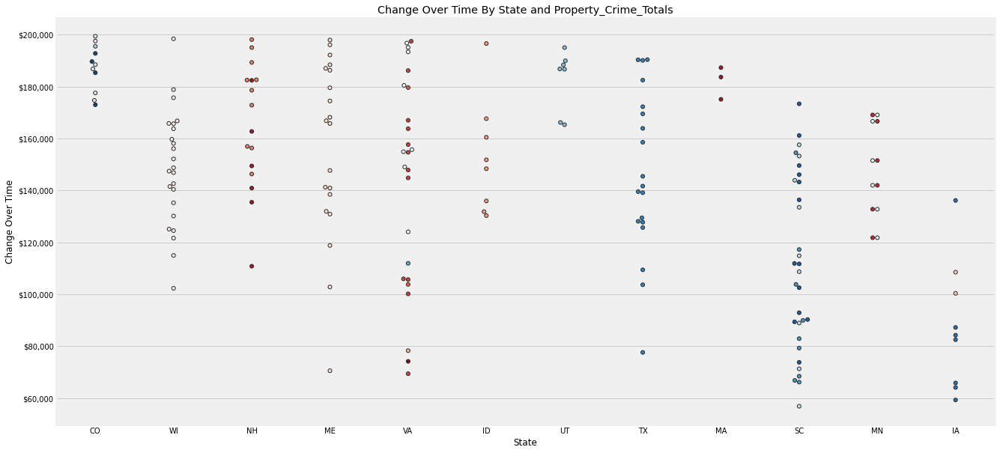

In [ ]:
plt.figure(figsize=[20,10])
ax = sns.swarmplot(x='State',y='ChangeOverTime',data=sorted_stats,hue='Property_Crime_Totals',edgecolor="gray",linewidth = 1, palette='RdBu')
ax.set_title('Change Over Time By State and Property_Crime_Totals')
ax.set_ylabel('Change Over Time')
fmt = '${x:,.0f}'
tick = mtick.StrMethodFormatter(fmt)
ax.yaxis.set_major_formatter(tick)
ax.get_legend().remove()
plt.show(ax)

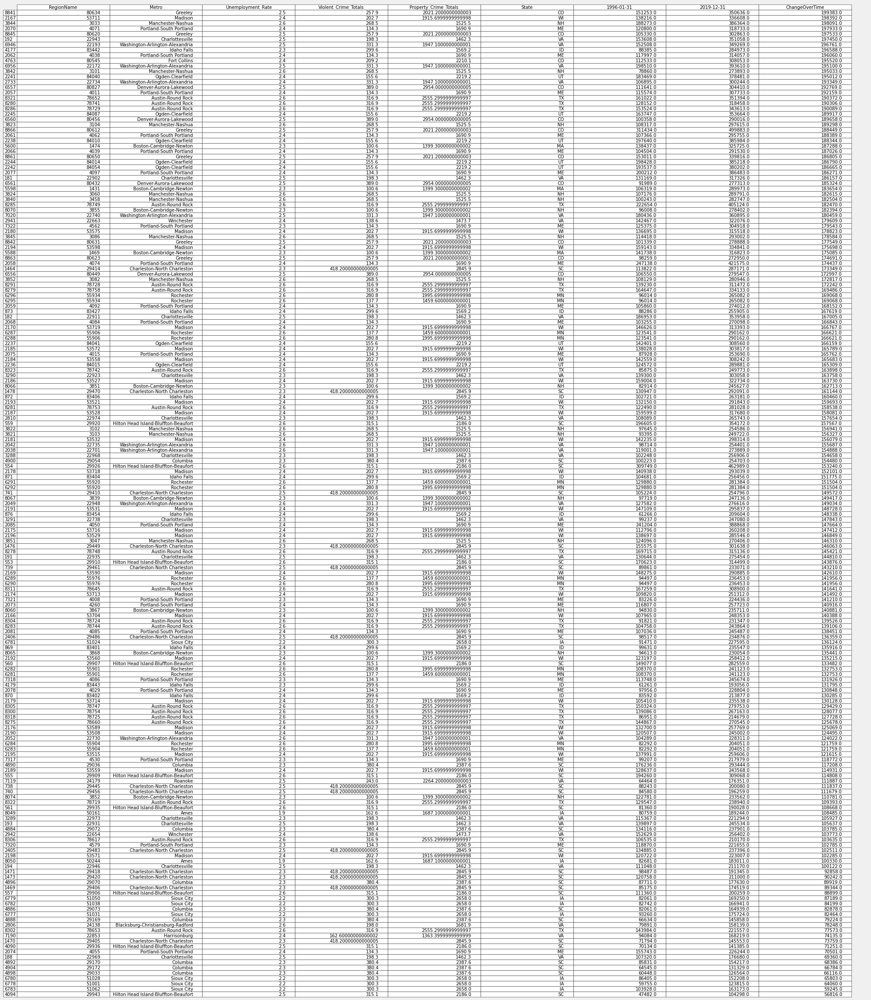

<Figure size 432x288 with 0 Axes>

In [ ]:

sorted_stats = sorted_stats.drop(['index','LAUS_code','State_FIPS','County_FIPS','Year','Labor_Force','Employed','Unemployed','Population'],axis=1)
#def format_for_print2(df):    
#    table = PrettyTable(list(df.columns))
#    for row in df.itertuples():
#        table.add_row(row[1:])
#    return str(table)
#print(format_for_print2(sorted_stats))
# set fig size
fig, ax = plt.subplots(figsize=(30, 3)) 
# no axes
ax.xaxis.set_visible(False)  
ax.yaxis.set_visible(False)  
# no frame
ax.set_frame_on(False)  
# plot table
tab = table(ax, sorted_stats, loc='upper right')  
# set font manually
tab.auto_set_font_size(False)
tab.set_fontsize(10) 
plt.show()
# save the result
plt.savefig('table.png')

In [ ]:
sorted_stats.shape

(185, 9)

# Model

In [ ]:
# Iterate over the columns of zillow_long_DF1 to create a list (dfs) of data frames containing only the values (renamed y) and the date (renamed ds). 
# Append a column with the zip code. This column will be detached prior to running prophet and reattached to the prophet output so as to keep zip codes established.
dfs=[]
for i, zip in enumerate(zillow_long_DF1.columns):
  dfs.append(zillow_long_DF1.loc[zillow_long_DF1.loc[:,zip].first_valid_index():,zip])
  dfs[i] = dfs[i].to_frame()
  dfs[i].name = zip
  dfs[i]['ds'] =dfs[i].index
  dfs[i].rename(columns={zip:'y'},inplace=True)
  dfs[i]['zip_code'] = zip
print(dfs[0].name)

10025


In [ ]:


def run_prophet(ziptimeseries):
    ziptimeseries_zip = ziptimeseries['zip_code']
    ziptimeseries_nozip = ziptimeseries.drop(['zip_code'],axis=1)
    model = Prophet(interval_width=0.95)
    model.fit(ziptimeseries_nozip)
    forecast = model.make_future_dataframe(periods=12,freq='M', include_history=True)
    forecast = model.predict(forecast)
    forecast = pd.concat([ziptimeseries_zip.reset_index(drop=True), forecast], axis=1)
    forecast['zip_code'].fillna(forecast['zip_code'][0])
    return forecast

In [ ]:
if __name__ == '__main__':
    p = Pool(cpu_count())
    predictions = list(tqdm(p.imap(run_prophet, dfs[0:1000]), total=len(dfs[0:1000])))
    p.close()
    p.join()

# Fills in NaN zipcodes for the new predictions
for i in range(len(predictions)):
    predictions[i].ffill(inplace=True)
print(predictions[0].tail(12))
predictions_DF =  pd.concat(predictions)
#predictions_DF.to_csv('predictions1.csv') 
#files.download('predictions1.csv')
with open('/content/drive/My Drive/predictions.csv', 'w') as f:
  predictions_DF.to_csv(f)
!cat /content/drive/My Drive/predictions.csv
predictions_DF.tail()  

  0%|          | 0/1000 [00:00<?, ?it/s]INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
  0%|          | 1/1000 [00:05<1:23:24,  5.01s/it]INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True 

     zip_code         ds  ...  multiplicative_terms_upper          yhat
199   10025.0 2020-04-30  ...                         0.0  1.419300e+06
200   10025.0 2020-05-31  ...                         0.0  1.417254e+06
201   10025.0 2020-06-30  ...                         0.0  1.414171e+06
202   10025.0 2020-07-31  ...                         0.0  1.410106e+06
203   10025.0 2020-08-31  ...                         0.0  1.405502e+06
204   10025.0 2020-09-30  ...                         0.0  1.406157e+06
205   10025.0 2020-10-31  ...                         0.0  1.404107e+06
206   10025.0 2020-11-30  ...                         0.0  1.403656e+06
207   10025.0 2020-12-31  ...                         0.0  1.403009e+06
208   10025.0 2021-01-31  ...                         0.0  1.399922e+06
209   10025.0 2021-02-28  ...                         0.0  1.396593e+06
210   10025.0 2021-03-31  ...                         0.0  1.396105e+06

[12 rows x 17 columns]
cat: /content/drive/My: No such file or 

,zip_code,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
298,27612.0,2020-11-30,388077.601228,383855.859751,392349.779667,384290.790022,391213.417743,77.850173,77.850173,77.850173,77.850173,77.850173,77.850173,0.0,0.0,0.0,388155.451401
299,27612.0,2020-12-31,389471.731134,385165.775104,394439.974034,384885.471554,393271.917544,370.218616,370.218616,370.218616,370.218616,370.218616,370.218616,0.0,0.0,0.0,389841.949749
300,27612.0,2021-01-31,390865.861040,385643.582549,396694.484422,385225.978031,395385.982923,735.118401,735.118401,735.118401,735.118401,735.118401,735.118401,0.0,0.0,0.0,391600.979441
301,27612.0,2021-02-28,392125.075148,385599.630061,398318.740669,385703.957518,397308.982300,145.769171,145.769171,145.769171,145.769171,145.769171,145.769171,0.0,0.0,0.0,392270.844320
302,27612.0,2021-03-31,393519.205054,385797.086625,399807.926329,386088.322651,399382.531046,80.357503,80.357503,80.357503,80.357503,80.357503,80.357503,0.0,0.0,0.0,393599.562558


In [ ]:
if __name__ == '__main__':
    p = Pool(cpu_count())
    predictions2 = list(tqdm(p.imap(run_prophet, dfs[1001:2000]), total=len(dfs[1001:2000])))
    p.close()
    p.join()

# Fills in NaN zipcodes for the new predictions
for i in range(len(predictions2)):
    predictions2[i].ffill(inplace=True)
print(predictions2[0].tail(12))
predictions_DF =  pd.concat(predictions2)
with open('/content/drive/My Drive/predictions.csv', 'a') as f:
  predictions_DF.to_csv(f)
!cat /content/drive/My Drive/predictions.csv
predictions.append(predictions_DF)
predictions_DF =  pd.concat(predictions)
predictions_DF.tail() 

  0%|          | 0/999 [00:00<?, ?it/s]INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily se

     zip_code         ds  ...  multiplicative_terms_upper           yhat
263   87507.0 2020-04-30  ...                         0.0  299722.117142
264   87507.0 2020-05-31  ...                         0.0  300729.391380
265   87507.0 2020-06-30  ...                         0.0  302233.062577
266   87507.0 2020-07-31  ...                         0.0  304095.013057
267   87507.0 2020-08-31  ...                         0.0  305972.301809
268   87507.0 2020-09-30  ...                         0.0  307425.684816
269   87507.0 2020-10-31  ...                         0.0  308792.283895
270   87507.0 2020-11-30  ...                         0.0  309756.225655
271   87507.0 2020-12-31  ...                         0.0  310434.810732
272   87507.0 2021-01-31  ...                         0.0  310969.167475
273   87507.0 2021-02-28  ...                         0.0  314189.877059
274   87507.0 2021-03-31  ...                         0.0  315353.937886

[12 rows x 17 columns]
cat: /content/drive/My: No 

,zip_code,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
298,91320.0,2020-11-30,771080.359915,741455.217309,798445.059760,750099.154522,788717.744363,-64.134574,-64.134574,-64.134574,-64.134574,-64.134574,-64.134574,0.0,0.0,0.0,771016.225341
299,91320.0,2020-12-31,772876.609090,741085.792535,801656.781995,747572.981816,793553.837358,1124.257333,1124.257333,1124.257333,1124.257333,1124.257333,1124.257333,0.0,0.0,0.0,774000.866423
300,91320.0,2021-01-31,774672.858265,739832.655778,813411.950912,743822.949600,798786.973639,3132.301509,3132.301509,3132.301509,3132.301509,3132.301509,3132.301509,0.0,0.0,0.0,777805.159774
301,91320.0,2021-02-28,776295.276875,736990.940089,809878.078819,741702.508039,805110.548484,600.406558,600.406558,600.406558,600.406558,600.406558,600.406558,0.0,0.0,0.0,776895.683433
302,91320.0,2021-03-31,778091.526050,736634.252447,816907.178703,738917.163437,812618.851459,852.111416,852.111416,852.111416,852.111416,852.111416,852.111416,0.0,0.0,0.0,778943.637466


In [ ]:
if __name__ == '__main__':
    p = Pool(cpu_count())
    predictions3 = list(tqdm(p.imap(run_prophet, dfs[2001:3000]), total=len(dfs[2001:3000])))
    p.close()
    p.join()

# Fills in NaN zipcodes for the new predictions
for i in range(len(predictions3)):
    predictions3[i].ffill(inplace=True)
print(predictions3[0].tail(12))
predictions_DF =  pd.concat(predictions3)
with open('/content/drive/My Drive/predictions.csv', 'a') as f:
  predictions_DF.to_csv(f)
!cat /content/drive/My Drive/predictions.csv
predictions.append(predictions_DF)
predictions_DF =  pd.concat(predictions)
predictions_DF.tail() 

  0%|          | 0/999 [00:00<?, ?it/s]INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily se

    zip_code         ds  ...  multiplicative_terms_upper           yhat
62    4240.0 2020-04-30  ...                         0.0  162403.241546
63    4240.0 2020-05-31  ...                         0.0  163732.260477
64    4240.0 2020-06-30  ...                         0.0  163839.552255
65    4240.0 2020-07-31  ...                         0.0  163524.903263
66    4240.0 2020-08-31  ...                         0.0  163960.571850
67    4240.0 2020-09-30  ...                         0.0  165516.915209
68    4240.0 2020-10-31  ...                         0.0  167390.268262
69    4240.0 2020-11-30  ...                         0.0  168881.008843
70    4240.0 2020-12-31  ...                         0.0  168486.953729
71    4240.0 2021-01-31  ...                         0.0  168923.588896
72    4240.0 2021-02-28  ...                         0.0  170821.452931
73    4240.0 2021-03-31  ...                         0.0  171851.466065

[12 rows x 17 columns]
cat: /content/drive/My: No such file or 

,zip_code,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
298,19026.0,2020-11-30,192905.537951,187364.687389,197553.030654,190083.116175,195265.478270,-292.910780,-292.910780,-292.910780,-292.910780,-292.910780,-292.910780,0.0,0.0,0.0,192612.627172
299,19026.0,2020-12-31,193362.891791,187673.253948,198249.958051,190039.566124,196190.176245,-546.818491,-546.818491,-546.818491,-546.818491,-546.818491,-546.818491,0.0,0.0,0.0,192816.073300
300,19026.0,2021-01-31,193820.245631,187265.644968,199115.027318,189824.646405,197269.252294,-588.703467,-588.703467,-588.703467,-588.703467,-588.703467,-588.703467,0.0,0.0,0.0,193231.542164
301,19026.0,2021-02-28,194233.339422,188703.003759,200358.077511,189558.873685,198241.028376,179.408431,179.408431,179.408431,179.408431,179.408431,179.408431,0.0,0.0,0.0,194412.747853
302,19026.0,2021-03-31,194690.693262,188621.347627,200969.812896,189295.100400,199326.879173,230.499089,230.499089,230.499089,230.499089,230.499089,230.499089,0.0,0.0,0.0,194921.192351


In [ ]:
if __name__ == '__main__':
    p = Pool(cpu_count())
    predictions4 = list(tqdm(p.imap(run_prophet, dfs[3001:4000]), total=len(dfs[3001:4000])))
    p.close()
    p.join()

# Fills in NaN zipcodes for the new predictions
for i in range(len(predictions4)):
    predictions4[i].ffill(inplace=True)
print(predictions4[0].tail(12))
predictions_DF =  pd.concat(predictions4)
with open('/content/drive/My Drive/predictions.csv', 'a') as f:
  predictions_DF.to_csv(f)
!cat /content/drive/My Drive/predictions.csv
predictions.append(predictions_DF)
predictions_DF =  pd.concat(predictions)
predictions_DF.tail() 

  0%|          | 0/999 [00:00<?, ?it/s]INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
  0%|          | 1/999 [00:05<1:24:28,  5.08s/it]INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to

     zip_code         ds  ...  multiplicative_terms_upper           yhat
291   10550.0 2020-04-30  ...                         0.0  414264.946829
292   10550.0 2020-05-31  ...                         0.0  415400.917276
293   10550.0 2020-06-30  ...                         0.0  417756.944815
294   10550.0 2020-07-31  ...                         0.0  420200.960449
295   10550.0 2020-08-31  ...                         0.0  423323.452492
296   10550.0 2020-09-30  ...                         0.0  425596.869392
297   10550.0 2020-10-31  ...                         0.0  427208.721472
298   10550.0 2020-11-30  ...                         0.0  428269.407627
299   10550.0 2020-12-31  ...                         0.0  428312.252504
300   10550.0 2021-01-31  ...                         0.0  427936.936413
301   10550.0 2021-02-28  ...                         0.0  435994.215221
302   10550.0 2021-03-31  ...                         0.0  437109.830516

[12 rows x 17 columns]
cat: /content/drive/My: No 

,zip_code,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
281,27514.0,2020-11-30,511409.330183,498506.944649,523535.350518,505331.021533,517003.908460,-358.554088,-358.554088,-358.554088,-358.554088,-358.554088,-358.554088,0.0,0.0,0.0,511050.776095
282,27514.0,2020-12-31,512815.231767,499401.548433,526078.908297,505536.844108,519576.624072,147.803655,147.803655,147.803655,147.803655,147.803655,147.803655,0.0,0.0,0.0,512963.035422
283,27514.0,2021-01-31,514221.133351,502733.556475,530632.763900,505926.956799,522310.519151,1984.062769,1984.062769,1984.062769,1984.062769,1984.062769,1984.062769,0.0,0.0,0.0,516205.196120
284,27514.0,2021-02-28,515490.979943,501972.290411,530871.399963,506080.628535,524783.716045,129.932380,129.932380,129.932380,129.932380,129.932380,129.932380,0.0,0.0,0.0,515620.912323
285,27514.0,2021-03-31,516896.881527,500921.242264,531816.600661,506134.393520,527628.020906,-214.159896,-214.159896,-214.159896,-214.159896,-214.159896,-214.159896,0.0,0.0,0.0,516682.721631


In [ ]:
if __name__ == '__main__':
    p = Pool(cpu_count())
    predictions5 = list(tqdm(p.imap(run_prophet, dfs[4001:5000]), total=len(dfs[4001:5000])))
    p.close()
    p.join()

# Fills in NaN zipcodes for the new predictions
for i in range(len(predictions5)):
    predictions5[i].ffill(inplace=True)
print(predictions5[0].tail(12))
predictions_DF =  pd.concat(predictions5)
with open('/content/drive/My Drive/predictions.csv', 'a') as f:
  predictions_DF.to_csv(f)
!cat /content/drive/My Drive/predictions.csv
predictions.append(predictions_DF)
predictions_DF =  pd.concat(predictions)
predictions_DF.tail() 

  0%|          | 0/999 [00:00<?, ?it/s]INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
  0%|          | 1/999 [00:04<1:17:15,  4.64s/it]INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to

     zip_code         ds  ...  multiplicative_terms_upper           yhat
137   95205.0 2020-04-30  ...                         0.0  241602.929954
138   95205.0 2020-05-31  ...                         0.0  243578.546782
139   95205.0 2020-06-30  ...                         0.0  245570.288309
140   95205.0 2020-07-31  ...                         0.0  246950.410782
141   95205.0 2020-08-31  ...                         0.0  248486.312062
142   95205.0 2020-09-30  ...                         0.0  249565.695891
143   95205.0 2020-10-31  ...                         0.0  251133.712241
144   95205.0 2020-11-30  ...                         0.0  254367.521881
145   95205.0 2020-12-31  ...                         0.0  256254.835520
146   95205.0 2021-01-31  ...                         0.0  258477.923976
147   95205.0 2021-02-28  ...                         0.0  258754.557790
148   95205.0 2021-03-31  ...                         0.0  260372.707131

[12 rows x 17 columns]
cat: /content/drive/My: No 

,zip_code,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
297,6002.0,2020-11-30,216571.281510,210196.094588,223030.982457,212177.768924,221265.901516,-162.334425,-162.334425,-162.334425,-162.334425,-162.334425,-162.334425,0.0,0.0,0.0,216408.947085
298,6002.0,2020-12-31,217040.151661,209735.507555,224842.216505,212040.626844,222653.158487,52.192386,52.192386,52.192386,52.192386,52.192386,52.192386,0.0,0.0,0.0,217092.344046
299,6002.0,2021-01-31,217509.021812,210618.686127,226020.271516,211620.484613,223884.430475,703.027556,703.027556,703.027556,703.027556,703.027556,703.027556,0.0,0.0,0.0,218212.049368
300,6002.0,2021-02-28,217932.517432,210428.168930,226872.598969,211454.497495,225290.737804,392.404451,392.404451,392.404451,392.404451,392.404451,392.404451,0.0,0.0,0.0,218324.921883
301,6002.0,2021-03-31,218401.387583,209946.688779,227891.287162,211187.387948,227081.461014,478.810272,478.810272,478.810272,478.810272,478.810272,478.810272,0.0,0.0,0.0,218880.197856


In [ ]:
if __name__ == '__main__':
    p = Pool(cpu_count())
    predictions6 = list(tqdm(p.imap(run_prophet, dfs[5001:6000]), total=len(dfs[5001:6000])))
    p.close()
    p.join()

# Fills in NaN zipcodes for the new predictions
for i in range(len(predictions6)):
    predictions6[i].ffill(inplace=True)
print(predictions6[0].tail(12))
predictions_DF =  pd.concat(predictions6)
with open('/content/drive/My Drive/predictions.csv', 'a') as f:
  predictions_DF.to_csv(f)
!cat /content/drive/My Drive/predictions.csv
predictions.append(predictions_DF)
predictions_DF =  pd.concat(predictions)
predictions_DF.tail() 

  0%|          | 0/999 [00:00<?, ?it/s]INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
  0%|          | 1/999 [00:05<1:32:24,  5.56s/it]INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to

     zip_code         ds  ...  multiplicative_terms_upper           yhat
190   63379.0 2020-04-30  ...                         0.0  195477.452357
191   63379.0 2020-05-31  ...                         0.0  196305.068374
192   63379.0 2020-06-30  ...                         0.0  197241.798650
193   63379.0 2020-07-31  ...                         0.0  197961.453831
194   63379.0 2020-08-31  ...                         0.0  198564.712661
195   63379.0 2020-09-30  ...                         0.0  199165.868859
196   63379.0 2020-10-31  ...                         0.0  199890.517486
197   63379.0 2020-11-30  ...                         0.0  200797.883290
198   63379.0 2020-12-31  ...                         0.0  201842.819036
199   63379.0 2021-01-31  ...                         0.0  202819.125167
200   63379.0 2021-02-28  ...                         0.0  203224.858595
201   63379.0 2021-03-31  ...                         0.0  204127.054839

[12 rows x 17 columns]
cat: /content/drive/My: No 

,zip_code,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
207,14206.0,2020-11-30,108252.195054,106723.186256,109973.596975,106832.555777,109707.557712,33.961986,33.961986,33.961986,33.961986,33.961986,33.961986,0.0,0.0,0.0,108286.157040
208,14206.0,2020-12-31,109069.541274,107464.005926,111056.016906,107408.813039,110861.909381,74.993100,74.993100,74.993100,74.993100,74.993100,74.993100,0.0,0.0,0.0,109144.534374
209,14206.0,2021-01-31,109886.887494,107932.982444,112138.792061,107951.974120,112015.483692,145.794355,145.794355,145.794355,145.794355,145.794355,145.794355,0.0,0.0,0.0,110032.681849
210,14206.0,2021-02-28,110625.135692,108354.149894,113131.161046,108463.816284,113049.229395,-11.644491,-11.644491,-11.644491,-11.644491,-11.644491,-11.644491,0.0,0.0,0.0,110613.491202
211,14206.0,2021-03-31,111442.481912,108739.374630,114265.843161,108972.061775,114234.236058,-77.421225,-77.421225,-77.421225,-77.421225,-77.421225,-77.421225,0.0,0.0,0.0,111365.060687


In [ ]:
if __name__ == '__main__':
    p = Pool(cpu_count())
    predictions7 = list(tqdm(p.imap(run_prophet, dfs[6001:7000]), total=len(dfs[6001:7000])))
    p.close()
    p.join()

# Fills in NaN zipcodes for the new predictions
for i in range(len(predictions7)):
    predictions7[i].ffill(inplace=True)
print(predictions7[0].tail(12))
predictions_DF =  pd.concat(predictions7)
with open('/content/drive/My Drive/predictions.csv', 'a') as f:
  predictions_DF.to_csv(f)
!cat /content/drive/My Drive/predictions.csv
predictions.append(predictions_DF)
predictions_DF =  pd.concat(predictions)
predictions_DF.tail() 

  0%|          | 0/999 [00:00<?, ?it/s]INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily se

     zip_code         ds  ...  multiplicative_terms_upper           yhat
291   29492.0 2020-04-30  ...                         0.0  608123.873710
292   29492.0 2020-05-31  ...                         0.0  610299.453007
293   29492.0 2020-06-30  ...                         0.0  612055.236831
294   29492.0 2020-07-31  ...                         0.0  613045.664228
295   29492.0 2020-08-31  ...                         0.0  613591.879388
296   29492.0 2020-09-30  ...                         0.0  614724.653986
297   29492.0 2020-10-31  ...                         0.0  616572.656268
298   29492.0 2020-11-30  ...                         0.0  619257.106444
299   29492.0 2020-12-31  ...                         0.0  621620.733779
300   29492.0 2021-01-31  ...                         0.0  624097.302768
301   29492.0 2021-02-28  ...                         0.0  623663.478228
302   29492.0 2021-03-31  ...                         0.0  625340.448705

[12 rows x 17 columns]
cat: /content/drive/My: No 

,zip_code,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
298,38261.0,2020-11-30,98916.701776,97853.163258,100151.775920,98065.322873,99851.915645,22.506229,22.506229,22.506229,22.506229,22.506229,22.506229,0.0,0.0,0.0,98939.208005
299,38261.0,2020-12-31,99240.895401,97965.154747,100568.565510,98239.542287,100379.089985,34.691424,34.691424,34.691424,34.691424,34.691424,34.691424,0.0,0.0,0.0,99275.586825
300,38261.0,2021-01-31,99565.089026,98305.572562,101043.585390,98353.955393,100902.773606,76.886096,76.886096,76.886096,76.886096,76.886096,76.886096,0.0,0.0,0.0,99641.975122
301,38261.0,2021-02-28,99857.909075,98413.224615,101434.498966,98519.945931,101417.524962,-1.010865,-1.010865,-1.010865,-1.010865,-1.010865,-1.010865,0.0,0.0,0.0,99856.898210
302,38261.0,2021-03-31,100182.102701,98352.899070,102012.870095,98622.507112,101942.436128,0.272475,0.272475,0.272475,0.272475,0.272475,0.272475,0.0,0.0,0.0,100182.375176


In [ ]:
if __name__ == '__main__':
    p = Pool(cpu_count())
    predictions8 = list(tqdm(p.imap(run_prophet, dfs[7001:8000]), total=len(dfs[7001:8000])))
    p.close()
    p.join()

# Fills in NaN zipcodes for the new predictions
for i in range(len(predictions8)):
    predictions8[i].ffill(inplace=True)
print(predictions7[0].tail(12))
predictions_DF =  pd.concat(predictions8)
with open('/content/drive/My Drive/predictions.csv', 'a') as f:
  predictions_DF.to_csv(f)
!cat /content/drive/My Drive/predictions.csv
predictions.append(predictions_DF)
predictions_DF =  pd.concat(predictions)
predictions_DF.tail() 

  0%|          | 0/999 [00:00<?, ?it/s]INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily se

     zip_code         ds  ...  multiplicative_terms_upper           yhat
291   29492.0 2020-04-30  ...                         0.0  608123.873710
292   29492.0 2020-05-31  ...                         0.0  610299.453007
293   29492.0 2020-06-30  ...                         0.0  612055.236831
294   29492.0 2020-07-31  ...                         0.0  613045.664228
295   29492.0 2020-08-31  ...                         0.0  613591.879388
296   29492.0 2020-09-30  ...                         0.0  614724.653986
297   29492.0 2020-10-31  ...                         0.0  616572.656268
298   29492.0 2020-11-30  ...                         0.0  619257.106444
299   29492.0 2020-12-31  ...                         0.0  621620.733779
300   29492.0 2021-01-31  ...                         0.0  624097.302768
301   29492.0 2021-02-28  ...                         0.0  623663.478228
302   29492.0 2021-03-31  ...                         0.0  625340.448705

[12 rows x 17 columns]
cat: /content/drive/My: No 

,zip_code,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
149,14513.0,2020-11-30,119436.274341,117287.258478,121643.947263,117502.624922,121460.471411,-83.596964,-83.596964,-83.596964,-83.596964,-83.596964,-83.596964,0.0,0.0,0.0,119352.677377
150,14513.0,2020-12-31,120008.566057,117563.624491,122595.172073,117755.608344,122515.115767,94.821998,94.821998,94.821998,94.821998,94.821998,94.821998,0.0,0.0,0.0,120103.388054
151,14513.0,2021-01-31,120580.857773,118310.688772,123752.482088,117981.339382,123423.831641,356.728345,356.728345,356.728345,356.728345,356.728345,356.728345,0.0,0.0,0.0,120937.586117
152,14513.0,2021-02-28,121097.766419,117932.026939,124686.356461,118104.228444,124364.735476,162.587741,162.587741,162.587741,162.587741,162.587741,162.587741,0.0,0.0,0.0,121260.354161
153,14513.0,2021-03-31,121670.058135,118342.321598,125518.497388,118227.896247,125427.333698,156.194141,156.194141,156.194141,156.194141,156.194141,156.194141,0.0,0.0,0.0,121826.252277


In [ ]:
if __name__ == '__main__':
    p = Pool(cpu_count())
    predictions9 = list(tqdm(p.imap(run_prophet, dfs[8001:9000]), total=len(dfs[8001:9000])))
    p.close()
    p.join()

# Fills in NaN zipcodes for the new predictions
for i in range(len(predictions9)):
    predictions9[i].ffill(inplace=True)
print(predictions9[0].tail(12))
predictions_DF =  pd.concat(predictions9)
with open('/content/drive/My Drive/predictions.csv', 'a') as f:
  predictions_DF.to_csv(f)
!cat /content/drive/My Drive/predictions.csv
predictions.append(predictions_DF)
predictions_DF =  pd.concat(predictions)
predictions_DF.tail() 

  0%|          | 0/999 [00:00<?, ?it/s]INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily se

     zip_code         ds  ...  multiplicative_terms_upper           yhat
291   21704.0 2020-04-30  ...                         0.0  450470.090199
292   21704.0 2020-05-31  ...                         0.0  451083.238508
293   21704.0 2020-06-30  ...                         0.0  451404.116838
294   21704.0 2020-07-31  ...                         0.0  451716.765487
295   21704.0 2020-08-31  ...                         0.0  451652.591461
296   21704.0 2020-09-30  ...                         0.0  452292.917933
297   21704.0 2020-10-31  ...                         0.0  453043.423936
298   21704.0 2020-11-30  ...                         0.0  453849.118938
299   21704.0 2020-12-31  ...                         0.0  454220.350266
300   21704.0 2021-01-31  ...                         0.0  455075.441155
301   21704.0 2021-02-28  ...                         0.0  455458.948579
302   21704.0 2021-03-31  ...                         0.0  456178.316894

[12 rows x 17 columns]
cat: /content/drive/My: No 

,zip_code,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
298,32908.0,2020-11-30,216973.672264,209542.740722,225443.982682,210438.843987,224388.192016,-44.489462,-44.489462,-44.489462,-44.489462,-44.489462,-44.489462,0.0,0.0,0.0,216929.182802
299,32908.0,2020-12-31,218246.566137,209564.895674,228662.973560,210492.301549,227603.020711,138.152822,138.152822,138.152822,138.152822,138.152822,138.152822,0.0,0.0,0.0,218384.718959
300,32908.0,2021-01-31,219519.460011,209781.316578,231278.202421,210590.807456,230390.952563,235.097429,235.097429,235.097429,235.097429,235.097429,235.097429,0.0,0.0,0.0,219754.557440
301,32908.0,2021-02-28,220669.170606,209579.318580,233958.032397,210616.687904,233132.888052,-33.820615,-33.820615,-33.820615,-33.820615,-33.820615,-33.820615,0.0,0.0,0.0,220635.349991
302,32908.0,2021-03-31,221942.064480,209550.583578,236556.823013,210181.725093,236094.984804,90.155100,90.155100,90.155100,90.155100,90.155100,90.155100,0.0,0.0,0.0,222032.219580


In [ ]:
if __name__ == '__main__':
    p = Pool(cpu_count())
    predictions10 = list(tqdm(p.imap(run_prophet, dfs[9001:10000]), total=len(dfs[9001:10000])))
    p.close()
    p.join()

# Fills in NaN zipcodes for the new predictions
for i in range(len(predictions10)):
    predictions10[i].ffill(inplace=True)
print(predictions10[0].tail(12))
predictions_DF =  pd.concat(predictions10)
with open('/content/drive/My Drive/predictions.csv', 'a') as f:
  predictions_DF.to_csv(f)
!cat /content/drive/My Drive/predictions.csv
predictions.append(predictions_DF)
predictions_DF =  pd.concat(predictions)
predictions_DF.tail() 

  0%|          | 0/999 [00:00<?, ?it/s]INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily se

     zip_code         ds  ...  multiplicative_terms_upper           yhat
284   27025.0 2020-04-30  ...                         0.0  126085.431949
285   27025.0 2020-05-31  ...                         0.0  126581.391383
286   27025.0 2020-06-30  ...                         0.0  127056.190032
287   27025.0 2020-07-31  ...                         0.0  127514.308025
288   27025.0 2020-08-31  ...                         0.0  127730.187344
289   27025.0 2020-09-30  ...                         0.0  128117.918544
290   27025.0 2020-10-31  ...                         0.0  128506.123612
291   27025.0 2020-11-30  ...                         0.0  128990.696629
292   27025.0 2020-12-31  ...                         0.0  129453.613584
293   27025.0 2021-01-31  ...                         0.0  129762.110580
294   27025.0 2021-02-28  ...                         0.0  130220.750909
295   27025.0 2021-03-31  ...                         0.0  130639.955708

[12 rows x 17 columns]
cat: /content/drive/My: No 

,zip_code,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
190,18848.0,2020-11-30,150887.388124,148288.324361,153197.519412,148656.127635,153120.477345,-127.381698,-127.381698,-127.381698,-127.381698,-127.381698,-127.381698,0.0,0.0,0.0,150760.006426
191,18848.0,2020-12-31,151395.213650,148685.265844,154196.514231,148830.107444,153955.749950,148.239536,148.239536,148.239536,148.239536,148.239536,148.239536,0.0,0.0,0.0,151543.453185
192,18848.0,2021-01-31,151903.039176,149119.290519,155458.492499,148861.043651,154868.899686,388.617110,388.617110,388.617110,388.617110,388.617110,388.617110,0.0,0.0,0.0,152291.656285
193,18848.0,2021-02-28,152361.720296,148977.289466,155872.140972,148850.230459,155671.133223,138.798418,138.798418,138.798418,138.798418,138.798418,138.798418,0.0,0.0,0.0,152500.518714
194,18848.0,2021-03-31,152869.545822,148989.146444,156920.130360,148964.522828,156626.976433,135.469202,135.469202,135.469202,135.469202,135.469202,135.469202,0.0,0.0,0.0,153005.015024


In [ ]:
if __name__ == '__main__':
    p = Pool(cpu_count())
    predictions11 = list(tqdm(p.imap(run_prophet, dfs[10001:11000]), total=len(dfs[10001:11000])))
    p.close()
    p.join()

# Fills in NaN zipcodes for the new predictions
for i in range(len(predictions11)):
    predictions11[i].ffill(inplace=True)
print(predictions11[0].tail(12))
predictions_DF =  pd.concat(predictions11)
with open('/content/drive/My Drive/predictions.csv', 'a') as f:
  predictions_DF.to_csv(f)
!cat /content/drive/My Drive/predictions.csv
predictions.append(predictions_DF)
predictions_DF =  pd.concat(predictions)
predictions_DF.tail() 

  0%|          | 0/999 [00:00<?, ?it/s]INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily se

     zip_code         ds  ...  multiplicative_terms_upper           yhat
291   60514.0 2020-04-30  ...                         0.0  559398.993311
292   60514.0 2020-05-31  ...                         0.0  559779.494462
293   60514.0 2020-06-30  ...                         0.0  559824.348430
294   60514.0 2020-07-31  ...                         0.0  559750.279124
295   60514.0 2020-08-31  ...                         0.0  559693.489511
296   60514.0 2020-09-30  ...                         0.0  559788.852749
297   60514.0 2020-10-31  ...                         0.0  559873.357680
298   60514.0 2020-11-30  ...                         0.0  559835.154913
299   60514.0 2020-12-31  ...                         0.0  560150.069556
300   60514.0 2021-01-31  ...                         0.0  560880.481926
301   60514.0 2021-02-28  ...                         0.0  560865.067846
302   60514.0 2021-03-31  ...                         0.0  560826.936111

[12 rows x 17 columns]
cat: /content/drive/My: No 

,zip_code,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
220,62707.0,2020-11-30,134381.370705,132414.935016,136318.528863,132709.170715,135945.351894,4.726527,4.726527,4.726527,4.726527,4.726527,4.726527,0.0,0.0,0.0,134386.097232
221,62707.0,2020-12-31,134545.610376,132715.445764,136912.115452,132539.287984,136491.136102,206.234750,206.234750,206.234750,206.234750,206.234750,206.234750,0.0,0.0,0.0,134751.845126
222,62707.0,2021-01-31,134709.850048,132650.307609,137580.896676,132416.362278,136983.218228,375.490939,375.490939,375.490939,375.490939,375.490939,375.490939,0.0,0.0,0.0,135085.340987
223,62707.0,2021-02-28,134858.195557,132604.509909,137713.957863,132247.641983,137482.649767,69.212964,69.212964,69.212964,69.212964,69.212964,69.212964,0.0,0.0,0.0,134927.408522
224,62707.0,2021-03-31,135022.435229,132129.402886,138103.958322,132104.235737,137974.545740,34.169184,34.169184,34.169184,34.169184,34.169184,34.169184,0.0,0.0,0.0,135056.604413


In [ ]:
if __name__ == '__main__':
    p = Pool(cpu_count())
    predictions12 = list(tqdm(p.imap(run_prophet, dfs[11001:12000]), total=len(dfs[11001:12000])))
    p.close()
    p.join()

# Fills in NaN zipcodes for the new predictions
for i in range(len(predictions12)):
    predictions12[i].ffill(inplace=True)
print(predictions12[0].tail(12))
predictions_DF =  pd.concat(predictions12)
with open('/content/drive/My Drive/predictions.csv', 'a') as f:
  predictions_DF.to_csv(f)
!cat /content/drive/My Drive/predictions.csv
predictions.append(predictions_DF)
predictions_DF =  pd.concat(predictions)
predictions_DF.tail()

  0%|          | 0/999 [00:00<?, ?it/s]INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
  0%|          | 1/999 [00:05<1:35:30,  5.74s/it]INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to

     zip_code         ds  ...  multiplicative_terms_upper           yhat
291    8850.0 2020-04-30  ...                         0.0  352676.472821
292    8850.0 2020-05-31  ...                         0.0  353411.166243
293    8850.0 2020-06-30  ...                         0.0  354021.106773
294    8850.0 2020-07-31  ...                         0.0  354353.550628
295    8850.0 2020-08-31  ...                         0.0  354406.701729
296    8850.0 2020-09-30  ...                         0.0  354534.209549
297    8850.0 2020-10-31  ...                         0.0  355118.614001
298    8850.0 2020-11-30  ...                         0.0  355943.787851
299    8850.0 2020-12-31  ...                         0.0  357018.540326
300    8850.0 2021-01-31  ...                         0.0  357897.223338
301    8850.0 2021-02-28  ...                         0.0  357647.539000
302    8850.0 2021-03-31  ...                         0.0  358256.174762

[12 rows x 17 columns]
cat: /content/drive/My: No 

,zip_code,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
298,45345.0,2020-11-30,100288.266003,96942.319580,104101.564794,99737.246282,100940.243212,51.612042,51.612042,51.612042,51.612042,51.612042,51.612042,0.0,0.0,0.0,100339.878046
299,45345.0,2020-12-31,100677.031128,97481.100099,104516.204214,100014.582961,101489.632659,190.810522,190.810522,190.810522,190.810522,190.810522,190.810522,0.0,0.0,0.0,100867.841650
300,45345.0,2021-01-31,101065.796253,97929.134979,105433.802866,100280.113053,102063.993201,569.623946,569.623946,569.623946,569.623946,569.623946,569.623946,0.0,0.0,0.0,101635.420199
301,45345.0,2021-02-28,101416.938946,97712.351559,105404.280983,100523.957148,102562.718072,195.229364,195.229364,195.229364,195.229364,195.229364,195.229364,0.0,0.0,0.0,101612.168310
302,45345.0,2021-03-31,101805.704070,98354.257803,105757.484466,100835.059488,103095.831103,278.074165,278.074165,278.074165,278.074165,278.074165,278.074165,0.0,0.0,0.0,102083.778236


In [ ]:
if __name__ == '__main__':
    p = Pool(cpu_count())
    predictions13 = list(tqdm(p.imap(run_prophet, dfs[12001:13000]), total=len(dfs[12001:13000])))
    p.close()
    p.join()

# Fills in NaN zipcodes for the new predictions
for i in range(len(predictions13)):
    predictions13[i].ffill(inplace=True)
print(predictions13[0].tail(12))
predictions_DF =  pd.concat(predictions13)
with open('/content/drive/My Drive/predictions.csv', 'a') as f:
  predictions_DF.to_csv(f)
!cat /content/drive/My Drive/predictions.csv
predictions.append(predictions_DF)
predictions_DF =  pd.concat(predictions)
predictions_DF.tail()

  0%|          | 0/999 [00:00<?, ?it/s]INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily se

     zip_code         ds  ...  multiplicative_terms_upper           yhat
202   54216.0 2020-04-30  ...                         0.0  131529.582942
203   54216.0 2020-05-31  ...                         0.0  131993.289356
204   54216.0 2020-06-30  ...                         0.0  132464.770120
205   54216.0 2020-07-31  ...                         0.0  133144.323500
206   54216.0 2020-08-31  ...                         0.0  133772.383895
207   54216.0 2020-09-30  ...                         0.0  134409.801503
208   54216.0 2020-10-31  ...                         0.0  134905.059943
209   54216.0 2020-11-30  ...                         0.0  135396.327833
210   54216.0 2020-12-31  ...                         0.0  136004.520247
211   54216.0 2021-01-31  ...                         0.0  136533.340888
212   54216.0 2021-02-28  ...                         0.0  137144.498678
213   54216.0 2021-03-31  ...                         0.0  137660.792624

[12 rows x 17 columns]
cat: /content/drive/My: No 

,zip_code,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
256,28480.0,2020-11-30,1.233730e+06,1.177402e+06,1.284621e+06,1.200236e+06,1.260048e+06,-2111.588900,-2111.588900,-2111.588900,-2111.588900,-2111.588900,-2111.588900,0.0,0.0,0.0,1.231619e+06
257,28480.0,2020-12-31,1.237437e+06,1.174819e+06,1.284230e+06,1.198340e+06,1.267901e+06,-3613.787245,-3613.787245,-3613.787245,-3613.787245,-3613.787245,-3613.787245,0.0,0.0,0.0,1.233823e+06
258,28480.0,2021-01-31,1.241143e+06,1.169626e+06,1.296391e+06,1.196227e+06,1.277257e+06,-1772.735738,-1772.735738,-1772.735738,-1772.735738,-1772.735738,-1772.735738,0.0,0.0,0.0,1.239371e+06
259,28480.0,2021-02-28,1.244491e+06,1.181235e+06,1.303119e+06,1.194303e+06,1.285758e+06,291.583881,291.583881,291.583881,291.583881,291.583881,291.583881,0.0,0.0,0.0,1.244783e+06
260,28480.0,2021-03-31,1.248198e+06,1.180040e+06,1.309865e+06,1.192005e+06,1.295217e+06,444.826620,444.826620,444.826620,444.826620,444.826620,444.826620,0.0,0.0,0.0,1.248643e+06


In [ ]:
if __name__ == '__main__':
    p = Pool(cpu_count())
    predictions14 = list(tqdm(p.imap(run_prophet, dfs[13001:14000]), total=len(dfs[13001:14000])))
    p.close()
    p.join()

# Fills in NaN zipcodes for the new predictions
for i in range(len(predictions14)):
    predictions14[i].ffill(inplace=True)
print(predictions14[0].tail(12))
predictions_DF =  pd.concat(predictions14)
with open('/content/drive/My Drive/predictions.csv', 'a') as f:
  predictions_DF.to_csv(f)
!cat /content/drive/My Drive/predictions.csv
predictions.append(predictions_DF)
predictions_DF =  pd.concat(predictions)
predictions_DF.tail()

  0%|          | 0/999 [00:00<?, ?it/s]INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily se

     zip_code         ds  ...  multiplicative_terms_upper           yhat
291   32619.0 2020-04-30  ...                         0.0  142535.602672
292   32619.0 2020-05-31  ...                         0.0  143169.489400
293   32619.0 2020-06-30  ...                         0.0  143690.493143
294   32619.0 2020-07-31  ...                         0.0  144197.453367
295   32619.0 2020-08-31  ...                         0.0  144617.025836
296   32619.0 2020-09-30  ...                         0.0  145114.282143
297   32619.0 2020-10-31  ...                         0.0  145697.767469
298   32619.0 2020-11-30  ...                         0.0  146341.996146
299   32619.0 2020-12-31  ...                         0.0  147051.010131
300   32619.0 2021-01-31  ...                         0.0  147953.263994
301   32619.0 2021-02-28  ...                         0.0  147871.421719
302   32619.0 2021-03-31  ...                         0.0  148496.812994

[12 rows x 17 columns]
cat: /content/drive/My: No 

,zip_code,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
298,22974.0,2020-11-30,268776.665031,263181.303572,274282.818803,264682.628355,273487.484932,-131.445836,-131.445836,-131.445836,-131.445836,-131.445836,-131.445836,0.0,0.0,0.0,268645.219195
299,22974.0,2020-12-31,269407.029771,263765.467780,275772.514595,264717.930779,274837.634823,84.059017,84.059017,84.059017,84.059017,84.059017,84.059017,0.0,0.0,0.0,269491.088788
300,22974.0,2021-01-31,270037.394511,263502.456063,276668.977851,264466.763987,275956.346025,-35.557459,-35.557459,-35.557459,-35.557459,-35.557459,-35.557459,0.0,0.0,0.0,270001.837053
301,22974.0,2021-02-28,270606.756212,263385.320936,278821.022379,264135.463899,277324.417806,139.237642,139.237642,139.237642,139.237642,139.237642,139.237642,0.0,0.0,0.0,270745.993854
302,22974.0,2021-03-31,271237.120952,263472.711789,279913.696795,263831.693535,278669.116458,68.684323,68.684323,68.684323,68.684323,68.684323,68.684323,0.0,0.0,0.0,271305.805275


In [ ]:
if __name__ == '__main__':
    p = Pool(cpu_count())
    predictions15 = list(tqdm(p.imap(run_prophet, dfs[14001:15000]), total=len(dfs[14001:15000])))
    p.close()
    p.join()

# Fills in NaN zipcodes for the new predictions
for i in range(len(predictions15)):
    predictions15[i].ffill(inplace=True)
print(predictions15[0].tail(12))
predictions_DF =  pd.concat(predictions15)
with open('/content/drive/My Drive/predictions.csv', 'a') as f:
  predictions_DF.to_csv(f)
!cat /content/drive/My Drive/predictions.csv
predictions.append(predictions_DF)
predictions_DF =  pd.concat(predictions)
predictions_DF.tail()

  0%|          | 0/999 [00:00<?, ?it/s]INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
  0%|          | 1/999 [00:05<1:32:13,  5.54s/it]INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to

     zip_code         ds  ...  multiplicative_terms_upper           yhat
164   44680.0 2020-04-30  ...                         0.0  169008.198962
165   44680.0 2020-05-31  ...                         0.0  169574.217906
166   44680.0 2020-06-30  ...                         0.0  169852.511528
167   44680.0 2020-07-31  ...                         0.0  169955.321445
168   44680.0 2020-08-31  ...                         0.0  170778.434252
169   44680.0 2020-09-30  ...                         0.0  171136.464397
170   44680.0 2020-10-31  ...                         0.0  171814.533303
171   44680.0 2020-11-30  ...                         0.0  172381.710710
172   44680.0 2020-12-31  ...                         0.0  173573.258017
173   44680.0 2021-01-31  ...                         0.0  174918.781265
174   44680.0 2021-02-28  ...                         0.0  173401.274880
175   44680.0 2021-03-31  ...                         0.0  173985.469371

[12 rows x 17 columns]
cat: /content/drive/My: No 

,zip_code,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
70,39638.0,2020-11-30,91148.555145,87985.364592,93808.124374,88114.789904,93905.238115,-51.383139,-51.383139,-51.383139,-51.383139,-51.383139,-51.383139,0.0,0.0,0.0,91097.172006
71,39638.0,2020-12-31,91731.268054,88013.592878,95030.773668,87932.472183,94938.705696,76.003102,76.003102,76.003102,76.003102,76.003102,76.003102,0.0,0.0,0.0,91807.271157
72,39638.0,2021-01-31,92313.980964,87974.919688,96094.605460,87935.349871,96050.922086,26.094555,26.094555,26.094555,26.094555,26.094555,26.094555,0.0,0.0,0.0,92340.075519
73,39638.0,2021-02-28,92840.302302,87825.975012,96828.214255,87906.379975,96942.383868,-148.918120,-148.918120,-148.918120,-148.918120,-148.918120,-148.918120,0.0,0.0,0.0,92691.384182
74,39638.0,2021-03-31,93423.015211,87649.311778,97941.702472,87814.835921,98138.217544,-141.146671,-141.146671,-141.146671,-141.146671,-141.146671,-141.146671,0.0,0.0,0.0,93281.868540


In [ ]:
if __name__ == '__main__':
    p = Pool(cpu_count())
    predictions16 = list(tqdm(p.imap(run_prophet, dfs[15001:16000]), total=len(dfs[15001:16000])))
    p.close()
    p.join()

# Fills in NaN zipcodes for the new predictions
for i in range(len(predictions16)):
    predictions16[i].ffill(inplace=True)
print(predictions16[0].tail(12))
predictions_DF =  pd.concat(predictions16)
with open('/content/drive/My Drive/predictions.csv', 'a') as f:
  predictions_DF.to_csv(f)
!cat /content/drive/My Drive/predictions.csv
predictions.append(predictions_DF)
predictions_DF =  pd.concat(predictions)
predictions_DF.tail()


  0%|          | 0/999 [00:00<?, ?it/s]INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily se

     zip_code         ds  ...  multiplicative_terms_upper           yhat
291    8554.0 2020-04-30  ...                         0.0  161866.134901
292    8554.0 2020-05-31  ...                         0.0  161939.690554
293    8554.0 2020-06-30  ...                         0.0  162248.026100
294    8554.0 2020-07-31  ...                         0.0  162312.740350
295    8554.0 2020-08-31  ...                         0.0  162482.169499
296    8554.0 2020-09-30  ...                         0.0  162505.392964
297    8554.0 2020-10-31  ...                         0.0  162687.970552
298    8554.0 2020-11-30  ...                         0.0  162788.456411
299    8554.0 2020-12-31  ...                         0.0  163098.553347
300    8554.0 2021-01-31  ...                         0.0  163295.482533
301    8554.0 2021-02-28  ...                         0.0  163421.667955
302    8554.0 2021-03-31  ...                         0.0  163517.267322

[12 rows x 17 columns]
cat: /content/drive/My: No 

,zip_code,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
298,31801.0,2020-11-30,154509.620312,152130.932921,156988.292106,152822.656868,156978.512630,19.385252,19.385252,19.385252,19.385252,19.385252,19.385252,0.0,0.0,0.0,154529.005564
299,31801.0,2020-12-31,155162.332371,152726.765616,158631.079678,153114.286016,158007.115979,226.436760,226.436760,226.436760,226.436760,226.436760,226.436760,0.0,0.0,0.0,155388.769131
300,31801.0,2021-01-31,155815.044429,153316.673348,159783.775835,153398.794810,159024.326733,494.372242,494.372242,494.372242,494.372242,494.372242,494.372242,0.0,0.0,0.0,156309.416671
301,31801.0,2021-02-28,156404.590804,153301.953566,160249.020402,153649.241572,160025.565169,71.999681,71.999681,71.999681,71.999681,71.999681,71.999681,0.0,0.0,0.0,156476.590485
302,31801.0,2021-03-31,157057.302862,153234.088749,161376.721105,153688.094585,161134.798336,-29.252465,-29.252465,-29.252465,-29.252465,-29.252465,-29.252465,0.0,0.0,0.0,157028.050397


In [ ]:
if __name__ == '__main__':
    p = Pool(cpu_count())
    predictions17 = list(tqdm(p.imap(run_prophet, dfs[16001:17000]), total=len(dfs[16001:17000])))
    p.close()
    p.join()

# Fills in NaN zipcodes for the new predictions
for i in range(len(predictions17)):
    predictions17[i].ffill(inplace=True)
print(predictions17[0].tail(12))
predictions_DF =  pd.concat(predictions17)
with open('/content/drive/My Drive/predictions.csv', 'a') as f:
  predictions_DF.to_csv(f)
!cat /content/drive/My Drive/predictions.csv
predictions.append(predictions_DF)
predictions_DF =  pd.concat(predictions)
predictions_DF.tail()


  0%|          | 0/999 [00:00<?, ?it/s]INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
  0%|          | 1/999 [00:06<1:45:05,  6.32s/it]INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to

     zip_code         ds  ...  multiplicative_terms_upper           yhat
134   56278.0 2020-04-30  ...                         0.0  104924.366880
135   56278.0 2020-05-31  ...                         0.0  105238.156183
136   56278.0 2020-06-30  ...                         0.0  105751.883987
137   56278.0 2020-07-31  ...                         0.0  106246.137664
138   56278.0 2020-08-31  ...                         0.0  106680.697904
139   56278.0 2020-09-30  ...                         0.0  106857.883450
140   56278.0 2020-10-31  ...                         0.0  107281.368846
141   56278.0 2020-11-30  ...                         0.0  107659.843388
142   56278.0 2020-12-31  ...                         0.0  108309.515481
143   56278.0 2021-01-31  ...                         0.0  108932.062046
144   56278.0 2021-02-28  ...                         0.0  108934.832152
145   56278.0 2021-03-31  ...                         0.0  109391.225930

[12 rows x 17 columns]
cat: /content/drive/My: No 

,zip_code,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
99,16641.0,2020-11-30,63729.460384,61855.377719,65495.992477,62857.031732,64577.559095,-132.686862,-132.686862,-132.686862,-132.686862,-132.686862,-132.686862,0.0,0.0,0.0,63596.773522
100,16641.0,2020-12-31,63850.068139,61888.655962,65768.259896,62817.314287,64886.140412,-67.053641,-67.053641,-67.053641,-67.053641,-67.053641,-67.053641,0.0,0.0,0.0,63783.014499
101,16641.0,2021-01-31,63970.675895,62054.818757,65921.821403,62773.538242,65173.870363,-43.145395,-43.145395,-43.145395,-43.145395,-43.145395,-43.145395,0.0,0.0,0.0,63927.530499
102,16641.0,2021-02-28,64079.611932,62105.731632,66209.183761,62707.902207,65516.973125,235.690883,235.690883,235.690883,235.690883,235.690883,235.690883,0.0,0.0,0.0,64315.302815
103,16641.0,2021-03-31,64200.219688,62130.340452,66627.403299,62676.688682,65818.621963,273.009784,273.009784,273.009784,273.009784,273.009784,273.009784,0.0,0.0,0.0,64473.229472


In [ ]:
if __name__ == '__main__':
    p = Pool(cpu_count())
    predictions18 = list(tqdm(p.imap(run_prophet, dfs[17001:18000]), total=len(dfs[17001:18000])))
    p.close()
    p.join()

# Fills in NaN zipcodes for the new predictions
for i in range(len(predictions18)):
    predictions18[i].ffill(inplace=True)
print(predictions18[0].tail(12))
predictions_DF =  pd.concat(predictions18)
with open('/content/drive/My Drive/predictions.csv', 'a') as f:
  predictions_DF.to_csv(f)
!cat /content/drive/My Drive/predictions.csv
predictions.append(predictions_DF)
predictions_DF =  pd.concat(predictions)
predictions_DF.tail()

  0%|          | 0/999 [00:00<?, ?it/s]INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily se

     zip_code         ds  ...  multiplicative_terms_upper           yhat
291   10588.0 2020-04-30  ...                         0.0  407822.397849
292   10588.0 2020-05-31  ...                         0.0  408251.509759
293   10588.0 2020-06-30  ...                         0.0  409339.115586
294   10588.0 2020-07-31  ...                         0.0  410527.739647
295   10588.0 2020-08-31  ...                         0.0  411547.524106
296   10588.0 2020-09-30  ...                         0.0  412521.286067
297   10588.0 2020-10-31  ...                         0.0  413071.334475
298   10588.0 2020-11-30  ...                         0.0  413575.199093
299   10588.0 2020-12-31  ...                         0.0  414363.850447
300   10588.0 2021-01-31  ...                         0.0  414805.365861
301   10588.0 2021-02-28  ...                         0.0  417103.433453
302   10588.0 2021-03-31  ...                         0.0  417759.260714

[12 rows x 17 columns]
cat: /content/drive/My: No 

,zip_code,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
115,40873.0,2020-11-30,54406.812875,52868.033850,55575.784916,53905.501029,54895.684202,-224.586589,-224.586589,-224.586589,-224.586589,-224.586589,-224.586589,0.0,0.0,0.0,54182.226287
116,40873.0,2020-12-31,54610.607399,52848.725869,55850.363609,54022.497515,55186.105267,-237.828104,-237.828104,-237.828104,-237.828104,-237.828104,-237.828104,0.0,0.0,0.0,54372.779295
117,40873.0,2021-01-31,54814.401923,53088.934418,56092.004247,54122.082584,55498.949989,-229.375613,-229.375613,-229.375613,-229.375613,-229.375613,-229.375613,0.0,0.0,0.0,54585.026310
118,40873.0,2021-02-28,54998.474396,53508.074074,56520.107864,54219.717846,55794.897181,-60.737860,-60.737860,-60.737860,-60.737860,-60.737860,-60.737860,0.0,0.0,0.0,54937.736536
119,40873.0,2021-03-31,55202.268920,53576.900003,56726.038825,54318.419229,56093.903718,-98.654156,-98.654156,-98.654156,-98.654156,-98.654156,-98.654156,0.0,0.0,0.0,55103.614764


In [ ]:
if __name__ == '__main__':
    p = Pool(cpu_count())
    predictions19 = list(tqdm(p.imap(run_prophet, dfs[18001:19000]), total=len(dfs[18001:19000])))
    p.close()
    p.join()

# Fills in NaN zipcodes for the new predictions
for i in range(len(predictions19)):
    predictions19[i].ffill(inplace=True)
print(predictions19[0].tail(12))
predictions_DF =  pd.concat(predictions19)
with open('/content/drive/My Drive/predictions.csv', 'a') as f:
  predictions_DF.to_csv(f)
!cat /content/drive/My Drive/predictions.csv
predictions.append(predictions_DF)
predictions_DF =  pd.concat(predictions)
predictions_DF.tail()


  0%|          | 0/999 [00:00<?, ?it/s]INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
  0%|          | 1/999 [00:05<1:33:20,  5.61s/it]INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to

     zip_code         ds  ...  multiplicative_terms_upper          yhat
149   15474.0 2020-04-30  ...                         0.0  74929.766913
150   15474.0 2020-05-31  ...                         0.0  74985.073794
151   15474.0 2020-06-30  ...                         0.0  75247.026785
152   15474.0 2020-07-31  ...                         0.0  75291.432096
153   15474.0 2020-08-31  ...                         0.0  75424.726173
154   15474.0 2020-09-30  ...                         0.0  75413.768747
155   15474.0 2020-10-31  ...                         0.0  75471.574468
156   15474.0 2020-11-30  ...                         0.0  75645.022407
157   15474.0 2020-12-31  ...                         0.0  75776.035955
158   15474.0 2021-01-31  ...                         0.0  76171.511205
159   15474.0 2021-02-28  ...                         0.0  75942.778581
160   15474.0 2021-03-31  ...                         0.0  75882.049457

[12 rows x 17 columns]
cat: /content/drive/My: No such file or 

,zip_code,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
186,59932.0,2020-11-30,412337.090559,400919.293319,424264.370716,401315.982163,424665.018897,-256.722483,-256.722483,-256.722483,-256.722483,-256.722483,-256.722483,0.0,0.0,0.0,412080.368076
187,59932.0,2020-12-31,414402.322224,400889.472658,429109.365471,400925.554387,428724.336785,-767.434886,-767.434886,-767.434886,-767.434886,-767.434886,-767.434886,0.0,0.0,0.0,413634.887338
188,59932.0,2021-01-31,416467.553889,399813.899566,431311.063362,400594.709731,433013.183873,-1050.561575,-1050.561575,-1050.561575,-1050.561575,-1050.561575,-1050.561575,0.0,0.0,0.0,415416.992313
189,59932.0,2021-02-28,418332.924425,401354.090219,435965.619602,400880.138657,436245.079426,-286.655609,-286.655609,-286.655609,-286.655609,-286.655609,-286.655609,0.0,0.0,0.0,418046.268815
190,59932.0,2021-03-31,420398.156089,400557.173993,440242.230919,401364.679571,440031.368079,-588.124270,-588.124270,-588.124270,-588.124270,-588.124270,-588.124270,0.0,0.0,0.0,419810.031820


In [ ]:
if __name__ == '__main__':
    p = Pool(cpu_count())
    predictions20 = list(tqdm(p.imap(run_prophet, dfs[19001:20000]), total=len(dfs[19001:20000])))
    p.close()
    p.join()

# Fills in NaN zipcodes for the new predictions
for i in range(len(predictions20)):
    predictions20[i].ffill(inplace=True)
print(predictions20[0].tail(12))
predictions_DF =  pd.concat(predictions20)
with open('/content/drive/My Drive/predictions.csv', 'a') as f:
  predictions_DF.to_csv(f)
!cat /content/drive/My Drive/predictions.csv
predictions.append(predictions_DF)
predictions_DF =  pd.concat(predictions)
predictions_DF.tail()


  0%|          | 0/999 [00:00<?, ?it/s]INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily se

     zip_code         ds  ...  multiplicative_terms_upper          yhat
250   30631.0 2020-04-30  ...                         0.0  70308.712493
251   30631.0 2020-05-31  ...                         0.0  70576.889733
252   30631.0 2020-06-30  ...                         0.0  70867.105908
253   30631.0 2020-07-31  ...                         0.0  71079.487241
254   30631.0 2020-08-31  ...                         0.0  71320.118892
255   30631.0 2020-09-30  ...                         0.0  71549.231597
256   30631.0 2020-10-31  ...                         0.0  71690.897942
257   30631.0 2020-11-30  ...                         0.0  71843.856235
258   30631.0 2020-12-31  ...                         0.0  72007.956919
259   30631.0 2021-01-31  ...                         0.0  72428.047265
260   30631.0 2021-02-28  ...                         0.0  72574.394604
261   30631.0 2021-03-31  ...                         0.0  72744.076260

[12 rows x 17 columns]
cat: /content/drive/My: No such file or 

,zip_code,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
154,6081.0,2020-11-30,226878.336963,204372.182672,248767.169153,226235.396916,227516.379384,577.739991,577.739991,577.739991,577.739991,577.739991,577.739991,0.0,0.0,0.0,227456.076953
155,6081.0,2020-12-31,227220.061629,206373.142240,250704.180450,226449.623666,227992.945737,1208.964703,1208.964703,1208.964703,1208.964703,1208.964703,1208.964703,0.0,0.0,0.0,228429.026332
156,6081.0,2021-01-31,227561.786295,209573.383015,253946.955260,226617.926937,228482.680304,3020.359047,3020.359047,3020.359047,3020.359047,3020.359047,3020.359047,0.0,0.0,0.0,230582.145342
157,6081.0,2021-02-28,227870.440832,206628.149756,251245.302130,226772.857895,228907.921956,684.843728,684.843728,684.843728,684.843728,684.843728,684.843728,0.0,0.0,0.0,228555.284561
158,6081.0,2021-03-31,228212.165499,207327.039261,251995.890203,226944.169605,229351.062766,893.988327,893.988327,893.988327,893.988327,893.988327,893.988327,0.0,0.0,0.0,229106.153826


In [ ]:
if __name__ == '__main__':
    p = Pool(cpu_count())
    predictions21 = list(tqdm(p.imap(run_prophet, dfs[20001:21000]), total=len(dfs[20001:21000])))
    p.close()
    p.join()

# Fills in NaN zipcodes for the new predictions
for i in range(len(predictions21)):
    predictions21[i].ffill(inplace=True)
print(predictions21[0].tail(12))
predictions_DF =  pd.concat(predictions21)
with open('/content/drive/My Drive/predictions.csv', 'a') as f:
  predictions_DF.to_csv(f)
!cat /content/drive/My Drive/predictions.csv
predictions.append(predictions_DF)
predictions_DF =  pd.concat(predictions)
predictions_DF.tail()


  0%|          | 0/999 [00:00<?, ?it/s]INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
  0%|          | 1/999 [00:05<1:26:47,  5.22s/it]INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to

     zip_code         ds  ...  multiplicative_terms_upper          yhat
181   45766.0 2020-04-30  ...                         0.0  75500.985939
182   45766.0 2020-05-31  ...                         0.0  75911.567330
183   45766.0 2020-06-30  ...                         0.0  76239.801290
184   45766.0 2020-07-31  ...                         0.0  76564.424303
185   45766.0 2020-08-31  ...                         0.0  76722.990742
186   45766.0 2020-09-30  ...                         0.0  76975.738430
187   45766.0 2020-10-31  ...                         0.0  77357.890565
188   45766.0 2020-11-30  ...                         0.0  77903.467761
189   45766.0 2020-12-31  ...                         0.0  78434.607591
190   45766.0 2021-01-31  ...                         0.0  78870.984866
191   45766.0 2021-02-28  ...                         0.0  78703.525198
192   45766.0 2021-03-31  ...                         0.0  79052.719462

[12 rows x 17 columns]
cat: /content/drive/My: No such file or 

,zip_code,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
169,48889.0,2020-11-30,107003.136747,104173.362789,110185.838341,106461.781128,107597.750406,197.598059,197.598059,197.598059,197.598059,197.598059,197.598059,0.0,0.0,0.0,107200.734806
170,48889.0,2020-12-31,107538.476801,104633.970207,110676.529300,106866.658475,108230.945402,355.705077,355.705077,355.705077,355.705077,355.705077,355.705077,0.0,0.0,0.0,107894.181878
171,48889.0,2021-01-31,108073.816855,105571.152562,111439.281996,107302.304579,108877.920576,424.998751,424.998751,424.998751,424.998751,424.998751,424.998751,0.0,0.0,0.0,108498.815606
172,48889.0,2021-02-28,108557.349807,105257.442018,111689.615976,107709.676883,109481.762538,-46.190159,-46.190159,-46.190159,-46.190159,-46.190159,-46.190159,0.0,0.0,0.0,108511.159648
173,48889.0,2021-03-31,109092.689861,105714.140559,111929.169892,108138.047476,110168.432568,-164.675013,-164.675013,-164.675013,-164.675013,-164.675013,-164.675013,0.0,0.0,0.0,108928.014848


In [ ]:
if __name__ == '__main__':
    p = Pool(cpu_count())
    predictions22 = list(tqdm(p.imap(run_prophet, dfs[21001:22000]), total=len(dfs[21001:22000])))
    p.close()
    p.join()

# Fills in NaN zipcodes for the new predictions
for i in range(len(predictions21)):
    predictions22[i].ffill(inplace=True)
print(predictions22[0].tail(12))
predictions_DF =  pd.concat(predictions22)
with open('/content/drive/My Drive/predictions.csv', 'a') as f:
  predictions_DF.to_csv(f)
!cat /content/drive/My Drive/predictions.csv
predictions.append(predictions_DF)
predictions_DF =  pd.concat(predictions)
predictions_DF.tail()


  0%|          | 0/999 [00:00<?, ?it/s]INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
  0%|          | 1/999 [00:05<1:32:06,  5.54s/it]INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to

     zip_code         ds  ...  multiplicative_terms_upper          yhat
166   36761.0 2020-04-30  ...                         0.0  71706.335035
167   36761.0 2020-05-31  ...                         0.0  71728.728706
168   36761.0 2020-06-30  ...                         0.0  72005.156398
169   36761.0 2020-07-31  ...                         0.0  72226.675827
170   36761.0 2020-08-31  ...                         0.0  72571.389390
171   36761.0 2020-09-30  ...                         0.0  72704.239756
172   36761.0 2020-10-31  ...                         0.0  72811.442959
173   36761.0 2020-11-30  ...                         0.0  72716.525038
174   36761.0 2020-12-31  ...                         0.0  72857.225365
175   36761.0 2021-01-31  ...                         0.0  73030.168725
176   36761.0 2021-02-28  ...                         0.0  73262.280016
177   36761.0 2021-03-31  ...                         0.0  73457.002702

[12 rows x 17 columns]
cat: /content/drive/My: No such file or 

,zip_code,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
109,4655.0,2020-11-30,141073.227480,138535.147934,144766.100556,138528.671532,144135.667487,570.889718,570.889718,570.889718,570.889718,570.889718,570.889718,0.0,0.0,0.0,141644.117198
110,4655.0,2020-12-31,141566.202542,139134.740618,146083.991087,138554.720581,145198.091491,840.333583,840.333583,840.333583,840.333583,840.333583,840.333583,0.0,0.0,0.0,142406.536125
111,4655.0,2021-01-31,142059.177604,138979.699813,147250.302760,138503.625776,146394.015602,746.931075,746.931075,746.931075,746.931075,746.931075,746.931075,0.0,0.0,0.0,142806.108679
112,4655.0,2021-02-28,142504.445402,138243.196901,147285.886730,138433.705494,147384.956077,-37.237624,-37.237624,-37.237624,-37.237624,-37.237624,-37.237624,0.0,0.0,0.0,142467.207778
113,4655.0,2021-03-31,142997.420464,138301.823649,148447.289702,138437.292488,148479.163082,12.011917,12.011917,12.011917,12.011917,12.011917,12.011917,0.0,0.0,0.0,143009.432381


In [ ]:
if __name__ == '__main__':
    p = Pool(cpu_count())
    predictions23 = list(tqdm(p.imap(run_prophet, dfs[22001:23000]), total=len(dfs[22001:23000])))
    p.close()
    p.join()

# Fills in NaN zipcodes for the new predictions
for i in range(len(predictions23)):
    predictions23[i].ffill(inplace=True)
print(predictions23[0].tail(12))
predictions_DF =  pd.concat(predictions23)
with open('/content/drive/My Drive/predictions.csv', 'a') as f:
  predictions_DF.to_csv(f)
!cat /content/drive/My Drive/predictions.csv
predictions.append(predictions_DF)
predictions_DF =  pd.concat(predictions)
predictions_DF.tail()


  0%|          | 0/999 [00:00<?, ?it/s]INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
  0%|          | 1/999 [00:07<1:59:21,  7.18s/it]INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to

     zip_code         ds  ...  multiplicative_terms_upper           yhat
291   13081.0 2020-04-30  ...                         0.0  180510.314798
292   13081.0 2020-05-31  ...                         0.0  180885.070669
293   13081.0 2020-06-30  ...                         0.0  181495.547179
294   13081.0 2020-07-31  ...                         0.0  181952.208314
295   13081.0 2020-08-31  ...                         0.0  182584.468364
296   13081.0 2020-09-30  ...                         0.0  183093.347477
297   13081.0 2020-10-31  ...                         0.0  183492.021218
298   13081.0 2020-11-30  ...                         0.0  183729.386266
299   13081.0 2020-12-31  ...                         0.0  183954.597124
300   13081.0 2021-01-31  ...                         0.0  184397.615404
301   13081.0 2021-02-28  ...                         0.0  185240.744284
302   13081.0 2021-03-31  ...                         0.0  185501.118329

[12 rows x 17 columns]
cat: /content/drive/My: No 

,zip_code,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
70,65580.0,2020-11-30,172768.158526,165019.176117,180420.313157,164731.394163,180141.451689,366.556362,366.556362,366.556362,366.556362,366.556362,366.556362,0.0,0.0,0.0,173134.714888
71,65580.0,2020-12-31,173543.988095,164209.576053,182895.617650,163907.086390,182481.188595,352.755297,352.755297,352.755297,352.755297,352.755297,352.755297,0.0,0.0,0.0,173896.743392
72,65580.0,2021-01-31,174319.817664,163449.624718,185135.958234,163250.445159,184986.636022,206.675487,206.675487,206.675487,206.675487,206.675487,206.675487,0.0,0.0,0.0,174526.493151
73,65580.0,2021-02-28,175020.566952,162412.143587,187295.739019,162316.752152,187235.519942,103.741975,103.741975,103.741975,103.741975,103.741975,103.741975,0.0,0.0,0.0,175124.308927
74,65580.0,2021-03-31,175796.396521,161012.532797,189686.985671,161189.261853,189971.316939,-121.038475,-121.038475,-121.038475,-121.038475,-121.038475,-121.038475,0.0,0.0,0.0,175675.358047


In [ ]:
if __name__ == '__main__':
    p = Pool(cpu_count())
    predictions24 = list(tqdm(p.imap(run_prophet, dfs[23001:24000]), total=len(dfs[23001:24000])))
    p.close()
    p.join()

# Fills in NaN zipcodes for the new predictions
for i in range(len(predictions24)):
    predictions24[i].ffill(inplace=True)
print(predictions24[0].tail(12))
predictions_DF =  pd.concat(predictions24)
with open('/content/drive/My Drive/predictions.csv', 'a') as f:
  predictions_DF.to_csv(f)
!cat /content/drive/My Drive/predictions.csv
predictions.append(predictions_DF)
predictions_DF =  pd.concat(predictions)
predictions_DF.tail()

  0%|          | 0/999 [00:00<?, ?it/s]INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily se

     zip_code         ds  ...  multiplicative_terms_upper           yhat
291   43802.0 2020-04-30  ...                         0.0  115481.133150
292   43802.0 2020-05-31  ...                         0.0  115841.234573
293   43802.0 2020-06-30  ...                         0.0  116115.832261
294   43802.0 2020-07-31  ...                         0.0  116519.522668
295   43802.0 2020-08-31  ...                         0.0  116990.680016
296   43802.0 2020-09-30  ...                         0.0  117479.022240
297   43802.0 2020-10-31  ...                         0.0  117965.669159
298   43802.0 2020-11-30  ...                         0.0  118365.253274
299   43802.0 2020-12-31  ...                         0.0  118847.282529
300   43802.0 2021-01-31  ...                         0.0  119405.467691
301   43802.0 2021-02-28  ...                         0.0  119601.084101
302   43802.0 2021-03-31  ...                         0.0  120139.034020

[12 rows x 17 columns]
cat: /content/drive/My: No 

,zip_code,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
298,13844.0,2020-11-30,101334.921641,99080.894176,103326.710522,100367.400195,102442.187768,-36.806669,-36.806669,-36.806669,-36.806669,-36.806669,-36.806669,0.0,0.0,0.0,101298.114972
299,13844.0,2020-12-31,101569.581504,99435.443528,103574.786373,100453.711013,102838.957823,-65.471392,-65.471392,-65.471392,-65.471392,-65.471392,-65.471392,0.0,0.0,0.0,101504.110112
300,13844.0,2021-01-31,101804.241366,99767.775534,103848.647418,100451.509905,103278.944446,-64.699111,-64.699111,-64.699111,-64.699111,-64.699111,-64.699111,0.0,0.0,0.0,101739.542255
301,13844.0,2021-02-28,102016.192210,99789.091342,104447.531579,100459.653143,103734.085124,30.854664,30.854664,30.854664,30.854664,30.854664,30.854664,0.0,0.0,0.0,102047.046875
302,13844.0,2021-03-31,102250.852073,100004.513967,104954.366780,100528.625645,104193.718259,9.679562,9.679562,9.679562,9.679562,9.679562,9.679562,0.0,0.0,0.0,102260.531635


In [ ]:
if __name__ == '__main__':
    p = Pool(cpu_count())
    predictions25 = list(tqdm(p.imap(run_prophet, dfs[24001:25000]), total=len(dfs[24001:25000])))
    p.close()
    p.join()

# Fills in NaN zipcodes for the new predictions
for i in range(len(predictions25)):
    predictions25[i].ffill(inplace=True)
print(predictions25[0].tail(12))
predictions_DF =  pd.concat(predictions25)
with open('/content/drive/My Drive/predictions.csv', 'a') as f:
  predictions_DF.to_csv(f)
!cat /content/drive/My Drive/predictions.csv
predictions.append(predictions_DF)
predictions_DF =  pd.concat(predictions)
predictions_DF.tail()

  0%|          | 0/999 [00:00<?, ?it/s]INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily se

     zip_code         ds  ...  multiplicative_terms_upper           yhat
192   53544.0 2020-04-30  ...                         0.0  330423.563510
193   53544.0 2020-05-31  ...                         0.0  331482.015292
194   53544.0 2020-06-30  ...                         0.0  332585.910780
195   53544.0 2020-07-31  ...                         0.0  333824.811081
196   53544.0 2020-08-31  ...                         0.0  335499.102047
197   53544.0 2020-09-30  ...                         0.0  337287.472072
198   53544.0 2020-10-31  ...                         0.0  339133.913053
199   53544.0 2020-11-30  ...                         0.0  340690.676832
200   53544.0 2020-12-31  ...                         0.0  341960.925025
201   53544.0 2021-01-31  ...                         0.0  343350.720476
202   53544.0 2021-02-28  ...                         0.0  344894.573312
203   53544.0 2021-03-31  ...                         0.0  346568.393207

[12 rows x 17 columns]
cat: /content/drive/My: No 

,zip_code,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
298,68647.0,2020-11-30,154226.010840,150339.325729,157752.422329,152360.074311,155775.845410,-203.934220,-203.934220,-203.934220,-203.934220,-203.934220,-203.934220,0.0,0.0,0.0,154022.076620
299,68647.0,2020-12-31,154967.238265,150669.968010,158140.612779,152755.423582,156851.008467,-377.685020,-377.685020,-377.685020,-377.685020,-377.685020,-377.685020,0.0,0.0,0.0,154589.553245
300,68647.0,2021-01-31,155708.465689,151237.853951,159228.483168,153013.239161,157859.157088,-436.791981,-436.791981,-436.791981,-436.791981,-436.791981,-436.791981,0.0,0.0,0.0,155271.673708
301,68647.0,2021-02-28,156377.961427,152153.443456,160749.380925,153180.892301,158851.143091,75.595829,75.595829,75.595829,75.595829,75.595829,75.595829,0.0,0.0,0.0,156453.557257
302,68647.0,2021-03-31,157119.188851,152651.964726,161066.902994,153579.149150,159943.231076,46.538590,46.538590,46.538590,46.538590,46.538590,46.538590,0.0,0.0,0.0,157165.727442


In [ ]:
if __name__ == '__main__':
    p = Pool(cpu_count())
    predictions26 = list(tqdm(p.imap(run_prophet, dfs[25001:26000]), total=len(dfs[25001:26000])))
    p.close()
    p.join()

# Fills in NaN zipcodes for the new predictions
for i in range(len(predictions26)):
    predictions26[i].ffill(inplace=True)
print(predictions26[0].tail(12))
predictions_DF =  pd.concat(predictions26)
with open('/content/drive/My Drive/predictions.csv', 'a') as f:
  predictions_DF.to_csv(f)
!cat /content/drive/My Drive/predictions.csv
predictions.append(predictions_DF)
predictions_DF =  pd.concat(predictions)
predictions_DF.tail()

  0%|          | 0/999 [00:00<?, ?it/s]INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily se

    zip_code         ds  ...  multiplicative_terms_upper          yhat
73   36513.0 2020-04-30  ...                         0.0  54230.821226
74   36513.0 2020-05-31  ...                         0.0  54112.485501
75   36513.0 2020-06-30  ...                         0.0  53719.041245
76   36513.0 2020-07-31  ...                         0.0  53516.051027
77   36513.0 2020-08-31  ...                         0.0  53588.182360
78   36513.0 2020-09-30  ...                         0.0  53943.463081
79   36513.0 2020-10-31  ...                         0.0  53820.471747
80   36513.0 2020-11-30  ...                         0.0  53365.425864
81   36513.0 2020-12-31  ...                         0.0  52708.161781
82   36513.0 2021-01-31  ...                         0.0  52065.488110
83   36513.0 2021-02-28  ...                         0.0  53476.825862
84   36513.0 2021-03-31  ...                         0.0  53659.780310

[12 rows x 17 columns]
cat: /content/drive/My: No such file or directory
cat

,zip_code,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
154,58531.0,2020-11-30,245808.993117,241171.462190,250928.988159,241755.982056,250055.982425,128.733877,128.733877,128.733877,128.733877,128.733877,128.733877,0.0,0.0,0.0,245937.726994
155,58531.0,2020-12-31,246666.966568,241218.942597,252010.413862,241940.062894,251815.833994,-30.388405,-30.388405,-30.388405,-30.388405,-30.388405,-30.388405,0.0,0.0,0.0,246636.578163
156,58531.0,2021-01-31,247524.940018,240512.156228,253327.910883,241834.437691,253665.436845,-518.780737,-518.780737,-518.780737,-518.780737,-518.780737,-518.780737,0.0,0.0,0.0,247006.159281
157,58531.0,2021-02-28,248299.883780,240950.949332,255171.784708,241524.037144,255199.685386,-469.436831,-469.436831,-469.436831,-469.436831,-469.436831,-469.436831,0.0,0.0,0.0,247830.446949
158,58531.0,2021-03-31,249157.857231,240922.334691,256413.175663,241417.044464,257073.942147,-512.625685,-512.625685,-512.625685,-512.625685,-512.625685,-512.625685,0.0,0.0,0.0,248645.231546


In [ ]:
if __name__ == '__main__':
    p = Pool(cpu_count())
    predictions27 = list(tqdm(p.imap(run_prophet, dfs[26001:27000]), total=len(dfs[26001:27000])))
    p.close()
    p.join()

# Fills in NaN zipcodes for the new predictions
for i in range(len(predictions27)):
    predictions27[i].ffill(inplace=True)
print(predictions27[0].tail(12))
predictions_DF =  pd.concat(predictions27)
with open('/content/drive/My Drive/predictions.csv', 'a') as f:
  predictions_DF.to_csv(f)
!cat /content/drive/My Drive/predictions.csv
predictions.append(predictions_DF)
predictions_DF =  pd.concat(predictions)
predictions_DF.tail()

  0%|          | 0/999 [00:00<?, ?it/s]INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily se

     zip_code         ds  ...  multiplicative_terms_upper           yhat
147   64620.0 2020-04-30  ...                         0.0  192476.384200
148   64620.0 2020-05-31  ...                         0.0  193112.954231
149   64620.0 2020-06-30  ...                         0.0  193909.603997
150   64620.0 2020-07-31  ...                         0.0  194806.953679
151   64620.0 2020-08-31  ...                         0.0  195968.558667
152   64620.0 2020-09-30  ...                         0.0  197120.472225
153   64620.0 2020-10-31  ...                         0.0  197927.681791
154   64620.0 2020-11-30  ...                         0.0  199013.988207
155   64620.0 2020-12-31  ...                         0.0  199997.941997
156   64620.0 2021-01-31  ...                         0.0  201239.938786
157   64620.0 2021-02-28  ...                         0.0  202113.170117
158   64620.0 2021-03-31  ...                         0.0  203050.882404

[12 rows x 17 columns]
cat: /content/drive/My: No 

,zip_code,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
172,88042.0,2020-11-30,148609.955914,145182.588222,152536.639622,147000.733027,150360.816679,329.814971,329.814971,329.814971,329.814971,329.814971,329.814971,0.0,0.0,0.0,148939.770885
173,88042.0,2020-12-31,148940.692223,145327.844382,152530.328171,146975.539268,150992.213845,-101.606407,-101.606407,-101.606407,-101.606407,-101.606407,-101.606407,0.0,0.0,0.0,148839.085816
174,88042.0,2021-01-31,149271.428532,144991.123252,152112.646280,146998.706034,151632.573508,-772.573846,-772.573846,-772.573846,-772.573846,-772.573846,-772.573846,0.0,0.0,0.0,148498.854686
175,88042.0,2021-02-28,149570.158102,145360.173953,153494.340681,146928.260756,152248.474391,-133.153837,-133.153837,-133.153837,-133.153837,-133.153837,-133.153837,0.0,0.0,0.0,149437.004265
176,88042.0,2021-03-31,149900.894411,145187.336327,154202.173362,146908.644078,153016.183247,-189.781193,-189.781193,-189.781193,-189.781193,-189.781193,-189.781193,0.0,0.0,0.0,149711.113218


In [ ]:
if __name__ == '__main__':
    p = Pool(cpu_count())
    predictions28 = list(tqdm(p.imap(run_prophet, dfs[27001:28000]), total=len(dfs[27001:28000])))
    p.close()
    p.join()

# Fills in NaN zipcodes for the new predictions
for i in range(len(predictions28)):
    predictions28[i].ffill(inplace=True)
print(predictions28[0].tail(12))
predictions_DF =  pd.concat(predictions28)
with open('/content/drive/My Drive/predictions.csv', 'a') as f:
  predictions_DF.to_csv(f)
!cat /content/drive/My Drive/predictions.csv
predictions.append(predictions_DF)
predictions_DF =  pd.concat(predictions)
predictions_DF.tail()

  0%|          | 0/999 [00:00<?, ?it/s]INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
  0%|          | 1/999 [00:05<1:29:07,  5.36s/it]INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to

     zip_code         ds  ...  multiplicative_terms_upper          yhat
163   51545.0 2020-04-30  ...                         0.0  50394.140336
164   51545.0 2020-05-31  ...                         0.0  50780.626775
165   51545.0 2020-06-30  ...                         0.0  50862.959677
166   51545.0 2020-07-31  ...                         0.0  50989.480317
167   51545.0 2020-08-31  ...                         0.0  50870.319654
168   51545.0 2020-09-30  ...                         0.0  51053.787391
169   51545.0 2020-10-31  ...                         0.0  51006.477969
170   51545.0 2020-11-30  ...                         0.0  51253.025373
171   51545.0 2020-12-31  ...                         0.0  51362.516264
172   51545.0 2021-01-31  ...                         0.0  51666.914705
173   51545.0 2021-02-28  ...                         0.0  51359.939575
174   51545.0 2021-03-31  ...                         0.0  51300.151941

[12 rows x 17 columns]
cat: /content/drive/My: No such file or 

,zip_code,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
35,73622.0,2020-11-30,99766.917061,88882.725433,113841.118884,87726.269104,112684.662555,1156.456329,1156.456329,1156.456329,1156.456329,1156.456329,1156.456329,0.0,0.0,0.0,100923.373391
36,73622.0,2020-12-31,99957.758506,86810.578906,115734.025836,85593.634651,114517.081581,1216.944255,1216.944255,1216.944255,1216.944255,1216.944255,1216.944255,0.0,0.0,0.0,101174.702760
37,73622.0,2021-01-31,100148.599950,83708.346209,117658.573544,83232.587024,117182.814358,475.759186,475.759186,475.759186,475.759186,475.759186,475.759186,0.0,0.0,0.0,100624.359136
38,73622.0,2021-02-28,100320.972868,81152.765043,119320.220320,81084.308550,119251.763828,68.456492,68.456492,68.456492,68.456492,68.456492,68.456492,0.0,0.0,0.0,100389.429360
39,73622.0,2021-03-31,100511.814312,77748.371027,121723.376524,78384.121541,122359.127037,-635.750514,-635.750514,-635.750514,-635.750514,-635.750514,-635.750514,0.0,0.0,0.0,99876.063799


In [ ]:
if __name__ == '__main__':
    p = Pool(cpu_count())
    predictions29 = list(tqdm(p.imap(run_prophet, dfs[28001:29000]), total=len(dfs[28001:29000])))
    p.close()
    p.join()

# Fills in NaN zipcodes for the new predictions
for i in range(len(predictions29)):
    predictions29[i].ffill(inplace=True)
print(predictions29[0].tail(12))
predictions_DF =  pd.concat(predictions29)
with open('/content/drive/My Drive/predictions.csv', 'a') as f:
  predictions_DF.to_csv(f)
!cat /content/drive/My Drive/predictions.csv
predictions.append(predictions_DF)
predictions_DF =  pd.concat(predictions)
predictions_DF.tail()

  0%|          | 0/999 [00:00<?, ?it/s]INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
  0%|          | 1/999 [00:06<1:55:19,  6.93s/it]INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to

     zip_code         ds  ...  multiplicative_terms_upper          yhat
147   64036.0 2020-04-30  ...                         0.0  36740.115915
148   64036.0 2020-05-31  ...                         0.0  36865.923524
149   64036.0 2020-06-30  ...                         0.0  37099.059421
150   64036.0 2020-07-31  ...                         0.0  37185.002694
151   64036.0 2020-08-31  ...                         0.0  37449.187964
152   64036.0 2020-09-30  ...                         0.0  37653.227394
153   64036.0 2020-10-31  ...                         0.0  37952.969002
154   64036.0 2020-11-30  ...                         0.0  38000.672254
155   64036.0 2020-12-31  ...                         0.0  38062.077769
156   64036.0 2021-01-31  ...                         0.0  38269.572632
157   64036.0 2021-02-28  ...                         0.0  38469.128247
158   64036.0 2021-03-31  ...                         0.0  38612.798839

[12 rows x 17 columns]
cat: /content/drive/My: No such file or 

,zip_code,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
42,68773.0,2020-11-30,108343.442253,95778.112685,121702.133469,95537.970973,121461.991758,240.141712,240.141712,240.141712,240.141712,240.141712,240.141712,0.0,0.0,0.0,108583.583965
43,68773.0,2020-12-31,108916.503987,93346.851018,124099.512044,93732.004945,124484.665971,-385.153927,-385.153927,-385.153927,-385.153927,-385.153927,-385.153927,0.0,0.0,0.0,108531.350060
44,68773.0,2021-01-31,109489.565721,91220.060420,127695.012017,91791.923621,128266.875217,-571.863200,-571.863200,-571.863200,-571.863200,-571.863200,-571.863200,0.0,0.0,0.0,108917.702520
45,68773.0,2021-02-28,110007.169867,89850.937940,131181.902591,90194.197717,131525.162368,-343.259778,-343.259778,-343.259778,-343.259778,-343.259778,-343.259778,0.0,0.0,0.0,109663.910090
46,68773.0,2021-03-31,110580.231601,87313.254922,134145.666558,87835.775262,134668.186898,-522.520340,-522.520340,-522.520340,-522.520340,-522.520340,-522.520340,0.0,0.0,0.0,110057.711261


In [ ]:
if __name__ == '__main__':
    p = Pool(cpu_count())
    predictions30 = list(tqdm(p.imap(run_prophet, dfs[29001:]), total=len(dfs[29001:])))
    p.close()
    p.join()

# Fills in NaN zipcodes for the new predictions
for i in range(len(predictions30)):
    predictions30[i].ffill(inplace=True)
print(predictions30[0].tail(12))
predictions_DF =  pd.concat(predictions30)
with open('/content/drive/My Drive/predictions.csv', 'a') as f:
  predictions_DF.to_csv(f)
!cat /content/drive/My Drive/predictions.csv
predictions.append(predictions_DF)
predictions_DF =  pd.concat(predictions)
predictions_DF.tail()

  0%|          | 0/1463 [00:00<?, ?it/s]INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 20.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet wi

     zip_code         ds  ...  multiplicative_terms_upper           yhat
149   54430.0 2020-04-30  ...                         0.0  144546.600962
150   54430.0 2020-05-31  ...                         0.0  145429.698432
151   54430.0 2020-06-30  ...                         0.0  145893.557634
152   54430.0 2020-07-31  ...                         0.0  145985.018174
153   54430.0 2020-08-31  ...                         0.0  145797.249872
154   54430.0 2020-09-30  ...                         0.0  145656.416645
155   54430.0 2020-10-31  ...                         0.0  145830.506049
156   54430.0 2020-11-30  ...                         0.0  147226.350174
157   54430.0 2020-12-31  ...                         0.0  148332.411146
158   54430.0 2021-01-31  ...                         0.0  148937.891688
159   54430.0 2021-02-28  ...                         0.0  147647.468596
160   54430.0 2021-03-31  ...                         0.0  148230.431979

[12 rows x 17 columns]
cat: /content/drive/My: No 

,zip_code,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
154,851.0,2020-11-30,485275.457269,478618.176775,491671.304840,480350.156292,490204.585003,19.600164,19.600164,19.600164,19.600164,19.600164,19.600164,0.0,0.0,0.0,485295.057433
155,851.0,2020-12-31,487834.637007,480961.547950,496454.811677,481986.774571,494095.305436,955.150382,955.150382,955.150382,955.150382,955.150382,955.150382,0.0,0.0,0.0,488789.787389
156,851.0,2021-01-31,490393.816745,484242.449778,500592.180705,483749.604418,497400.563613,1631.911493,1631.911493,1631.911493,1631.911493,1631.911493,1631.911493,0.0,0.0,0.0,492025.728238
157,851.0,2021-02-28,492705.333927,483452.615011,502232.264642,485245.917436,500743.160360,-229.543649,-229.543649,-229.543649,-229.543649,-229.543649,-229.543649,0.0,0.0,0.0,492475.790278
158,851.0,2021-03-31,495264.513664,484962.433170,506124.004434,486810.819566,504792.819729,-58.334303,-58.334303,-58.334303,-58.334303,-58.334303,-58.334303,0.0,0.0,0.0,495206.179361


#iNterpret

In [ ]:
# Because of repeated timeouts, the forecasts were saved to google drive as a csv. Pulling them back in by csv.
predictions_DF = pd.read_csv('/content/drive/My Drive/predictions.csv', sep=',', error_bad_lines=False, index_col=False, dtype='string')

predictions_DF.shape

(7112816, 18)

In [ ]:
predictions_DF = predictions_DF[predictions_DF.zip_code != 'zip_code']
predictions_DF['trend'] = pd.to_numeric(predictions_DF.trend)
predictions_DF['yhat_lower'] = pd.to_numeric(predictions_DF.yhat_lower)
predictions_DF['yhat_upper'] = pd.to_numeric(predictions_DF.yhat_upper)
predictions_DF['trend_lower'] = pd.to_numeric(predictions_DF.trend_lower)
predictions_DF['trend_upper'] = pd.to_numeric(predictions_DF.trend_upper)
predictions_DF['additive_terms'] = pd.to_numeric(predictions_DF.additive_terms)
predictions_DF['additive_terms_lower'] = pd.to_numeric(predictions_DF.additive_terms_lower)
predictions_DF['additive_terms_upper'] = pd.to_numeric(predictions_DF.additive_terms_upper)
predictions_DF['yearly'] = pd.to_numeric(predictions_DF.yearly)
predictions_DF['yearly_lower'] = pd.to_numeric(predictions_DF.yearly_lower)
predictions_DF['yearly_upper'] = pd.to_numeric(predictions_DF.yearly_lower)
predictions_DF['multiplicative_terms'] = pd.to_numeric(predictions_DF.yearly_upper)
predictions_DF['multiplicative_terms_lower'] = pd.to_numeric(predictions_DF.multiplicative_terms_lower)
predictions_DF['multiplicative_terms_upper'] = pd.to_numeric(predictions_DF.multiplicative_terms_upper)
predictions_DF['yhat'] = pd.to_numeric(predictions_DF.yhat)
predictions_DF['ds'] = pd.to_datetime(predictions_DF.ds)
print(predictions_DF.dtypes)
predictions_DF.shape

Unnamed: 0                            string
zip_code                              string
ds                            datetime64[ns]
trend                                float64
yhat_lower                           float64
yhat_upper                           float64
trend_lower                          float64
trend_upper                          float64
additive_terms                       float64
additive_terms_lower                 float64
additive_terms_upper                 float64
yearly                               float64
yearly_lower                         float64
yearly_upper                         float64
multiplicative_terms                 float64
multiplicative_terms_lower           float64
multiplicative_terms_upper           float64
yhat                                 float64
dtype: object


(7112787, 18)

In [ ]:
sorted_stats.shape
sorted_stats = sorted_stats[sorted_stats['2019-12-31']<300000]
sorted_stats = sorted_stats[sorted_stats['Violent_Crime_Totals']<250]
zips = sorted_stats['RegionName'].tolist()
print(zips)
predictions_DF['zip_code'] = pd.to_numeric(predictions_DF['zip_code'],downcast='integer')
final_evals = predictions_DF[predictions_DF['zip_code'].isin(zips)]
print(final_evals.head())
final_evals.shape

[4062, 4039, 1431, 3855, 55934, 4092, 4084, 55906, 4015, 84015, 3851, 53521, 22974, 53532, 22968, 53718, 55920, 3839, 53531, 22738, 53716, 53529, 22935, 53590, 55976, 53713, 4008, 4260, 3867, 53704, 4085, 3868, 53560, 55901, 4086, 4029, 53714, 53589, 53508, 55904, 53515, 4530, 53559, 24179, 3852, 50161, 22973, 22931, 22654, 4579, 53571, 50244, 22946, 24138, 22853, 4055, 22969]
      Unnamed: 0  zip_code  ... multiplicative_terms_upper           yhat
93734          0     55901  ...                        0.0  107361.220303
93735          1     55901  ...                        0.0  107619.077268
93736          2     55901  ...                        0.0  108006.452538
93737          3     55901  ...                        0.0  108916.190493
93738          4     55901  ...                        0.0  109300.170410

[5 rows x 18 columns]


(17271, 18)

In [ ]:
sorted_stats.shape

(57, 9)

2019-12-31 00:00:00


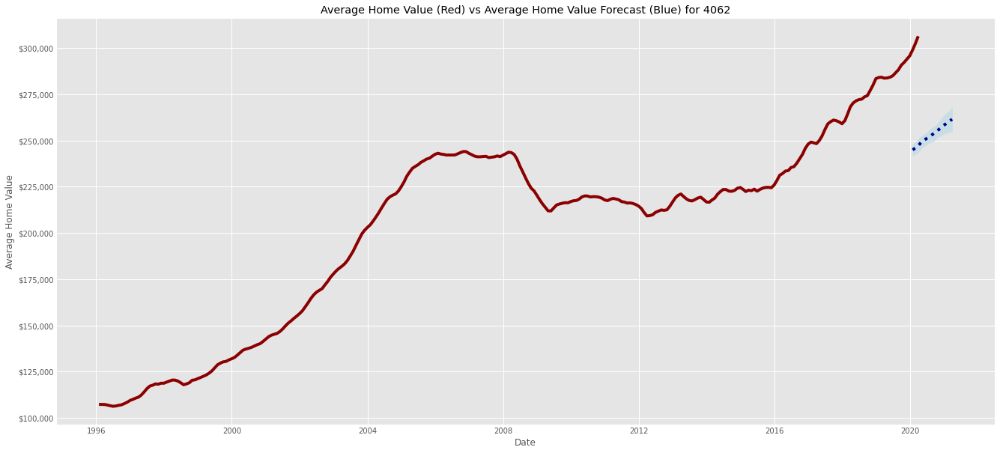

2019-12-31 00:00:00


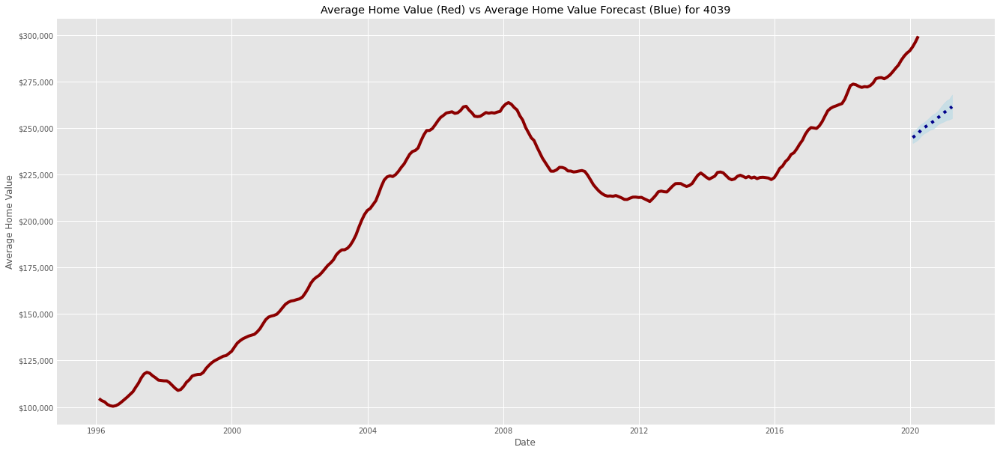

2019-12-31 00:00:00


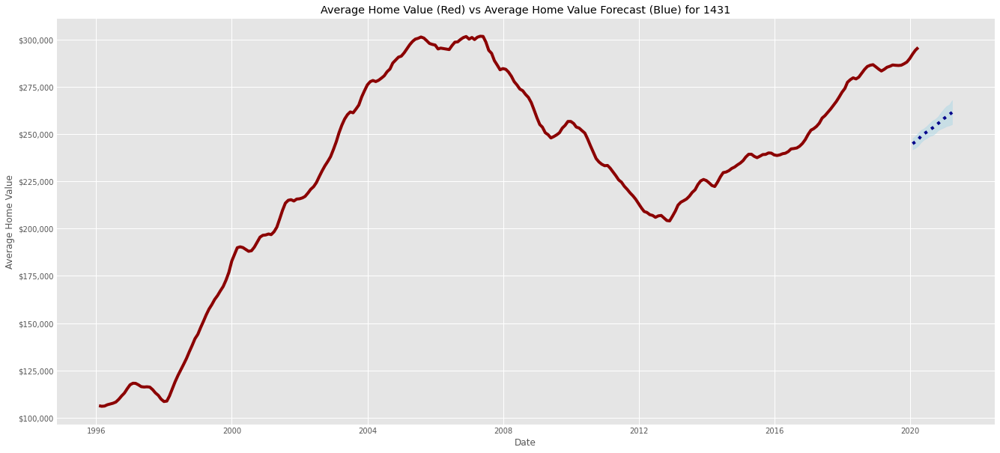

2019-12-31 00:00:00


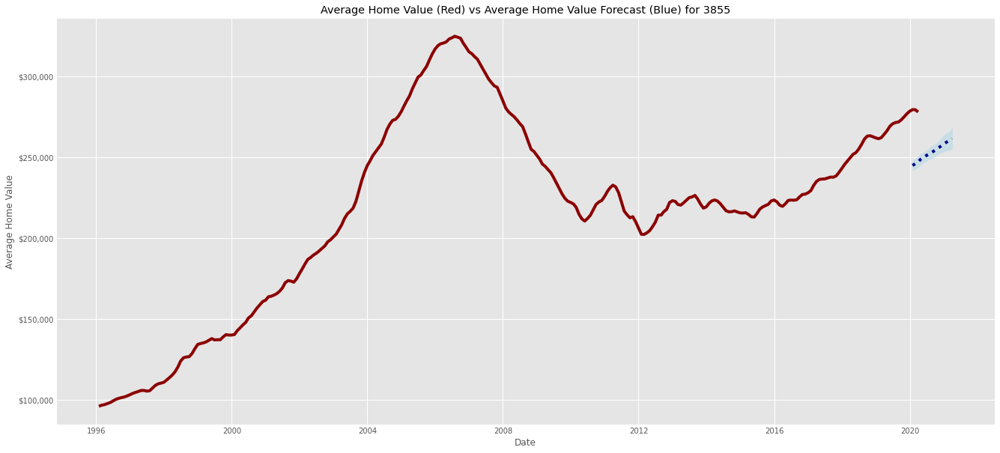

2019-12-31 00:00:00


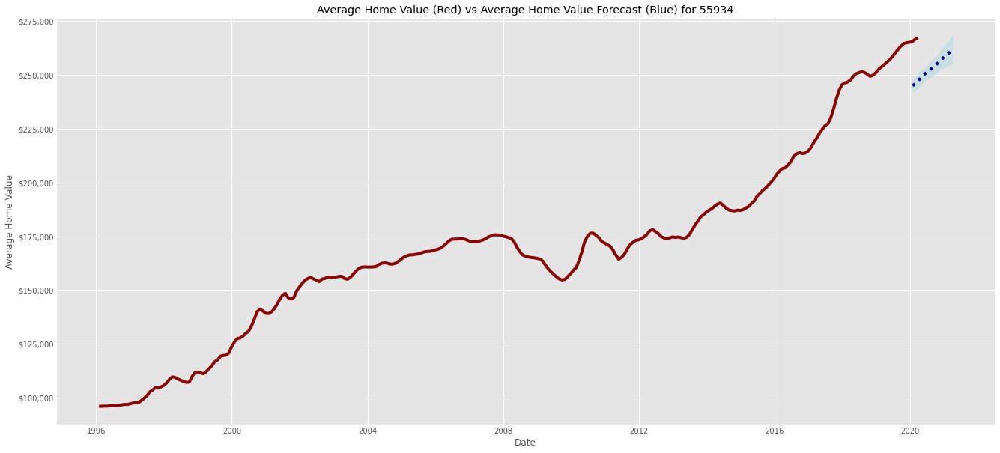

2019-12-31 00:00:00


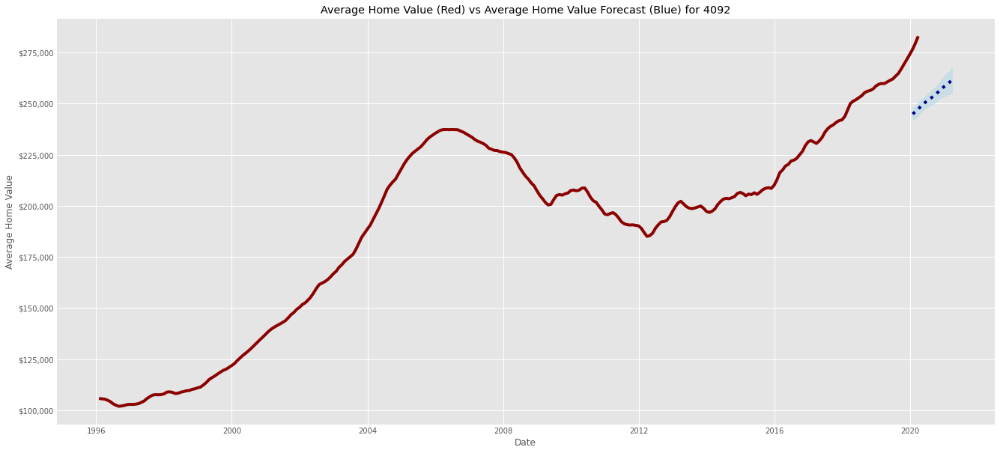

2019-12-31 00:00:00


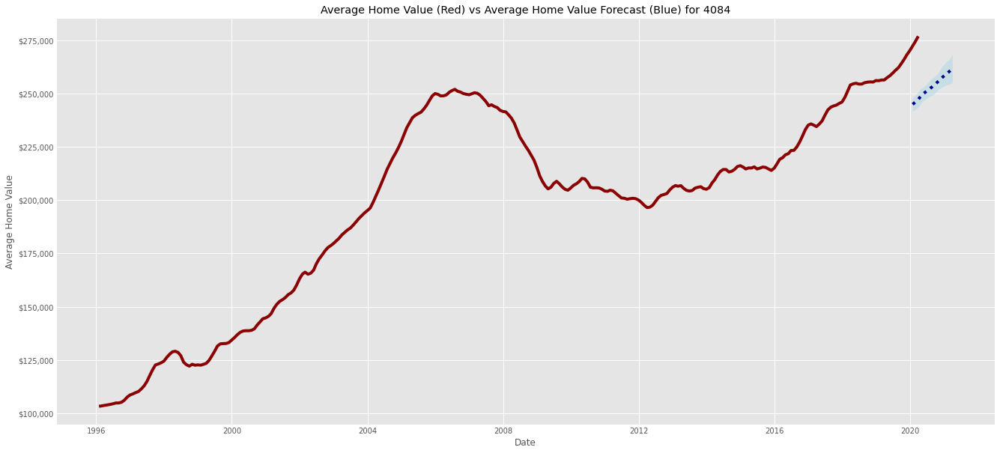

2019-12-31 00:00:00


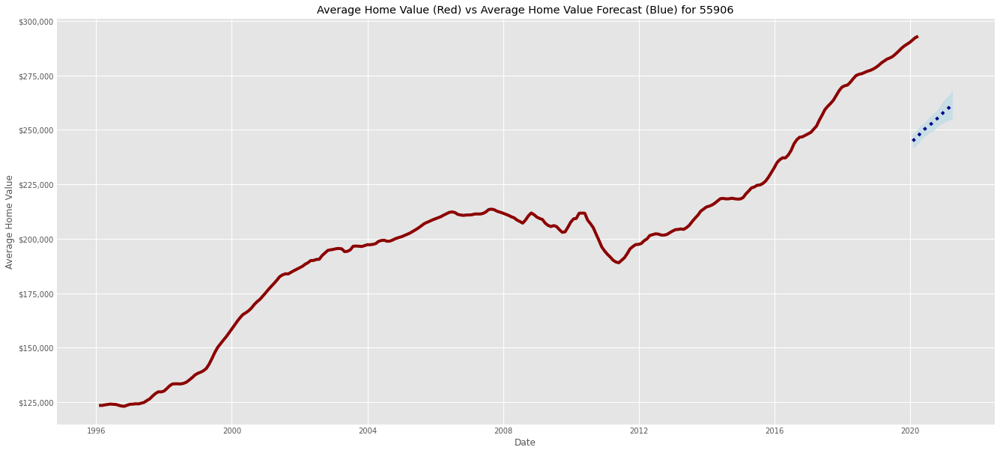

2019-12-31 00:00:00


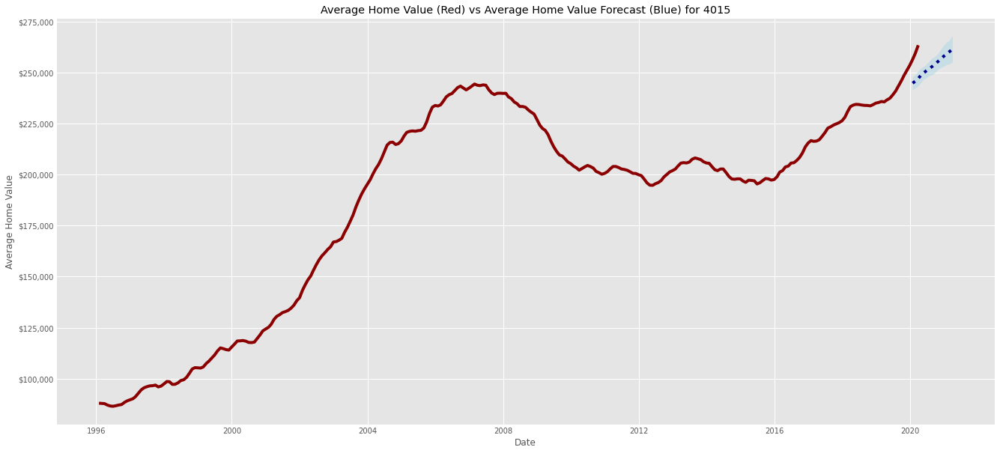

2019-12-31 00:00:00


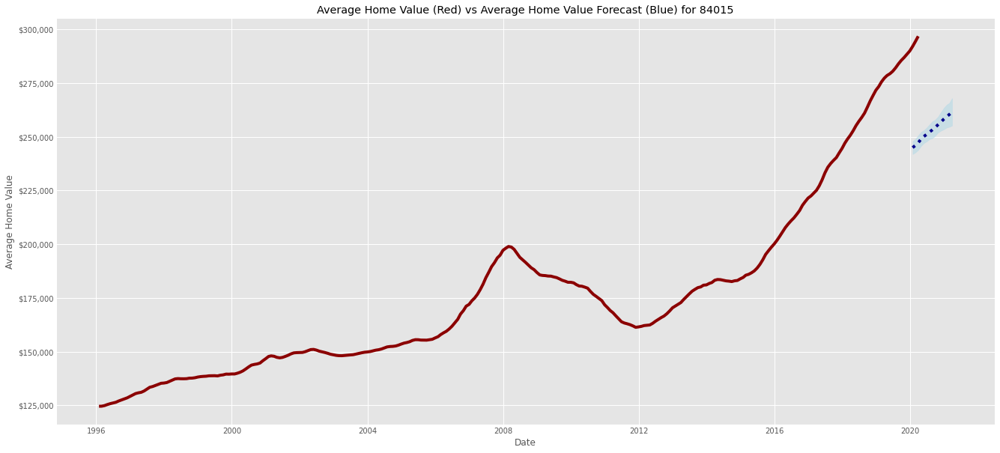

2019-12-31 00:00:00


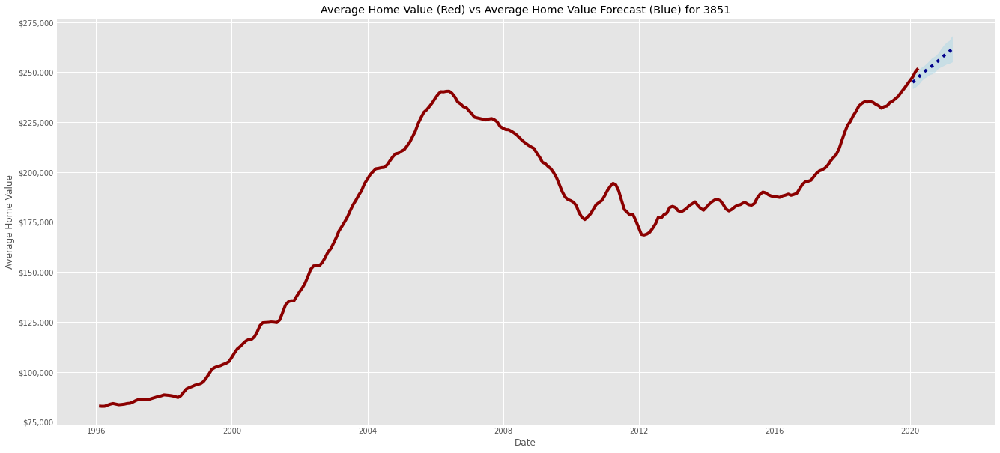

2019-12-31 00:00:00


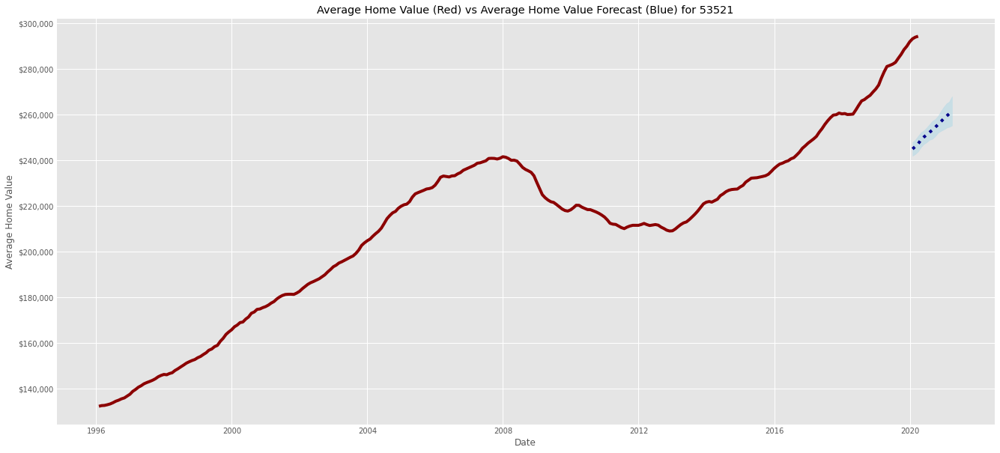

2019-12-31 00:00:00


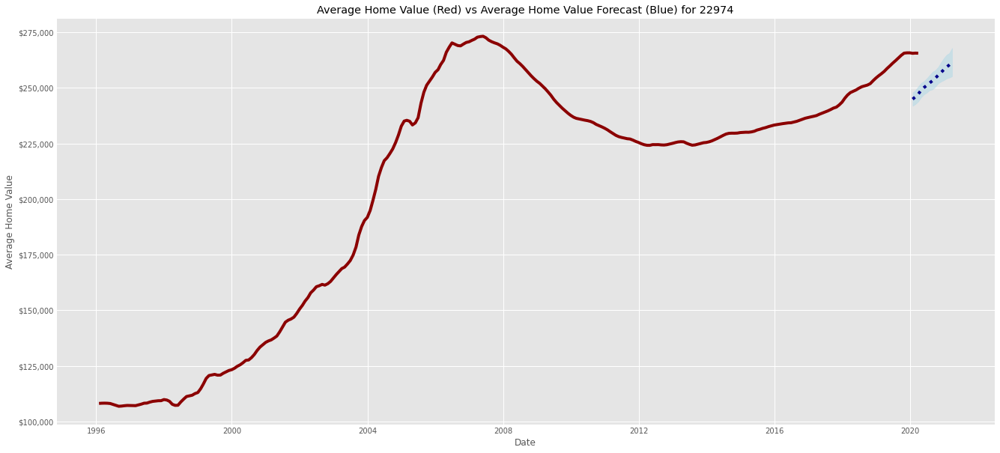

2019-12-31 00:00:00


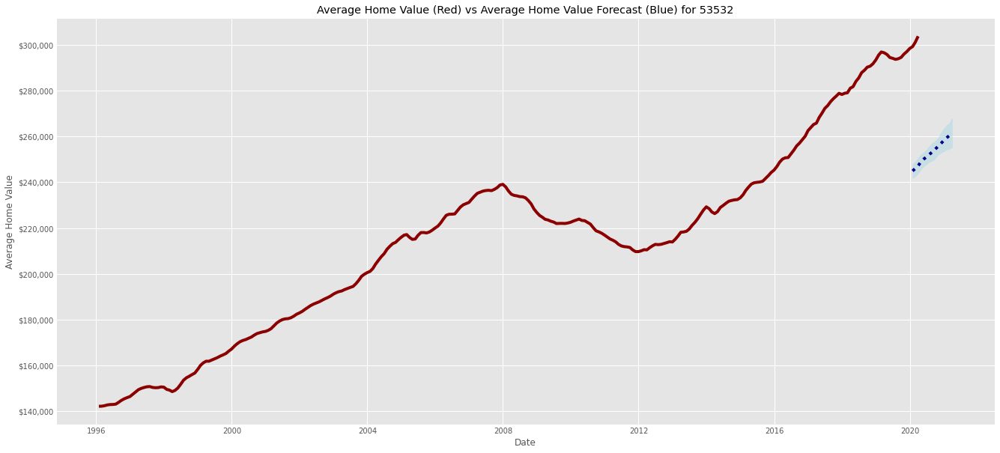

2019-12-31 00:00:00


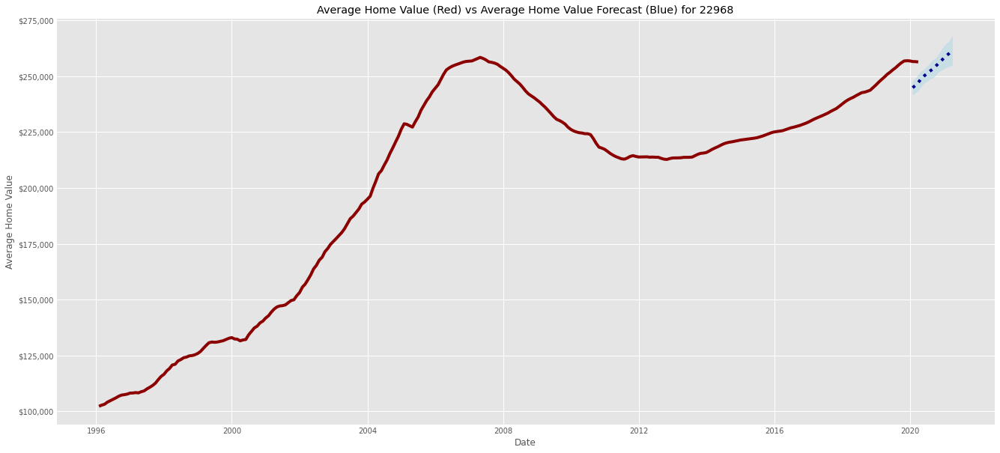

2019-12-31 00:00:00


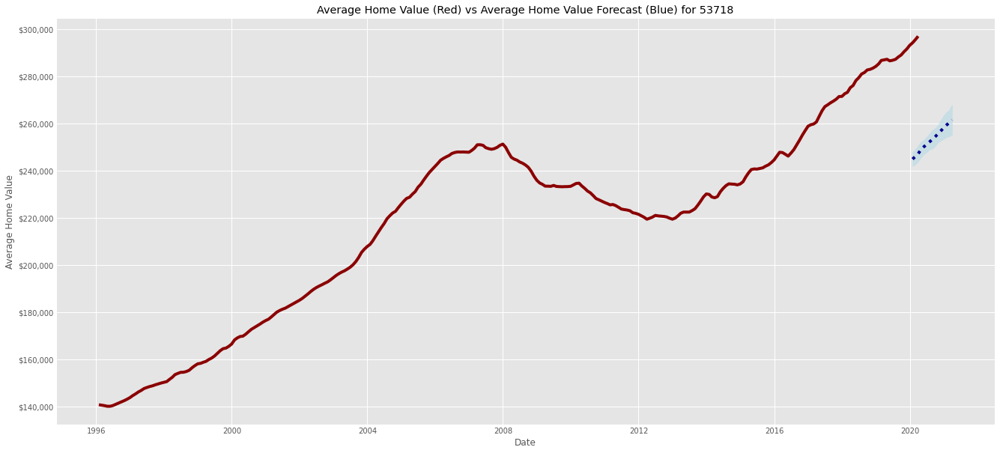

2019-12-31 00:00:00


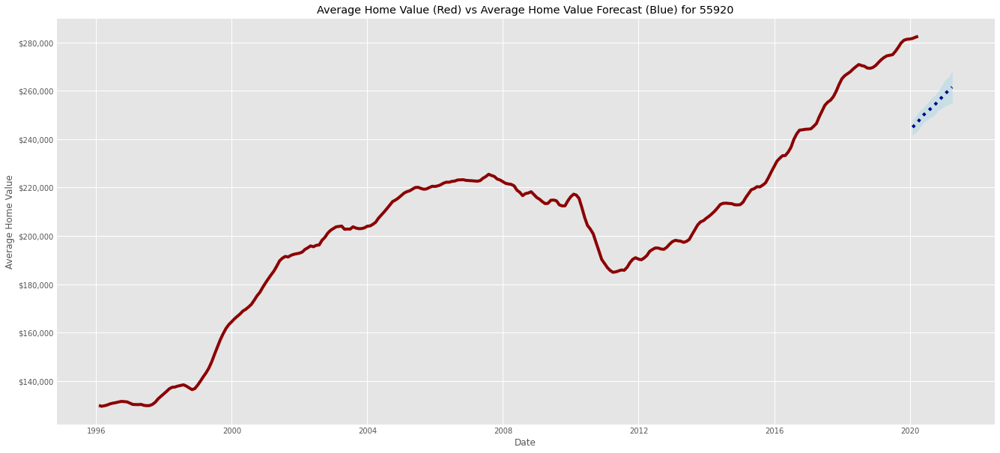

2019-12-31 00:00:00


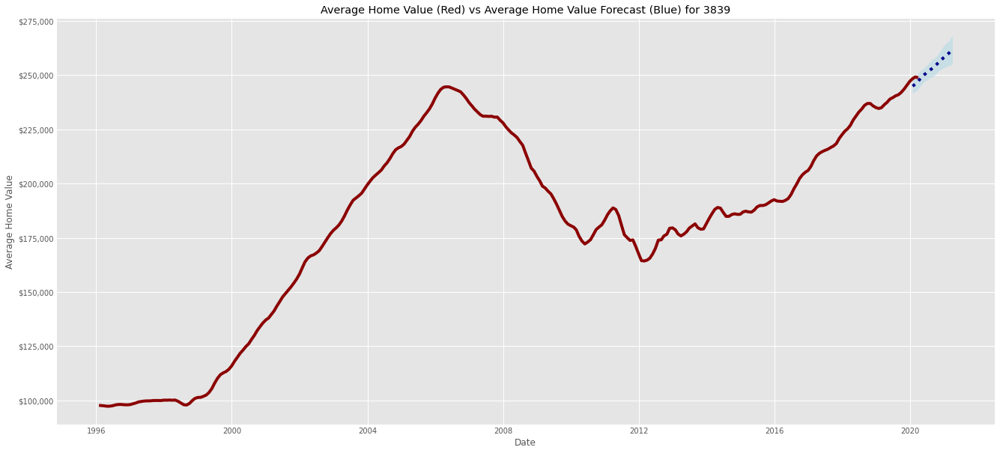

2019-12-31 00:00:00


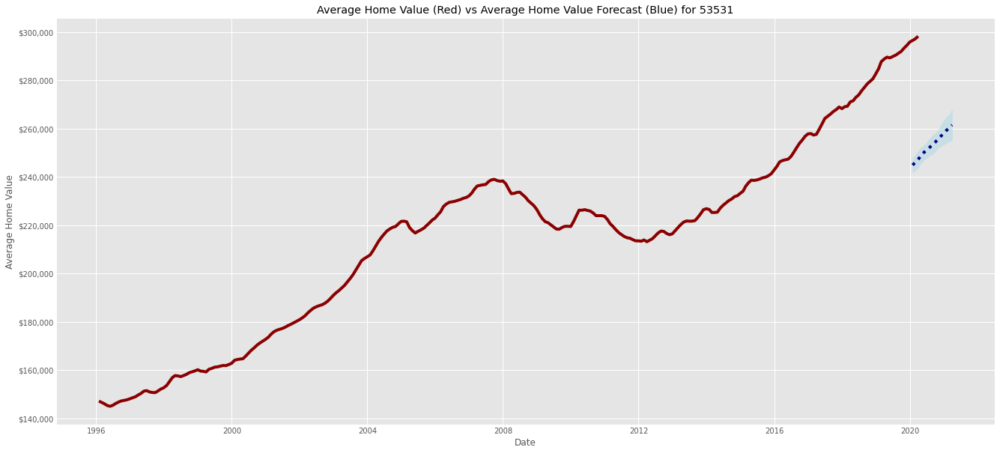

2019-12-31 00:00:00


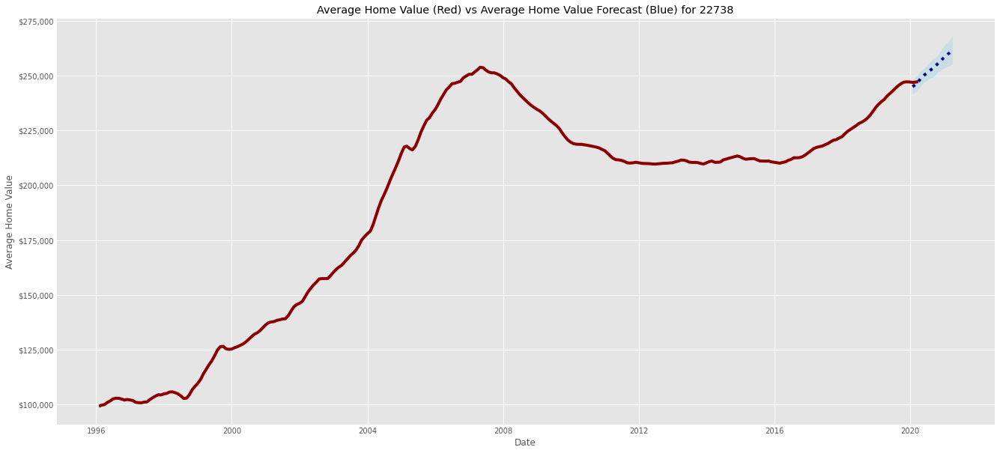

2019-12-31 00:00:00


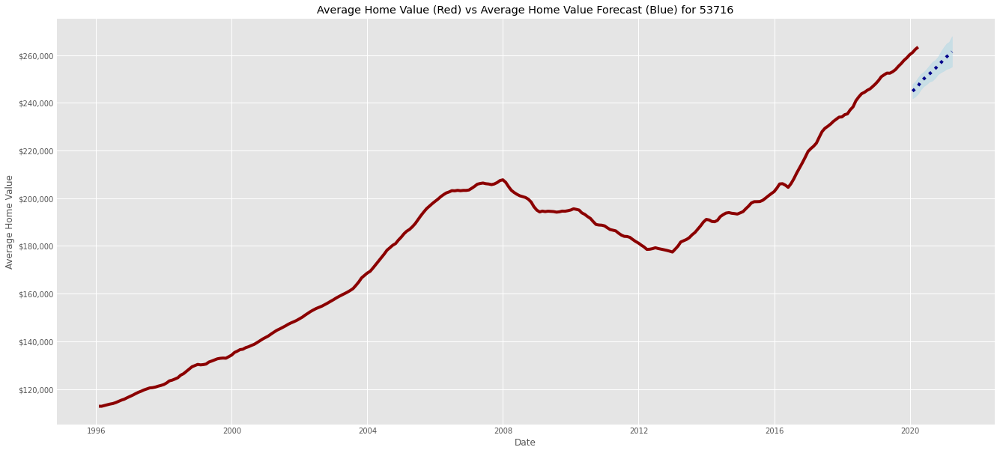

2019-12-31 00:00:00


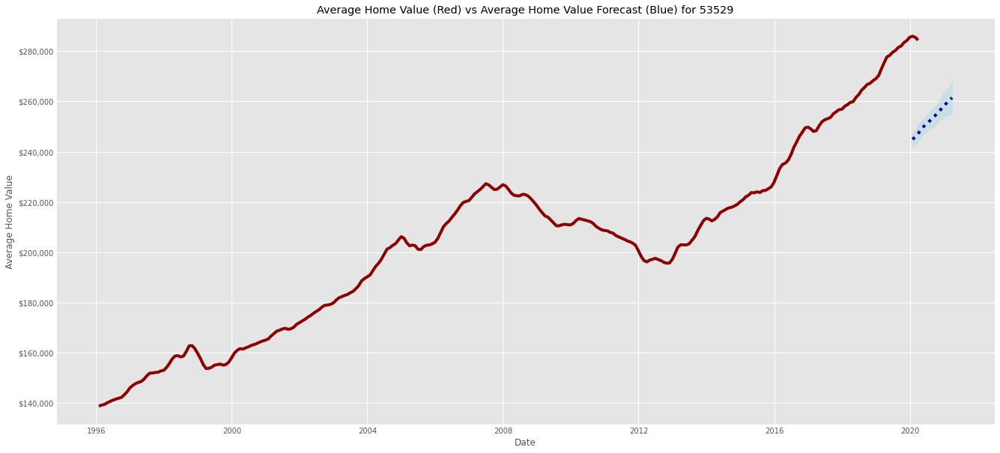

2019-12-31 00:00:00


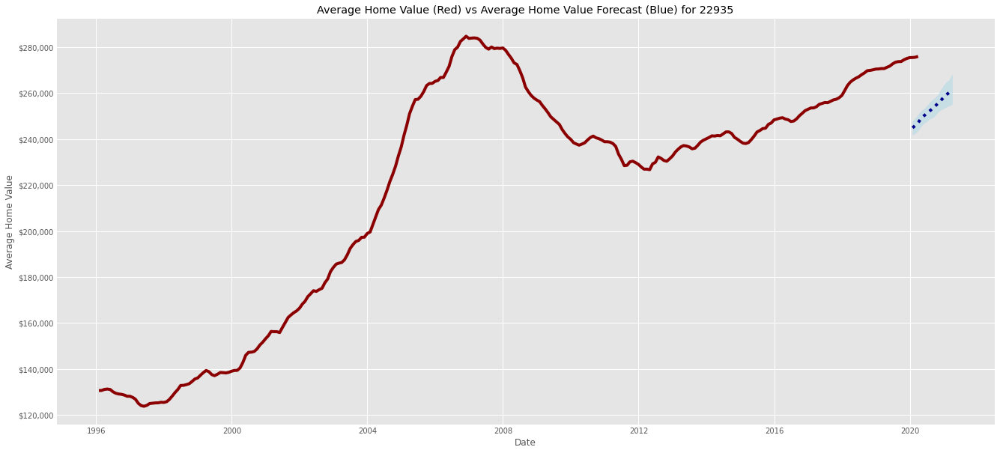

2019-12-31 00:00:00


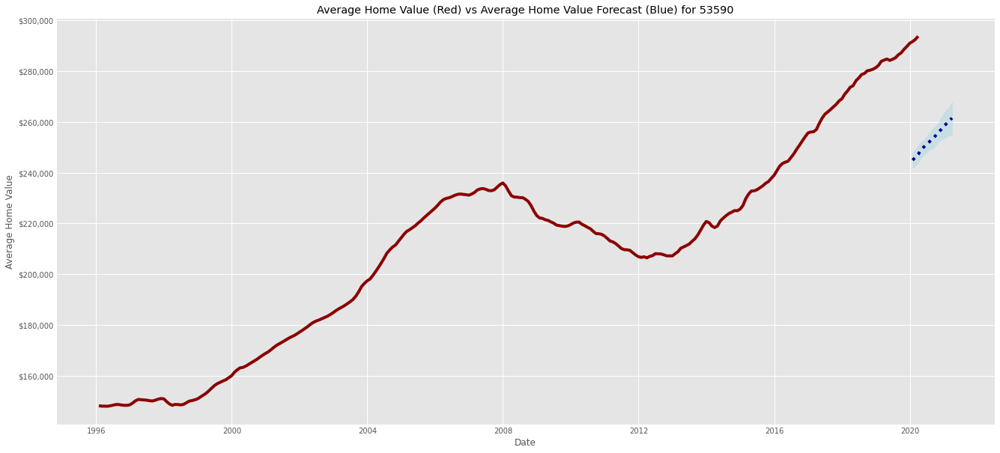

2019-12-31 00:00:00


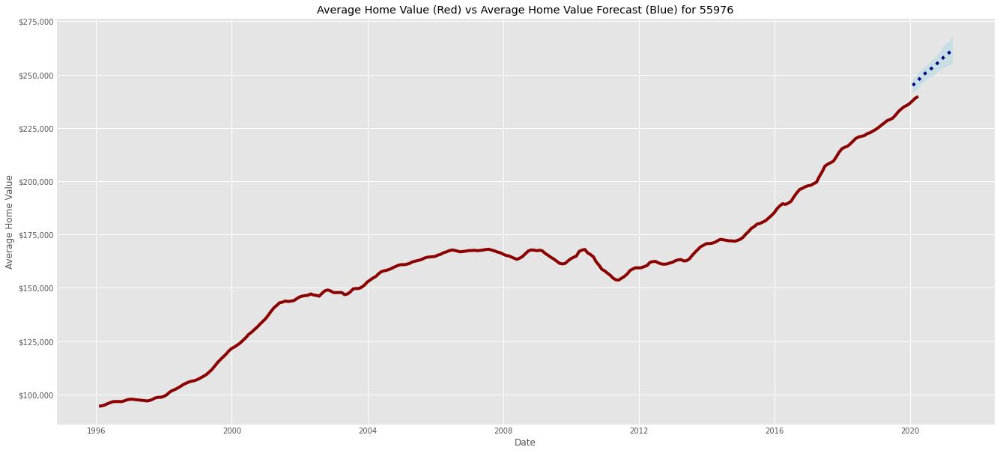

2019-12-31 00:00:00


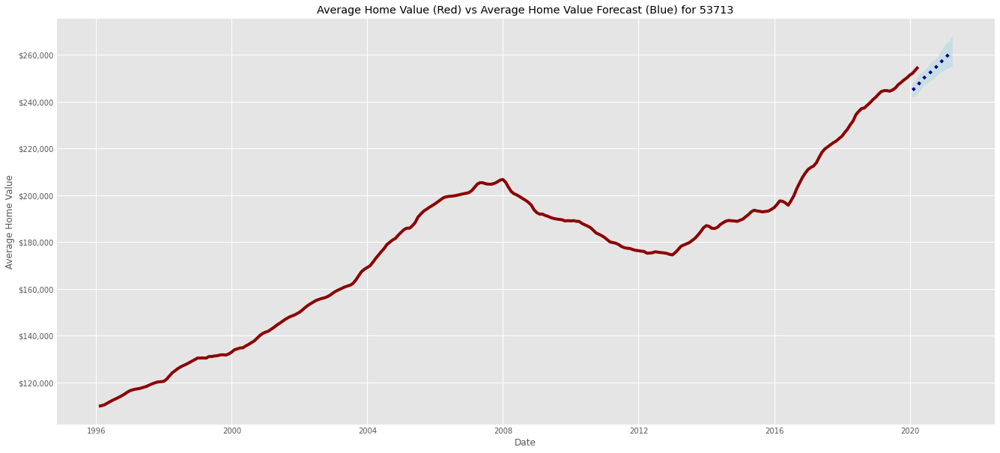

2019-12-31 00:00:00


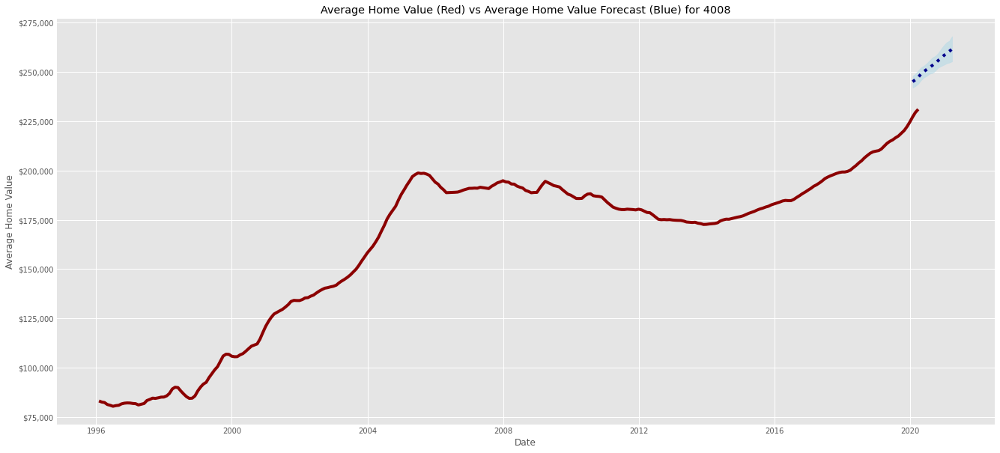

2019-12-31 00:00:00


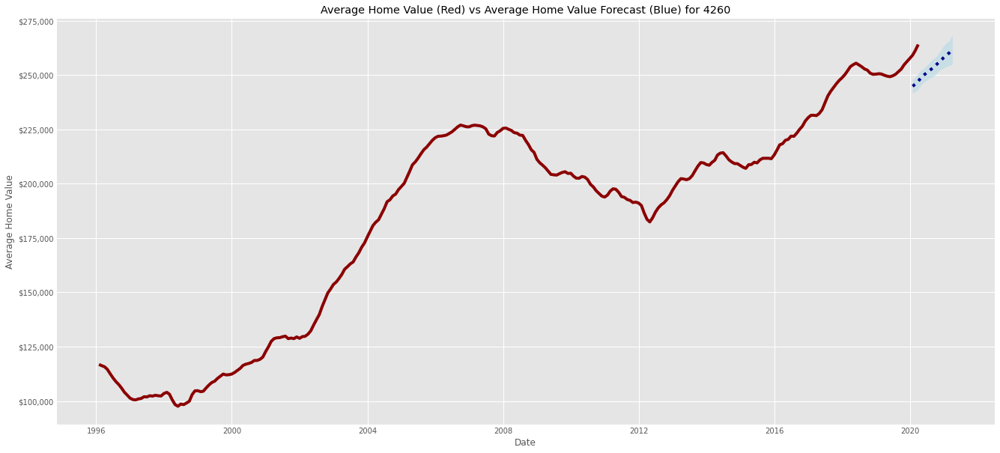

2019-12-31 00:00:00


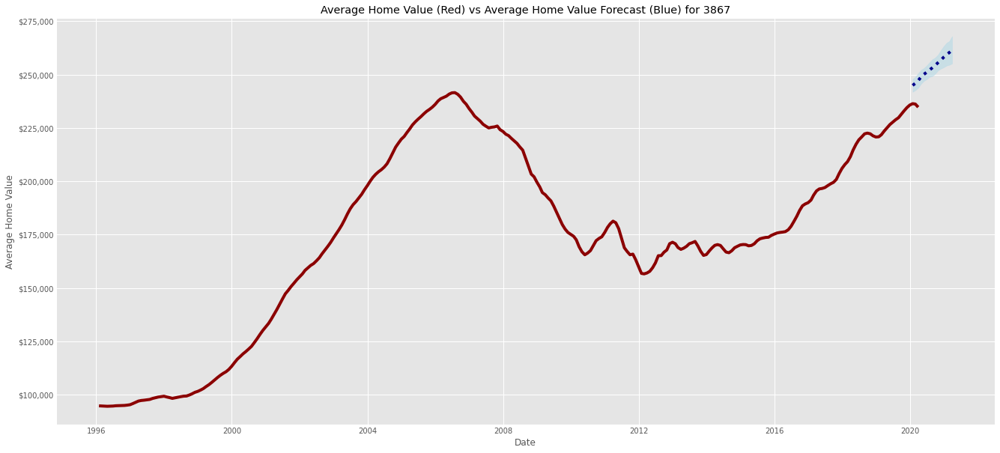

2019-12-31 00:00:00


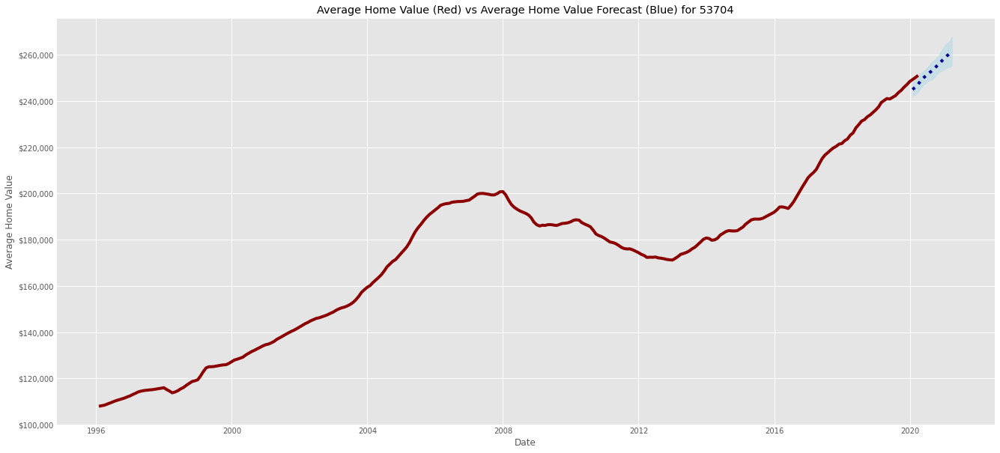

2019-12-31 00:00:00


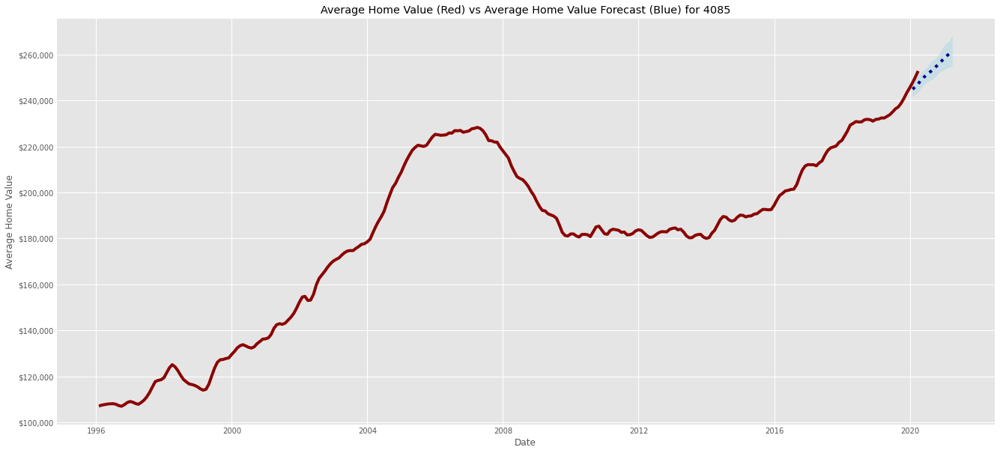

2019-12-31 00:00:00


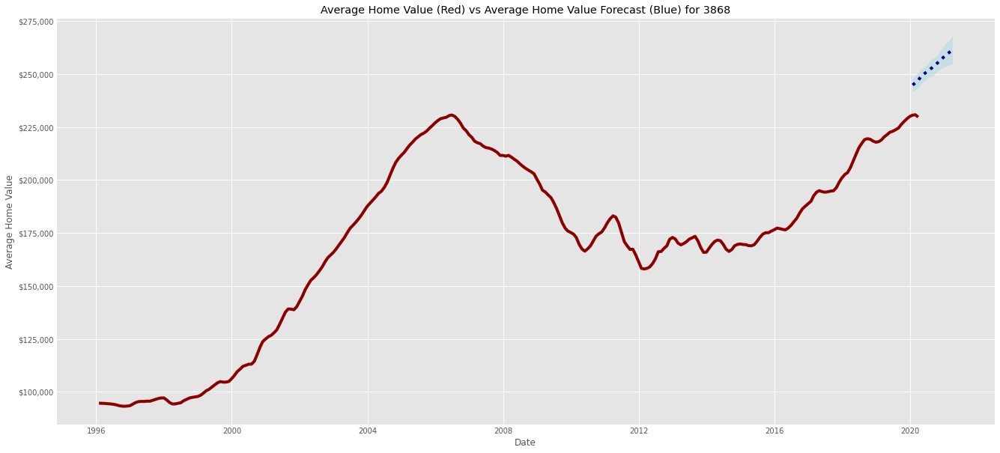

2019-12-31 00:00:00


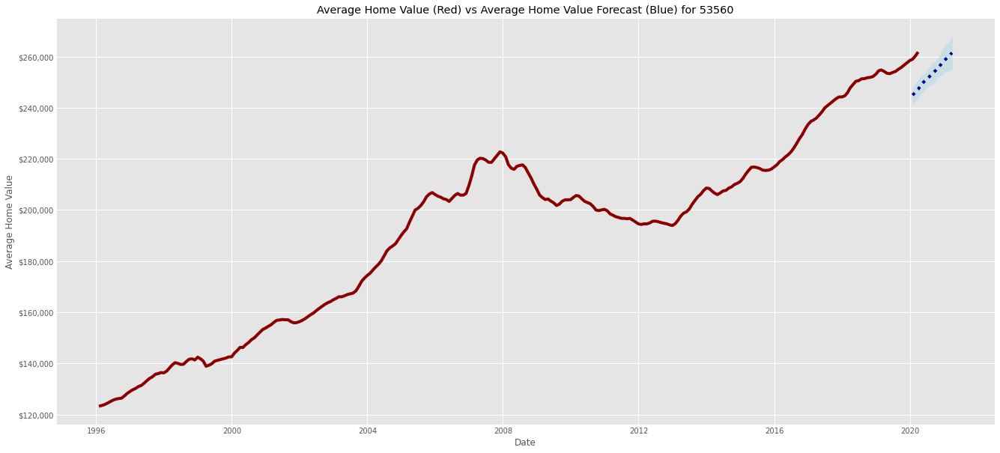

2019-12-31 00:00:00


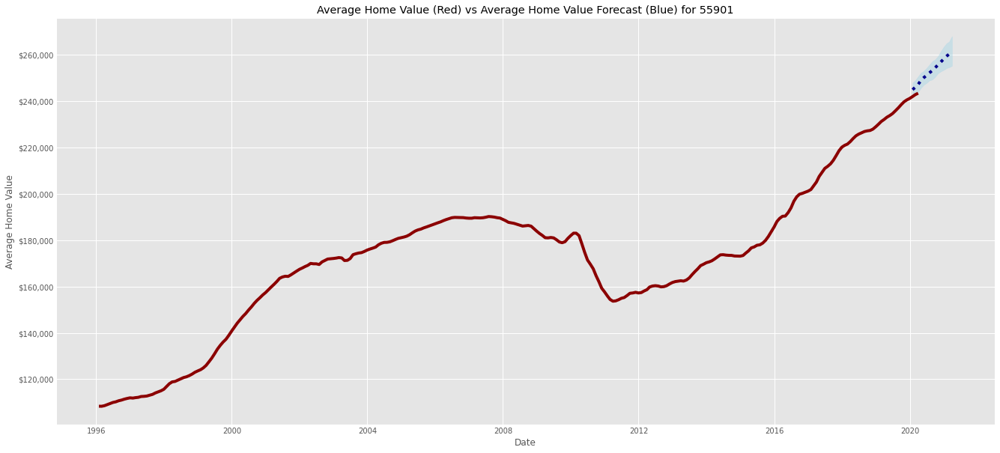

2019-12-31 00:00:00


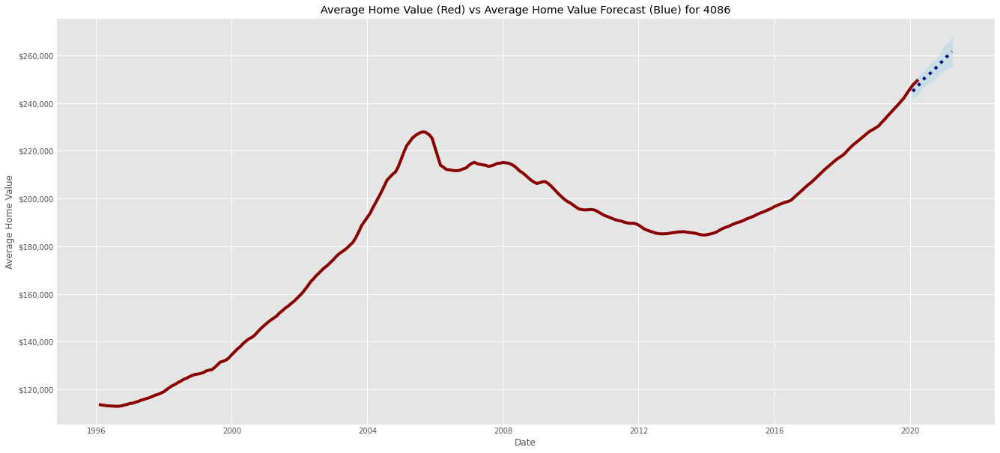

2019-12-31 00:00:00


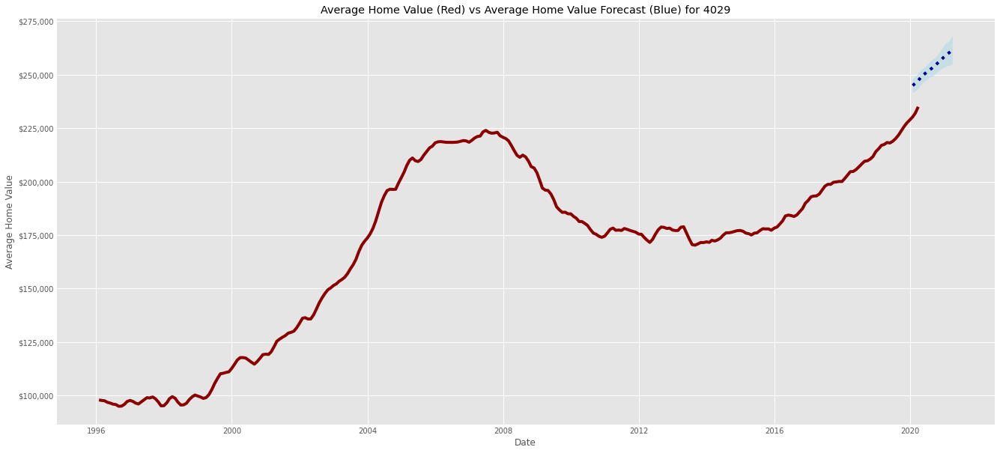

2019-12-31 00:00:00


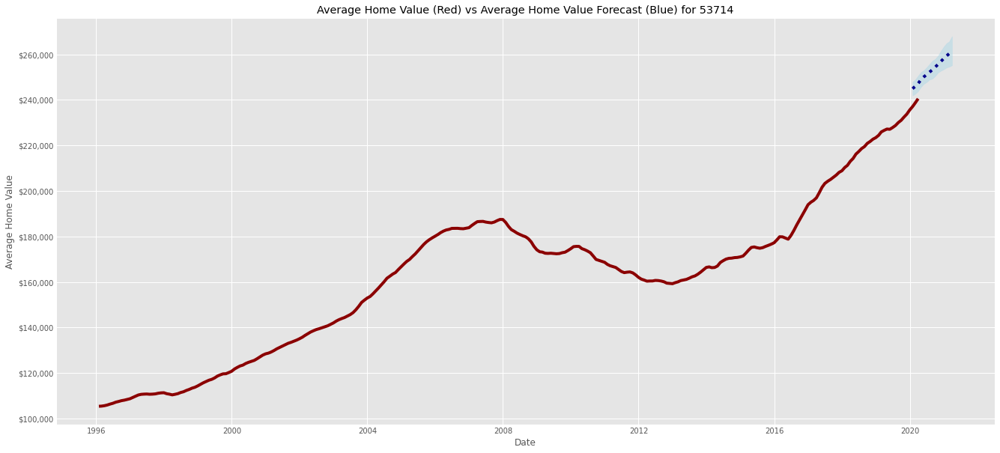

2019-12-31 00:00:00


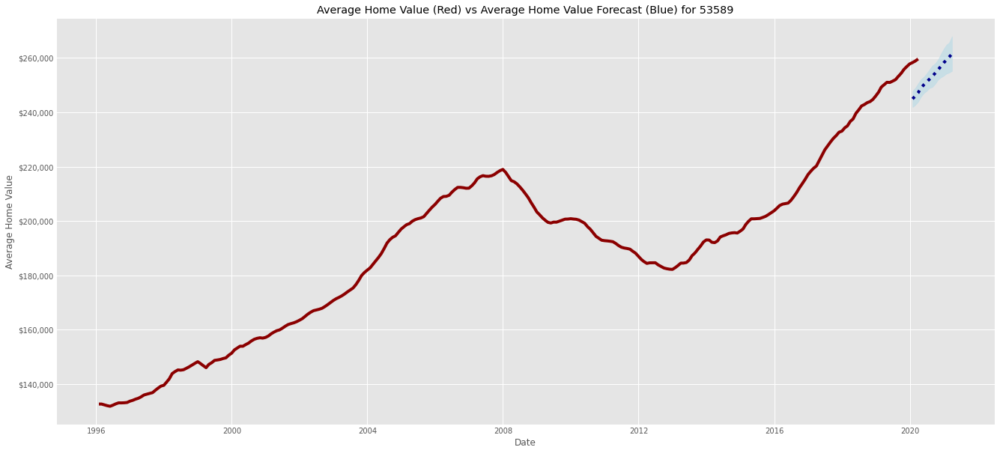

2019-12-31 00:00:00


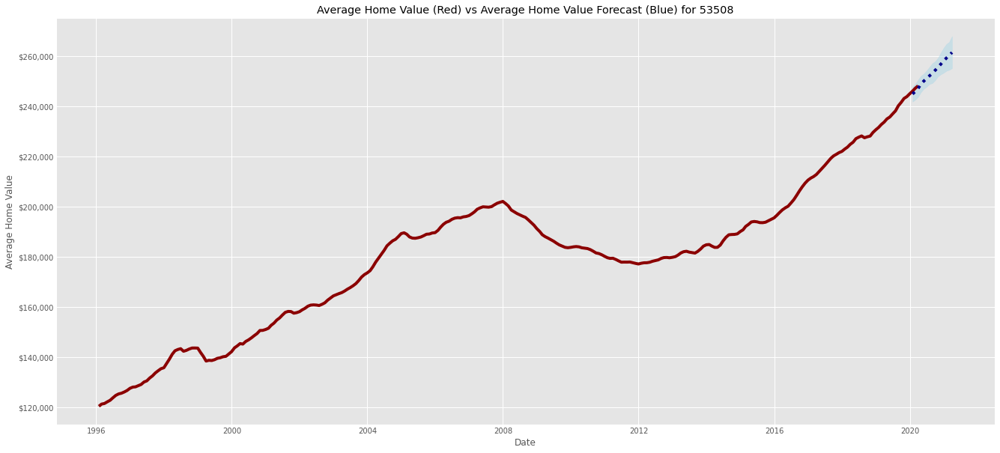

2019-12-31 00:00:00


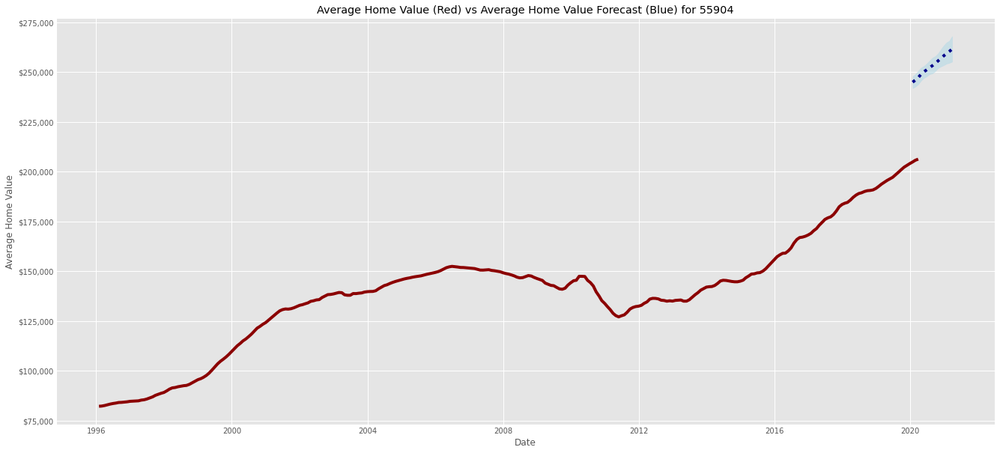

2019-12-31 00:00:00


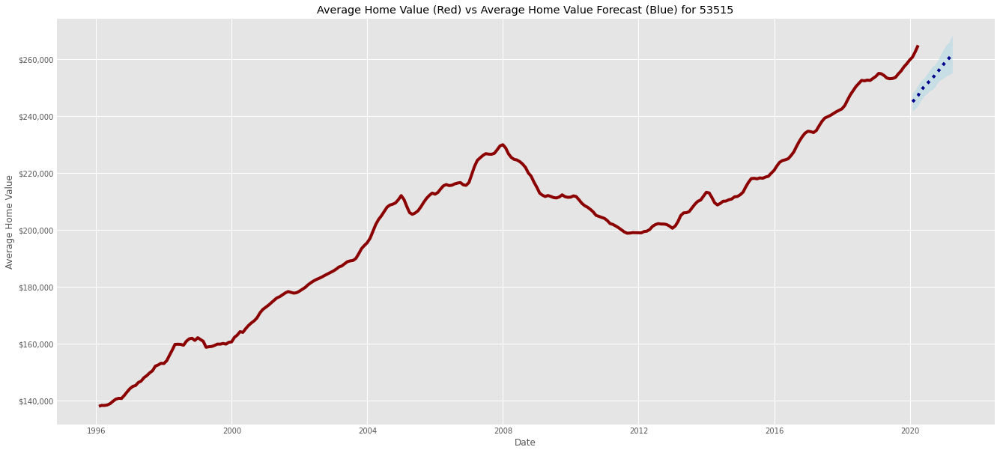

2019-12-31 00:00:00


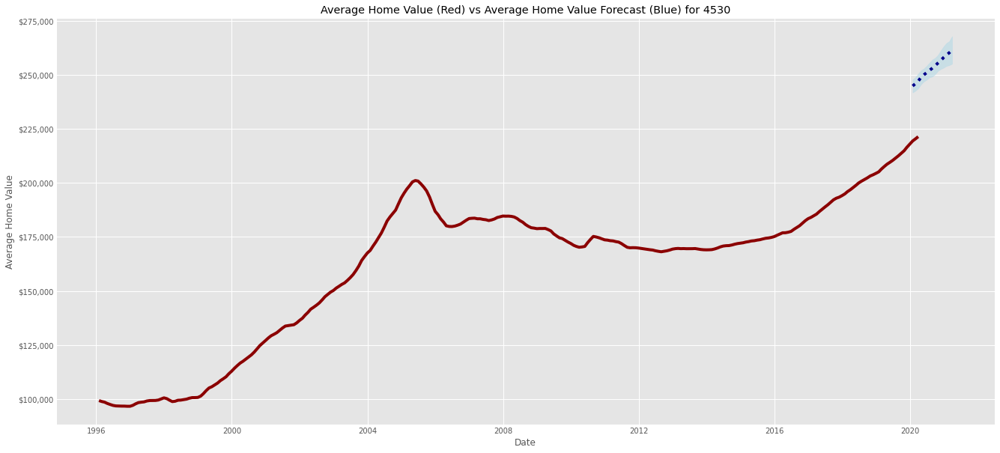

2019-12-31 00:00:00


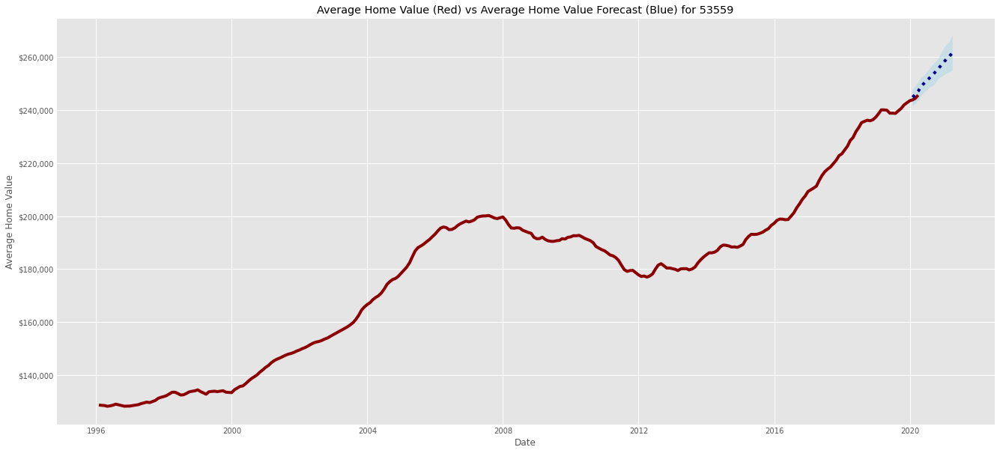

2019-12-31 00:00:00


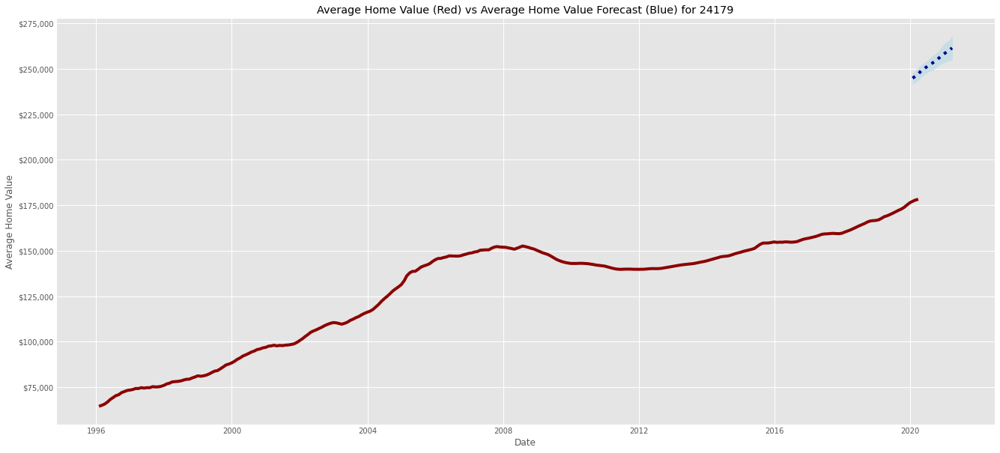

2019-12-31 00:00:00


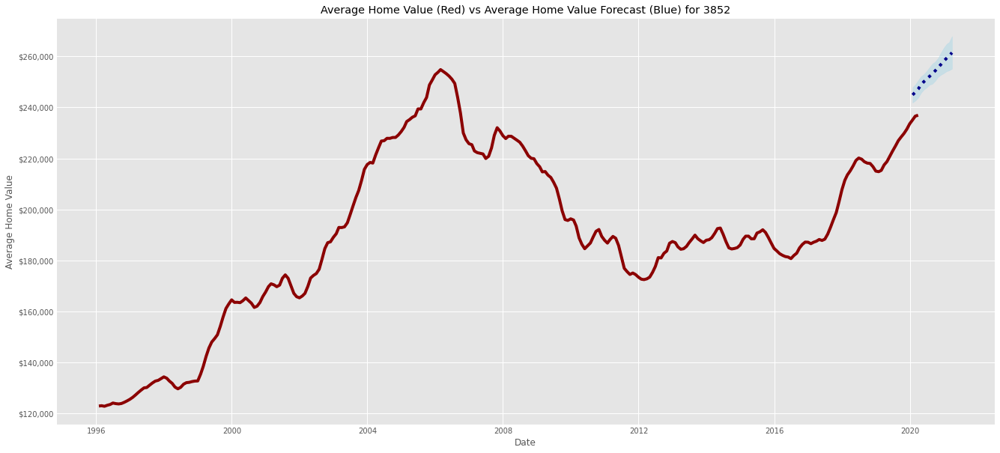

2019-12-31 00:00:00


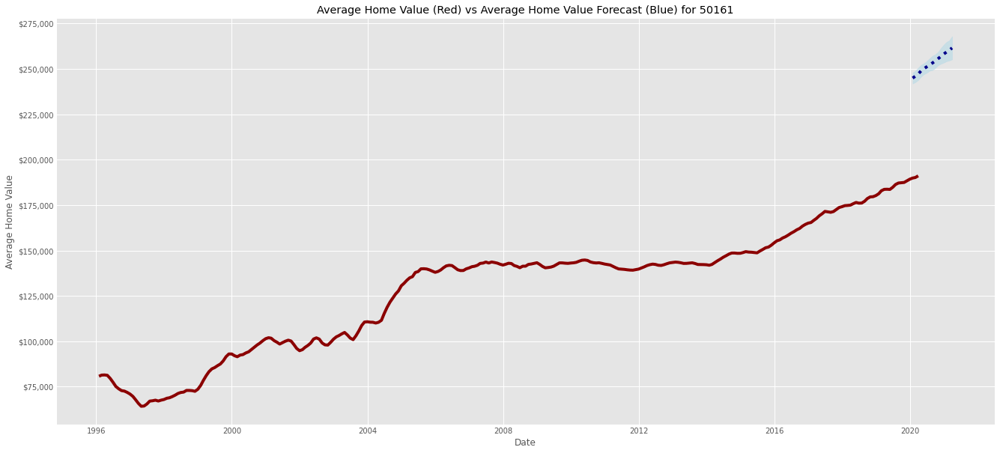

2019-12-31 00:00:00


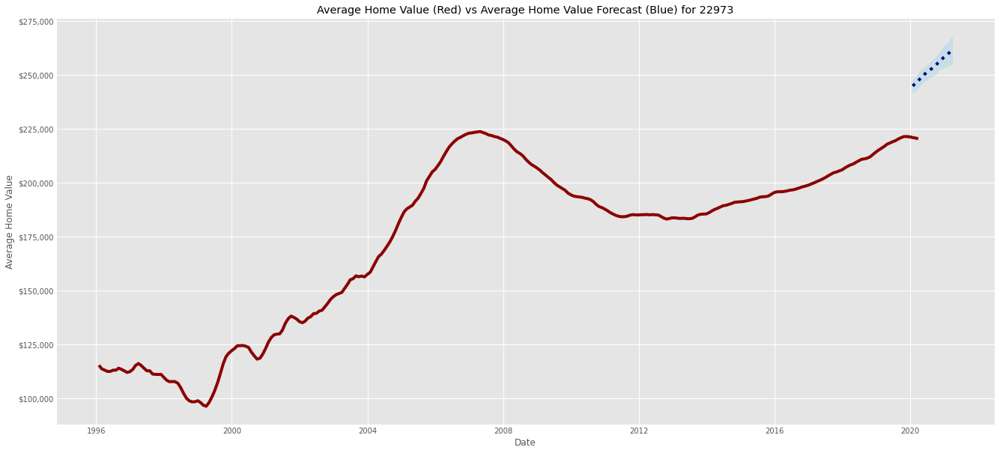

2019-12-31 00:00:00


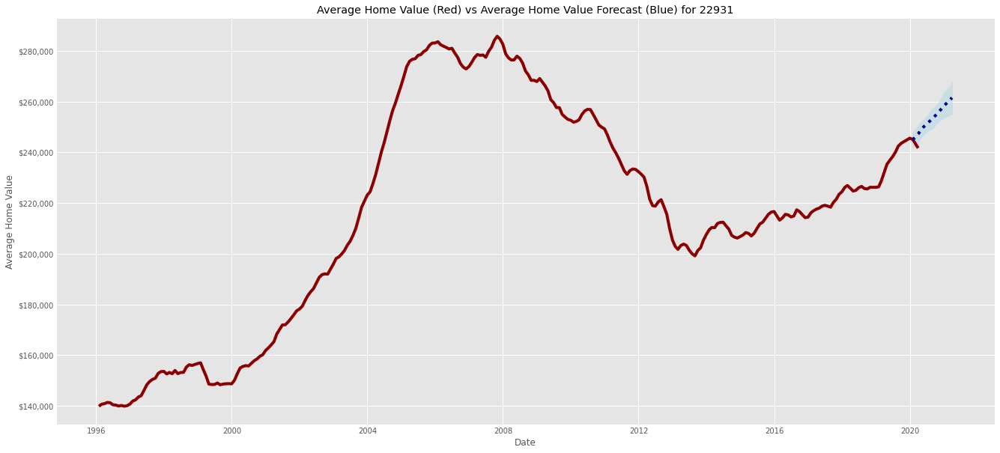

2019-12-31 00:00:00


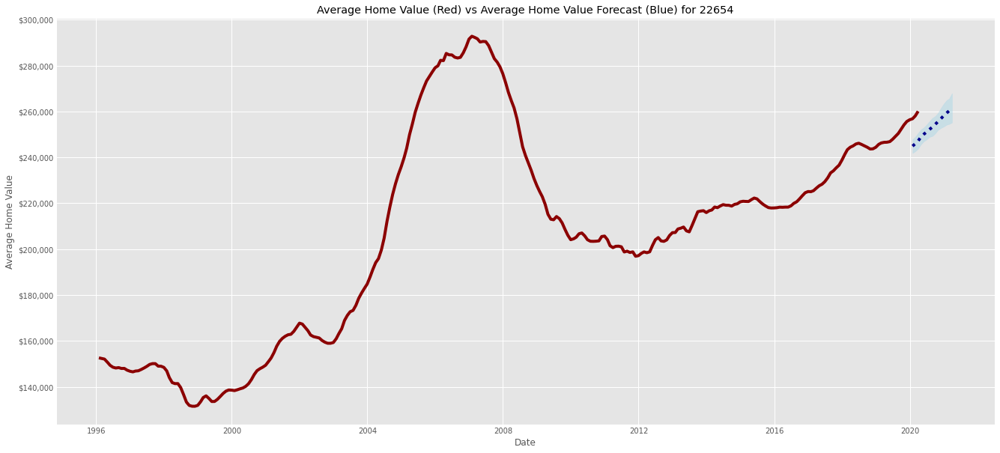

2019-12-31 00:00:00


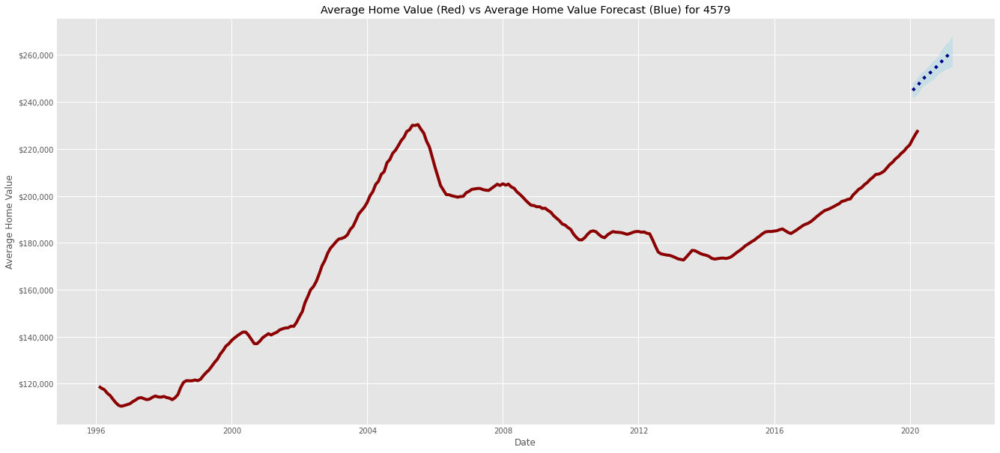

2019-12-31 00:00:00


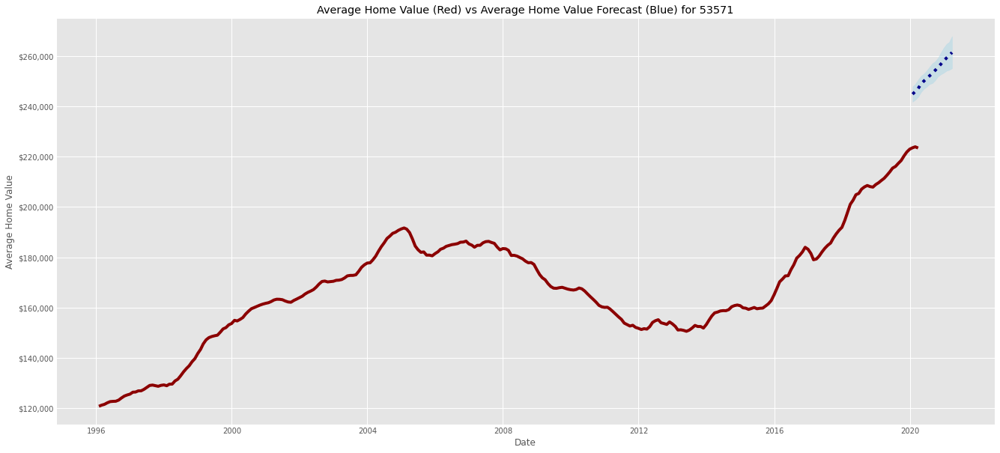

2019-12-31 00:00:00


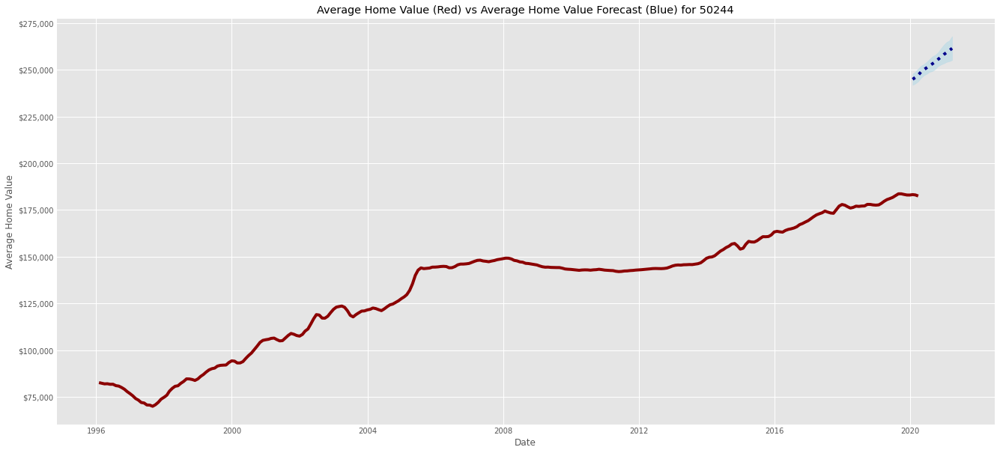

2019-12-31 00:00:00


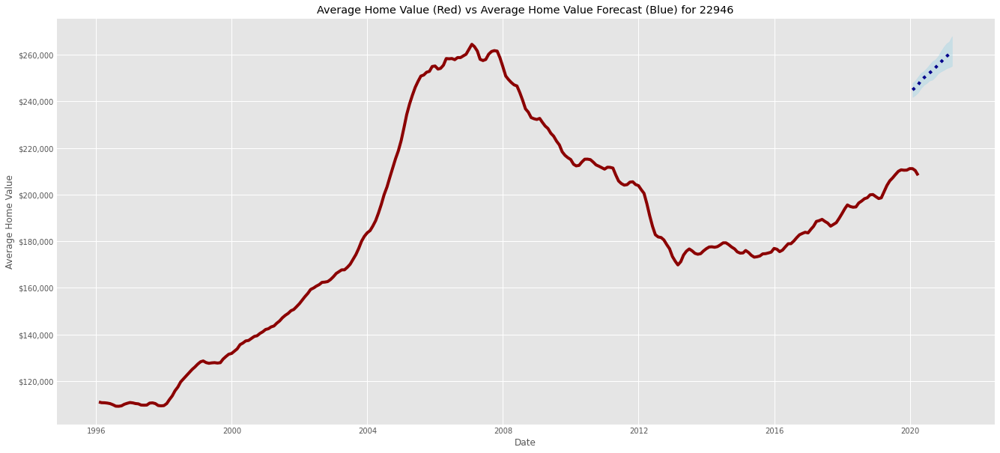

2019-12-31 00:00:00


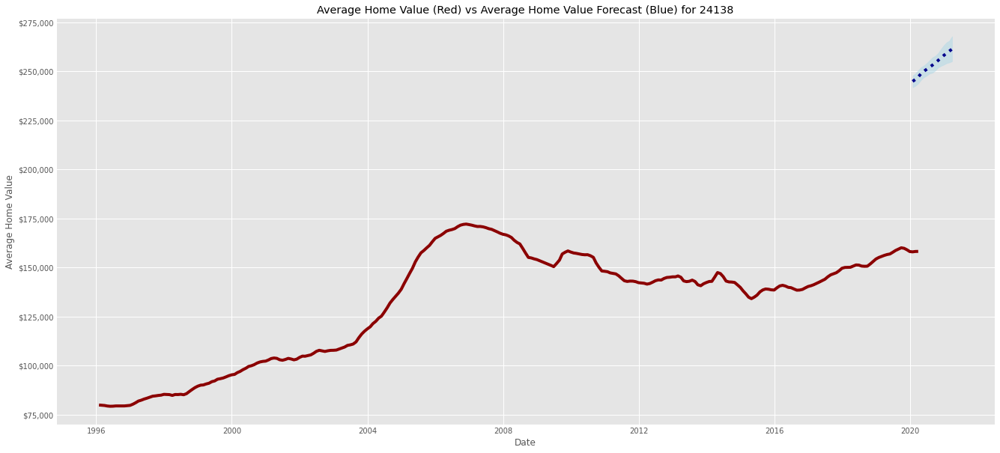

2019-12-31 00:00:00


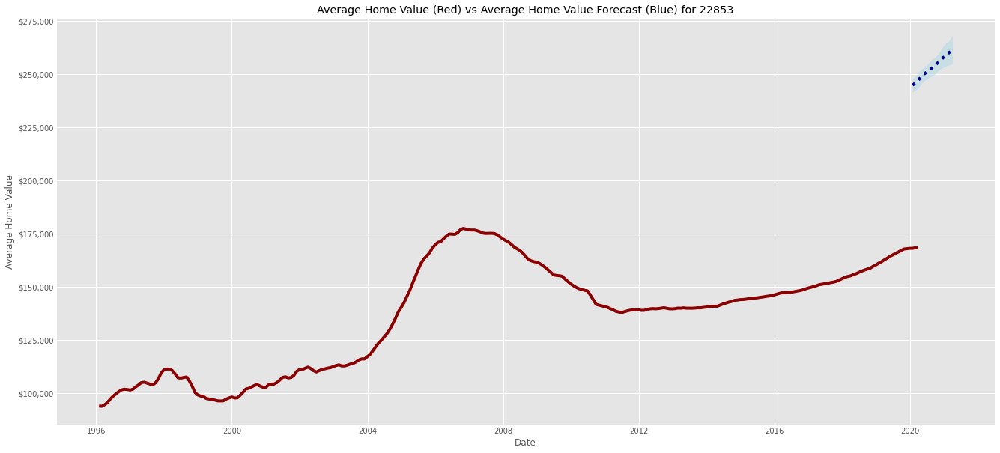

2019-12-31 00:00:00


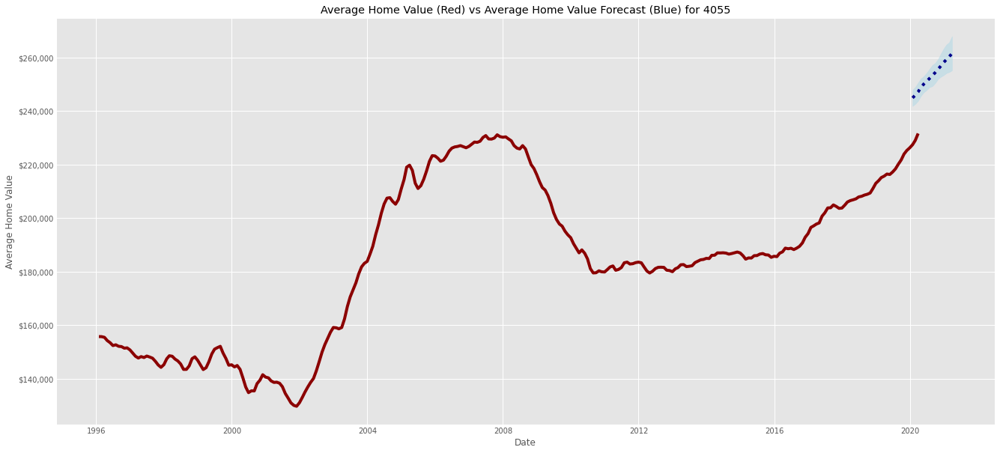

2019-12-31 00:00:00


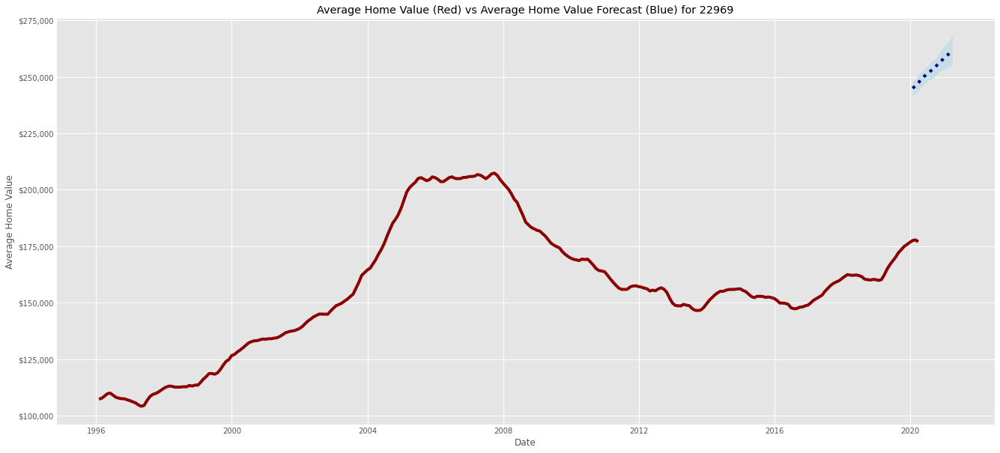

In [ ]:
plt.rcParams['figure.figsize']=(20,10)
plt.style.use('ggplot')
pd.plotting.register_matplotlib_converters()
for zip in zips:
  new_df = final_evals[final_evals['zip_code']==zip]
  connect_date = zillow_long_DF1.index[-4]
  print(connect_date)
  mask = (new_DF.index > connect_date)
  new_DF1 = new_DF.loc[mask]
  old_DF = zillow_long_DF1[zip].to_frame()
  old_DF.rename(columns={(zip): ('zip_code')}, inplace=True)
  viz_df = old_DF.join(new_DF1[['yhat', 'yhat_lower','yhat_upper']], how = 'outer')
  #viz_df.set_index('ds', inplace=True)
  fig, ax1 = plt.subplots()
  ax1.plot(viz_df.zip_code,color='darkred')
  ax1.plot(viz_df.yhat, color='darkblue', linestyle=':')
  ax1.fill_between(viz_df.index, viz_df['yhat_upper'], viz_df['yhat_lower'], alpha=0.5, color='lightblue')
  begin = 'Average Home Value (Red) vs Average Home Value Forecast (Blue) for '
  title = begin + str(zip)
  ax1.set_title(title)
  ax1.set_ylabel('Average Home Value')
  ax1.set_xlabel('Date')
  fmt = '${x:,.0f}'
  tick = mtick.StrMethodFormatter(fmt)
  ax1.yaxis.set_major_formatter(tick)
  plt.show(ax1)


In [ ]:
zips1 = [22931,53508,55901,55976,22738]
final_req_comps = sorted_stats[sorted_stats['RegionName'].isin(zips1)]
final_req_comps = final_req_comps.drop_duplicates(subset = 'RegionName',keep='last')
final_req_comps

,RegionName,Metro,Unemployment_Rate,Violent_Crime_Totals,Property_Crime_Totals,State,1996-01-31,2019-12-31,ChangeOverTime
3291,22738,Charlottesville,2.3,198.3,1462.3,VA,99237.0,247080.0,147843.0
6289,55976,Rochester,2.6,137.7,1459.6,MN,94497.0,236453.0,141956.0
6281,55901,Rochester,2.6,137.7,1459.6,MN,108370.0,241123.0,132753.0
2190,53508,Madison,2.4,202.7,1915.7,WI,120507.0,245002.0,124495.0
193,22931,Charlottesville,2.5,198.3,1462.3,VA,139897.0,245534.0,105637.0


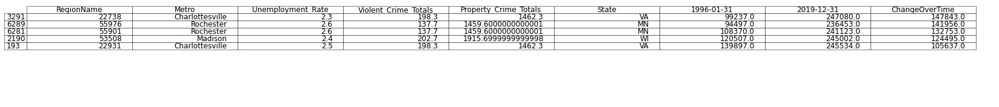

<Figure size 1440x720 with 0 Axes>

In [ ]:

fig, ax = plt.subplots(figsize=(25, 3)) 
# no axes
ax.xaxis.set_visible(False)  
ax.yaxis.set_visible(False)  
# no frame
ax.set_frame_on(False)  
# plot table
tab = table(ax, final_req_comps, loc='upper right')  
# set font manually
tab.auto_set_font_size(False)
tab.set_fontsize(12) 
plt.show()
# save the result
plt.savefig('finalreqs.png')